In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

import networkx as nx
from matplotlib.colors import Normalize
from matplotlib.gridspec import GridSpec
from matplotlib.font_manager import findfont, FontProperties
import matplotlib.patches as patches

import cmasher as cmr

In [2]:
with open('./data/data_synaptic_upscaling_chaos_session_1.pickle', 'rb') as handle:
    data = pickle.load(handle)

In [3]:
with open('./data/data_curation.pickle', 'rb') as handle:
    data1 = pickle.load(handle)

In [4]:
colors = ['gold', 'cyan', 'magenta', 'red', 'green', 'blue',  'darkorange', 'purple']

In [5]:
params = {'legend.fontsize': 7,
         'axes.labelsize': 7,
         'axes.titlesize':7,
         'xtick.labelsize':7,
         'ytick.labelsize':7,
         'axes.linewidth': 0.4,
         'xtick.major.width':0.4,
         'ytick.major.width':0.4,
         'xtick.major.size':3,
         'ytick.major.size':3}
plt.rcParams.update(params)


plt.rcParams['font.sans-serif'] = "Arial"
plt.rcParams['font.family'] = "sans-serif"
# 
# 
# 
# 
font = findfont(FontProperties(family=['sans-serif']))

In [6]:
def draw_brace(ax, xspan, yy):
    """Draws an annotated brace on the axes."""

    text=""
    xmin, xmax = xspan
    xspan = xmax - xmin
    ax_xmin, ax_xmax = ax.get_xlim()
    xax_span = ax_xmax - ax_xmin

    ymin, ymax = ax.get_ylim()
    yspan = ymax - ymin
    resolution = int(xspan/xax_span*100)*2+1 # guaranteed uneven
    beta = 300./xax_span # the higher this is, the smaller the radius

    x = np.linspace(xmin, xmax, resolution)
    x_half = x[:int(resolution/2)+1]
    y_half_brace = (1/(1.+np.exp(-beta*(x_half-x_half[0])))
                    + 1/(1.+np.exp(-beta*(x_half-x_half[-1]))))
    y = np.concatenate((y_half_brace, y_half_brace[-2::-1]))
    y = yy + (.05*y - .01)*yspan # adjust vertical position

    ax.autoscale(False)
    ax.plot(x, y, color='black', lw=1)

    ax.text((xmax+xmin)/2., yy+.07*yspan, text, ha='center', va='bottom')

In [14]:
def draw_brace(ax, xspan, yy):
    """Draws an annotated brace on the axes."""
    xmin, xmax = xspan
    xspan = xmax - xmin
    ax_xmin, ax_xmax = ax.get_xlim()
    xax_span = ax_xmax - ax_xmin

    ymin, ymax = ax.get_ylim()
    yspan = ymax - ymin
    resolution = int(xspan/xax_span*100)*2+1 # guaranteed uneven
    beta = 300./xax_span # the higher this is, the smaller the radius

    x = np.linspace(xmin, xmax, resolution)
    x_half = x[:int(resolution/2)+1]
    y_half_brace = (1/(1.+np.exp(-beta*(x_half-x_half[0])))
                    + 1/(1.+np.exp(-beta*(x_half-x_half[-1]))))
    y = np.concatenate((y_half_brace, y_half_brace[-2::-1]))
    y = yy - (.05*y - .01)*yspan # adjust vertical position

    ax.autoscale(False)
    ax.plot(y, x, color='black', lw=3)

In [7]:
def Fig1(left,right,top,bottom):
    fix_x = 7.08#unit in inch
    ws_x = 0.34#of the axis x lenght
    ws_y = 0.25
    distx = 0.5 #of the axis x lenght
    disty = 2
    fix_x_aux = fix_x-left-right
    ax_x = (fix_x_aux)/(2+1*distx)
    ax_y = ax_x/8
    
    fix_y = (6+5*ws_y+disty+8 + 7*ws_y) * ax_y
    fix_y_aux = fix_y-top-bottom
    ax_y = fix_y_aux/(6+5*ws_y+disty+8 + 7*ws_y)
    
    
    gsEXP = GridSpec(1,1, bottom=bottom+(disty*.7+8 + 7*ws_y)*ax_y/fix_y_aux, top=-top+(6+5*ws_y+disty+8 + 7*ws_y)*ax_y/fix_y_aux, left=0.2*left, right=0.8*(-right)+1, wspace=ws_x,hspace = ws_y)
    gsEXP_1 = GridSpec(1,1, bottom=bottom+0.125+(disty*.7+8 + 7*ws_y)*ax_y/fix_y_aux, top=-top-0.02+(6+5*ws_y+disty+8 + 7*ws_y)*ax_y/fix_y_aux, left=0.875, right=0.912, wspace=ws_x,hspace = ws_y)
    gs1 = GridSpec(8,1, bottom=bottom, top=bottom+(8 + 7*ws_y)*ax_y/fix_y_aux, left=left, right=left+(1)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)
    gs1_aux1 = GridSpec(1,1, bottom=bottom, top=bottom+(8 + 7*ws_y)*ax_y/fix_y_aux, left=left, right=left+(1.05)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)
    gs1_aux2 = GridSpec(1,1, bottom=bottom, top=bottom+(8 + 7*ws_y)*ax_y/fix_y_aux, left=left-0.03, right=left+(1)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)
    gs2 = GridSpec(1,1, bottom=bottom+( (8 + 7*ws_y)/2 + disty/2)*ax_y/fix_y_aux, top=bottom+(8 + 7*ws_y)*ax_y/fix_y_aux, left=left+(1+distx)*ax_x/fix_x_aux, right=-right+(2+1*distx)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)
    gs3 = GridSpec(1,1, bottom=bottom, top=bottom+( (8 + 7*ws_y)/2 - disty/2)*ax_y/fix_y_aux, left=left+(1+distx)*ax_x/fix_x_aux, right=-right+(2+1*distx)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)
    
    
    fig = plt.figure(figsize=(fix_x, fix_y))
    
    
    axEXP = []
    axEXP.append(fig.add_subplot(gsEXP[0]))
    axEXP_1 = []
    axEXP_1.append(fig.add_subplot(gsEXP_1[0]))
    axA_aux = []
    axA_aux.append(fig.add_subplot(gs1_aux1[0]))
    axA_aux.append(fig.add_subplot(gs1_aux2[0]))
    axA = []
    for i in range(8):
        axA.append(fig.add_subplot(gs1[i]))
    axB = []
    axB.append(fig.add_subplot(gs2[0]))
    axC = []
    axC.append(fig.add_subplot(gs3[0]))
    
    
    
    
    
    
    
    
    
    
    
    
    
    # Define the rectangles' properties
    rectangle_width = 30
    rectangle_height = 15
    # Calculate actual overlap
    overlapx = 0.05 * rectangle_width
    overlapy = 0.03* rectangle_height
    
    origins =[(0,0)]
    for i in range(1,5):
        a = origins[0][0]+i*overlapx
        b = origins[0][1]+i*overlapy
        origins.append((a,b))
    
    # Draw each rectangle with smooth corners and different colors
    for i, origin in enumerate(origins):
        patch = patches.Rectangle(origin, rectangle_width, rectangle_height, edgecolor="gray", facecolor="lightgray")
        axEXP[0].add_patch(patch)
    
    
        
        
    
    
    centers = [(56,7.5)] # centers for each Ellipse
    # Define the Ellipse' properties
    Ellipse_width = 25
    Ellipse_height = 15
    # Calculate actual overlap
    # overlapx = 0.05 * Ellipse_width
    overlapy = 0.018 * Ellipse_height
    for i in range(1,8):
        a = centers[0][0]+i*overlapy
        b = centers[0][1]+i*overlapy
        centers.append((a,b))
    
    # Draw each Ellipse with different centers
    for i, center in enumerate(centers):
        circle = patches.Ellipse(center, width=Ellipse_width, height=Ellipse_height, edgecolor="gray", facecolor="lightgray") # Centered at (0, 0)
        axEXP[0].add_patch(circle)
    
    
    
        
    
    
    # Define the rectangles' properties
    rectangle_width = 14
    rectangle_height = 10.5
    # Calculate actual overlap
    overlapx = 0.028 * rectangle_width
    overlapy = 0.03 * rectangle_height
    
    origins =[(78,0)]
    for i in range(1,20):
        a = origins[0][0]+i*overlapx
        b = origins[0][1]+i*overlapy
        origins.append((a,b))
    
    # Draw each rectangle with smooth corners and different colors
    for i, origin in enumerate(origins):
        patch = patches.Rectangle(origin, rectangle_width, rectangle_height, edgecolor="gray", facecolor="lightgray")
        axEXP[0].add_patch(patch)
    
    
    
        
    
    
    edge_list_1 = [(1,2,-0.1),(2,1,0.17),(7,1,-0.08), (1,3,0.11), (7,3,-0.18),
                     (2,6,-0.08),(10,9,-0.15),(3,6,0.02),(6,10,-0.09),(9,10,0.1),
                     (3,9,0.12),(8,9,-0.11),(9,6,-0.17),(4,10,0.18),(4,5,0.02),
                     (8,5,-0.02),(9,7,0.06),(9,5,-0.2)]
    
    
    plot_network(axEXP[0],(25.5,8.3),(8,4.6),edge_list_1,1)
    plot_network(axEXP[0],(58,8.3),(8,4.6),edge_list_1,2.5)
    off_x = 22
    off_y = 14
    axEXP[0].annotate("", xy=(1.4+off_x, off_y+1.), xytext=(1.4+off_x-4, off_y+1.), transform=axEXP[0].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.4, lengthB=.15', lw=1,color='gray'), zorder=100)
    axEXP[0].annotate("", xy=(10+off_x+1., off_y+1.), xytext=(10+off_x-4, off_y+1.), transform=axEXP[0].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=0.6, head_width=0.2', lw=1,color='gray'), zorder=100)
    off_x1 = 0.23
    off_y1 = 0.87
    axEXP[0].text(0.015+off_x1,off_y1,"INH", transform=axEXP[0].transAxes, fontsize=7)
    axEXP[0].text(0.106+off_x1,off_y1,"EXC", transform=axEXP[0].transAxes, fontsize=7)
    
    center = (8,15.)
    neuron_width = 1.92
    neuron_height = 1.25
    circle = patches.Ellipse(center, width=neuron_width, height=neuron_height, edgecolor="gray", facecolor="gray") # Centered at (0, 0)
    axEXP[0].add_patch(circle)
    off_x1 = 0.
    off_y1 = 0.87
    axEXP[0].text(0.103+off_x1,off_y1,"Rate Neuron", transform=axEXP[0].transAxes, fontsize=7)
    
    
    
    
    
    
    off_x = 56
    off_y = 14.7
    axEXP[0].annotate("", xy=(off_x, off_y+1.), xytext=(off_x-4, off_y+1.), transform=axEXP[0].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.4, lengthB=.15', lw=2.5,color='gray'), zorder=100)
    axEXP[0].annotate("", xy=(7+off_x+1., off_y+1.), xytext=(7+off_x-4, off_y+1.), transform=axEXP[0].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=0.6, head_width=0.2', lw=2.5,color='gray'), zorder=100)
    off_y = 13.2
    axEXP[0].annotate("", xy=(off_x, off_y+1.), xytext=(off_x-4, off_y+1.), transform=axEXP[0].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.4, lengthB=.15', lw=1,color='gray'), zorder=100)
    axEXP[0].annotate("", xy=(7+off_x+1., off_y+1.), xytext=(7+off_x-4, off_y+1.), transform=axEXP[0].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=0.6, head_width=0.2', lw=1,color='gray'), zorder=100)
    
    off_x1 = 0.535
    off_y1 = 0.87
    axEXP[0].text(off_x1,off_y1,"||", transform=axEXP[0].transAxes, fontsize=7)
    axEXP[0].text(0.07+off_x1,off_y1,"||", transform=axEXP[0].transAxes, fontsize=7)
    
    off_x1 = 0.505
    off_y1 = 0.833
    axEXP[0].text(off_x1,off_y1,"g x", transform=axEXP[0].transAxes, fontsize=7)
    axEXP[0].text(0.07+off_x1,off_y1,"g x", transform=axEXP[0].transAxes, fontsize=7)
    
    
    
    
    
    
    sm = plt.cm.ScalarMappable(cmap=cmr.iceburn, norm=Normalize(vmin=-0.2, vmax=0.2))
    sm.set_array([]) # Set the array to empty since we're not mapping it to anything
    cax = fig.add_axes([0.14,0.7,0.006,0.13])
    cbar = fig.colorbar(sm, cax=cax)
    cax.yaxis.set_ticks_position('left')
    cbar.set_ticks([-0.2,0,0.2])
    cbar.set_label('Synaptic Strength', labelpad=0)
    cax.yaxis.set_label_position('left')
    
    
    
    
    axEXP[0].axis("off")
    axEXP[0].set_xlim(-1, 100)
    axEXP[0].set_ylim(-1, 17)
    axEXP[0].set_title("Experimental Design\n\n", weight='bold')
    axEXP[0].text(0.2,1.01,"Five sessions, each\nwith a unique connectivity matrix",horizontalalignment='center', transform=axEXP[0].transAxes, fontsize=7)
    axEXP[0].text(0.58,1.01,"One session contains eight episodes, each\nwith a unique synaptic upscaling factor g",horizontalalignment='center', transform=axEXP[0].transAxes, fontsize=7)
    axEXP[0].text(0.88,1.01,"One episode contains twenty trials, each\nwith a unique network initialization",horizontalalignment='center', transform=axEXP[0].transAxes, fontsize=7)
    
    
    
    start_point_main = (35.5, 8.5) # Starting point of the main arrow
    end_point_main = (41, 8.5)    # Ending point of the main arrow
    axEXP[0].annotate("", xy=end_point_main, xytext=start_point_main,
                arrowprops=dict(arrowstyle="-",facecolor='black', lw=3),
                )
    draw_brace(axEXP[0], (1, 16), 42)
    
    
    start_point_main = (69.5, 8.5) # Starting point of the main arrow
    end_point_main = (75, 8.5)    # Ending point of the main arrow
    axEXP[0].annotate("", xy=end_point_main, xytext=start_point_main,
                arrowprops=dict(arrowstyle="-",facecolor='black', lw=3),
                )
    draw_brace(axEXP[0], (1, 16), 76)
    
    
    
    a_aux = 2 * np.random.random(200) - 1
    g2 = axEXP_1[0].imshow(a_aux.reshape(-1,1), cmap="coolwarm", vmin = -1, vmax = 1, aspect='auto')
    axEXP_1[0].invert_yaxis()
    cbar = plt.colorbar(g2)
    cbar.set_label("Firing rate (au)")
    axEXP_1[0].spines["top"].set_visible(False)
    axEXP_1[0].spines["bottom"].set_visible(False)
    axEXP_1[0].spines["right"].set_visible(False)
    axEXP_1[0].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.set_ticks([-1,0,1])
    for t in cbar.ax.get_yticklabels():
        t.set_horizontalalignment('right')   
        t.set_x(2.9)
    
    axEXP_1[0].set_yticks(np.array([0, 199]))
    axEXP_1[0].set_yticklabels(np.array([0, 199])+1)
    
    axEXP_1[0].set_xticks([])
    
    axEXP_1[0].set_ylabel("Neuron id", labelpad=-10)
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    synaptic_upscaling = np.arange(1,23,3)
    
    
    
    
    axA_aux[0].spines["top"].set_visible(False)
    axA_aux[0].spines["left"].set_visible(False)
    axA_aux[0].spines["bottom"].set_visible(False)
    axA_aux[0].set_xticks([])
    axA_aux[0].yaxis.tick_right()
    axA_aux[0].yaxis.set_label_position("right")
    axA_aux[0].set_ylabel("Synaptic Upscaling Factor (g)")
    x = 1/(8+7*ws_y)
    axA_aux[0].set_yticks(np.linspace(x/2,x/2+(7+7*ws_y)*x,8))
    axA_aux[0].set_yticklabels(synaptic_upscaling[::-1])
    
    axA_aux[0].set_ylim(0,1)
    
    
    
    axA_aux[1].spines["top"].set_visible(False)
    axA_aux[1].spines["left"].set_visible(False)
    axA_aux[1].spines["right"].set_visible(False)
    axA_aux[1].spines["bottom"].set_visible(False)
    axA_aux[1].set_xticks([])
    axA_aux[1].set_yticks([])
    axA_aux[1].set_ylabel("Firing Rate (au)")
    
    
    
    
    for i, g in enumerate(synaptic_upscaling):
        axA[i].plot(data[f"g={g}"]["rates1"][f"rep={1}"][100],c=colors[i],lw=1,zorder=0)
        axA[i].plot(data[f"g={g}"]["rates2"][f"rep={1}"][100],"--",c=colors[i],lw=1,zorder=1)
        axA[i].set_xlim(0,2000)
        axA[i].set_ylim(-1.05,1.05)
    
        axA[i].spines["top"].set_visible(False)
        axA[i].spines["right"].set_visible(False)
    
        
        axA[i].set_xticks([0,1000,2000])
        axA[i].set_xticklabels([0,1,2])
        if i!=7:
            
            axA[i].spines["bottom"].set_visible(False)
            axA[i].set_xticks([])
    axA[-1].set_xlabel("Time (s)")
    axA[0].set_title("Spontaneous Activity of a Typical Neuron", weight='bold')
    
    
    for i, g in enumerate(synaptic_upscaling):
        if g > 7:
            axB[0].plot(data1["session=1"][f"g={g}"]["delta_mean"],c=colors[i],lw=1,label=f"g={g}")
    axB[0].set_xlim(0,7000)
    axB[0].set_xticks([0, 2000, 4000, 6000])
    axB[0].set_xticklabels([0, 2, 4, 6])
    axB[0].set_yticks([0, 5, 10, 15])
    axB[0].set_xlabel("Time (s)")
    axB[0].set_ylabel(r'$||\delta ||$')
    axB[0].set_title("Mean Divergance Magnitude Across Trials", weight='bold')
    axB[0].legend(fontsize=7)
    
    
    
    g2 = axC[0].imshow(data1["Lyapunov_exponent"], cmap="binary", vmin=0, vmax=data1["Lyapunov_exponent"].max(), aspect='auto')
    axC[0].invert_yaxis()
    cbar = plt.colorbar(g2)
    cbar.set_label("Lyapunov Exponent (s" + r"$^{-1}$" +")")
    axC[0].spines["top"].set_visible(False)
    axC[0].spines["bottom"].set_visible(False)
    axC[0].spines["right"].set_visible(False)
    axC[0].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.formatter.set_powerlimits((0, 0))
    cbar.set_ticks([0,0.007,0.014])
    
    # to get 10^3 instead of 1e3
    cbar.formatter.set_useMathText(True)
    
    yticks = np.arange(5)
    yticklabels = np.arange(1,6)
    axC[0].set_yticks(yticks)
    axC[0].set_yticklabels(yticklabels)
    
    xticks = np.arange(5)
    xticklabels = np.arange(10,24,3)
    axC[0].set_xticks(xticks)
    axC[0].set_xticklabels(xticklabels, rotation=0)
    
    axC[0].annotate('', xy=(-2, 0), xycoords='data',
                xytext=(-0, 0), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='k',lw=2.5))
    
    axC[0].set_ylabel("Session id")
    axC[0].set_xlabel("Synaptic Upscaling Factor (g)")
    axC[0].set_title("Chaotic Dynamics", weight='bold')
    
    
    for i in range(8):
        axA[i].yaxis.set_ticks([-1,0,1])
        axA[i].yaxis.set_ticklabels(axA[i].get_yticks(), va='center', ha="right")
    
    
    
    
    axEXP[0].text(0,0.99,r"$\bf{a}$",horizontalalignment='left', transform=fig.transFigure, fontsize=7)
    axA[0].text(0,0.6,r"$\bf{b}$",horizontalalignment='left', transform=fig.transFigure, fontsize=7)
    axB[0].text(0.6,0.60,r"$\bf{c}$",horizontalalignment='left', transform=fig.transFigure, fontsize=7)
    axC[0].text(0.6,0.3,r"$\bf{d}$",horizontalalignment='left', transform=fig.transFigure, fontsize=7)

    
    
    
    fig.align_ylabels([axB[0],axC[0]])
    
    fig.savefig("results.pdf",dpi=600)

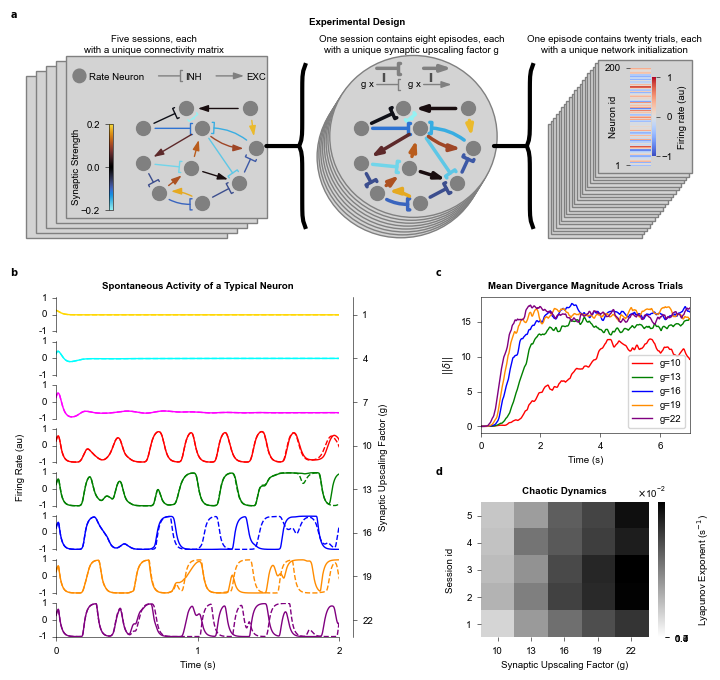

In [15]:
left=0.065
right=0.04
top=0.065
bottom=0.055

Fig1(left,right,top,bottom)

In [456]:
a_aux[:,[0]]

array([[0.59465264]])

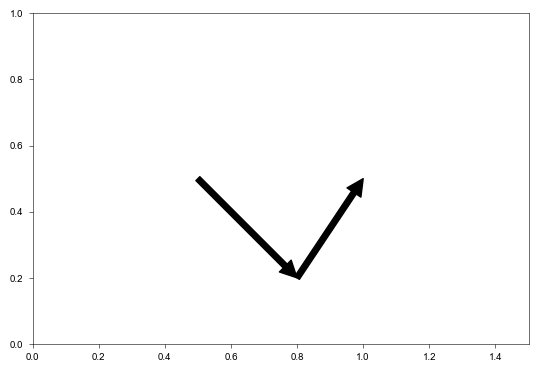

In [344]:
fig, ax = plt.subplots()

# Draw the main arrow
start_point_main = (0.5, 0.5) # Starting point of the main arrow
end_point_main = (0.8, 0.2)    # Ending point of the main arrow
ax.annotate("", xy=end_point_main, xytext=start_point_main,
            arrowprops=dict(facecolor='black', shrink=0),
            )

# Draw the second arrow starting from the tip of the main arrow
start_point_second = (0.8, 0.2) # Starting point of the second arrow (tip of the main arrow)
end_point_second = (1.0, 0.5)    # Ending point of the second arrow
ax.annotate("", xy=end_point_second, xytext=start_point_second,
            arrowprops=dict(facecolor='black', shrink=0),
            )

plt.xlim(0, 1.5)
plt.ylim(0, 1)
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

In [9]:
def plot_network(ax,base, scale,edge_list,g):
        
    G = nx.DiGraph()
    
    G.add_weighted_edges_from(edge_list)
    pos = {}
    pos_array = np.array([[-0.7, -0.9], [0.1, -1.1], 
                          [-0.1, -0.4], [1, 0.8], 
                          [-0.2, 0.8], [0.8, -0.7], 
                          [-1, -0.3], [-1, 0.4], 
                          [0.1, 0.4], [1.1, 0.]])
    pos_array[:,0] *= scale[0]
    pos_array[:,1] *= scale[1]
    pos_array[:,0] += base[0]
    pos_array[:,1] += base[1]
    for i in range(10):
        pos[i+1] = pos_array[i]
    
    
    
    nx.draw_networkx_nodes(G, pos, node_size=100, ax=ax,node_color="k")
    nx.draw_networkx_nodes(G, pos, node_size=100, ax=ax)
    nx.draw_networkx_labels(G, pos, ax=ax)
    
    fig.savefig("1.png", bbox_inches='tight', pad_inches=0)
    
    curved_edges = [edge for edge in G.edges() if reversed(edge) in G.edges()]
    straight_edges = list(set(G.edges()) - set(curved_edges))
    
    curved_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in curved_edges]
    straight_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in straight_edges]
    
    curved_edges_exc = [curved_edges[i] for i in range(len(curved_edges)) if curved_edges_weight[i]>0]
    curved_edges_inh = [curved_edges[i] for i in range(len(curved_edges)) if curved_edges_weight[i]<0]
    
    
    edges_weight = straight_edges_weight + curved_edges_weight
    
    # Convert the list of integers to a color map
    vmin_aux = min(edges_weight)
    vmax_aux = max(edges_weight)
    vmax = max(vmax_aux,-vmin_aux)
    norm = Normalize(vmin=-vmax, vmax=vmax)
    colors = cmr.gem(norm(edges_weight)) # Use viridis colormap as an example
    
    arcs1 = nx.draw_networkx_edges(G, pos, ax=ax, edgelist=straight_edges,arrowstyle='-|>, head_length=1., head_width=0.4',width=g)
    offset = 0
    for i, arc in enumerate(arcs1):  # change alpha values of arcs
        arc.set_color(colors[i])
        if edges_weight[i]<0:
            arc.set_arrowstyle('-[, widthB=0.4, lengthB=.15')
        offset += 1
    
    
    
    arc_rad = 0.25
    arcs2 = nx.draw_networkx_edges(G, pos, ax=ax, edgelist=curved_edges,arrowstyle='-|>, head_length=1., head_width=0.4', connectionstyle=f'arc3, rad = {arc_rad}',width=g)
    
    for i, arc in enumerate(arcs2):  # change alpha values of arcs
        arc.set_color(colors[offset+i])
        if edges_weight[offset+i]<0:
            arc.set_arrowstyle('-[, widthB=0.4, lengthB=.15')
    
    sm = plt.cm.ScalarMappable(cmap=cmr.gem, norm=Normalize(vmin=-vmax, vmax=vmax))
    sm.set_array([]) # Set the array to empty since we're not mapping it to anything
    
    # Now explicitly specify the ax for the colorbar
    cb = fig.colorbar(sm, ax=ax)
    cb.set_ticks([-vmax,0,vmax])
    for t in cb.ax.get_yticklabels():
        t.set_horizontalalignment('right')   
        t.set_x(5.9)
        t.set_fontsize(15)
    
    ax.axis("off")

In [16]:
def plot_network(ax,base, scale,edge_list,g):
        
    G = nx.DiGraph()
    
    G.add_weighted_edges_from(edge_list)
    pos = {}
    pos_array = np.array([[-0.7, -0.9], [0.1, -1.1], 
                          [-0.1, -0.4], [1, 0.8], 
                          [-0.2, 0.8], [0.8, -0.7], 
                          [-1, -0.3], [-1, 0.4], 
                          [0.1, 0.4], [1.1, 0.]])
    pos_array[:,0] *= scale[0]
    pos_array[:,1] *= scale[1]
    pos_array[:,0] += base[0]
    pos_array[:,1] += base[1]
    for i in range(10):
        pos[i+1] = pos_array[i]
    
    
    
    nx.draw_networkx_nodes(G, pos, node_size=100, ax=ax,node_color="gray")
    # nx.draw_networkx_nodes(G, pos, node_size=100, ax=ax)
    nx.draw_networkx_labels(G, pos, ax=ax)
    
    # fig.savefig("1.png", bbox_inches='tight', pad_inches=0)
    
    curved_edges = [edge for edge in G.edges() if reversed(edge) in G.edges()]
    straight_edges = list(set(G.edges()) - set(curved_edges))
    
    curved_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in curved_edges]
    straight_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in straight_edges]
    
    curved_edges_exc = [curved_edges[i] for i in range(len(curved_edges)) if curved_edges_weight[i]>0]
    curved_edges_inh = [curved_edges[i] for i in range(len(curved_edges)) if curved_edges_weight[i]<0]
    
    
    edges_weight = straight_edges_weight + curved_edges_weight
    
    # Convert the list of integers to a color map
    vmin_aux = min(edges_weight)
    vmax_aux = max(edges_weight)
    vmax = max(vmax_aux,-vmin_aux)
    norm = Normalize(vmin=-vmax, vmax=vmax)
    colors = cmr.iceburn(norm(edges_weight)) # Use viridis colormap as an example
    
    arcs1 = nx.draw_networkx_edges(G, pos, ax=ax, edgelist=straight_edges,arrowstyle='-|>, head_length=.6, head_width=0.2',width=g)
    offset = 0
    for i, arc in enumerate(arcs1):  # change alpha values of arcs
        arc.set_color(colors[i])
        if edges_weight[i]<0:
            arc.set_arrowstyle('-[, widthB=0.4, lengthB=.15')
        offset += 1
    
    
    
    arc_rad = 0.25
    arcs2 = nx.draw_networkx_edges(G, pos, ax=ax, edgelist=curved_edges,arrowstyle='-|>, head_length=.6, head_width=0.2', connectionstyle=f'arc3, rad = {arc_rad}',width=g)
    
    for i, arc in enumerate(arcs2):  # change alpha values of arcs
        arc.set_color(colors[offset+i])
        if edges_weight[offset+i]<0:
            arc.set_arrowstyle('-[, widthB=0.4, lengthB=.15')
    
    # sm = plt.cm.ScalarMappable(cmap=cmr.gem, norm=Normalize(vmin=-vmax, vmax=vmax))
    # sm.set_array([]) # Set the array to empty since we're not mapping it to anything
    
    # # Now explicitly specify the ax for the colorbar
    # cb = fig.colorbar(sm, ax=ax)
    # cb.set_ticks([-vmax,0,vmax])
    # for t in cb.ax.get_yticklabels():
    #     t.set_horizontalalignment('right')   
    #     t.set_x(5.9)
    #     t.set_fontsize(15)
    
    # ax.axis("off")

In [573]:
bottom+(disty+8 + 7*ws_y)*ax_y/fix_y

0.8251867777479172

In [9]:
left=0.06
right=0.02
top=0.05
bottom=0.07

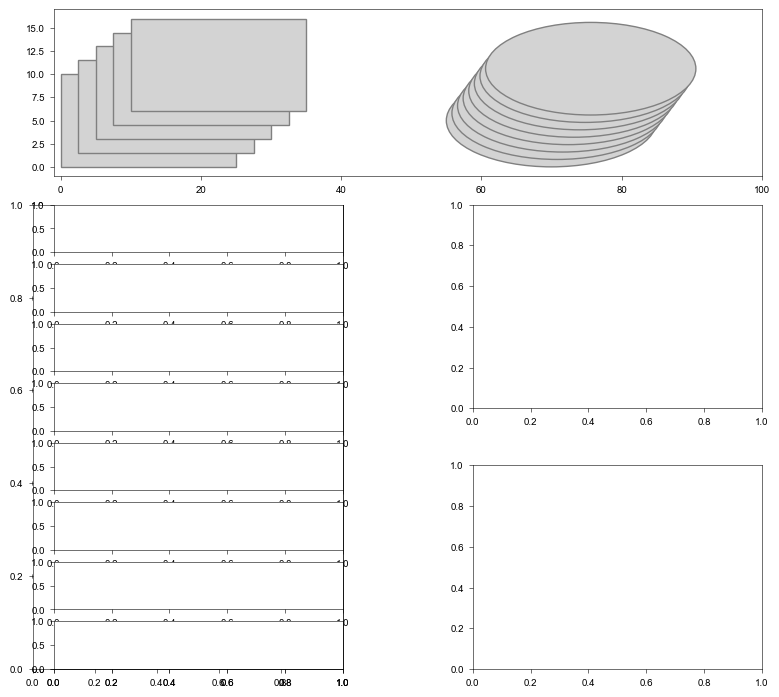

In [25]:
fix_x = 7.08#unit in inch
ws_x = 0.34#of the axis x lenght
ws_y = 0.25
distx = 0.45 #of the axis x lenght
disty = 0.6
fix_x_aux = fix_x-left-right
ax_x = (fix_x_aux)/(2+1*distx)
ax_y = ax_x/6

fix_y = (3+2*ws_y+disty+8 + 7*ws_y) * ax_y
fix_y_aux = fix_y-top-bottom
ax_y = fix_y_aux/(3+2*ws_y+disty+8 + 7*ws_y)


gsEXP = GridSpec(1,1, bottom=bottom+(disty+8 + 7*ws_y)*ax_y/fix_y_aux, top=bottom+(3+2*ws_y+disty+8 + 7*ws_y)*ax_y/fix_y_aux, left=left, right=left+(2+1*distx)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)
gs1 = GridSpec(8,1, bottom=bottom, top=bottom+(8 + 7*ws_y)*ax_y/fix_y_aux, left=left, right=left+(1)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)
gs1_aux1 = GridSpec(1,1, bottom=bottom, top=bottom+(8 + 7*ws_y)*ax_y/fix_y_aux, left=left, right=left+(1)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)
gs1_aux2 = GridSpec(1,1, bottom=bottom, top=bottom+(8 + 7*ws_y)*ax_y/fix_y_aux, left=left-0.03, right=left+(1)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)
gs2 = GridSpec(1,1, bottom=bottom+( (8 + 7*ws_y)/2 + disty)*ax_y/fix_y_aux, top=bottom+(8 + 7*ws_y)*ax_y/fix_y_aux, left=left+(1+distx)*ax_x/fix_x_aux, right=left+(2+1*distx)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)
gs3 = GridSpec(1,1, bottom=bottom, top=bottom+( (8 + 7*ws_y)/2 - disty)*ax_y/fix_y_aux, left=left+(1+distx)*ax_x/fix_x_aux, right=left+(2+1*distx)*ax_x/fix_x_aux, wspace=ws_x,hspace = ws_y)

fig = plt.figure(figsize=(fix_x, fix_y))


axEXP = []
axEXP.append(fig.add_subplot(gsEXP[0]))
axA_aux = []
axA_aux.append(fig.add_subplot(gs1_aux1[0]))
axA_aux.append(fig.add_subplot(gs1_aux2[0]))
axA = []
for i in range(8):
    axA.append(fig.add_subplot(gs1[i]))
axB = []
axB.append(fig.add_subplot(gs2[0]))
axC = []
axC.append(fig.add_subplot(gs3[0]))











# Define the rectangles' properties
rectangle_width = 25
rectangle_height = 10
# Calculate actual overlap
overlapx = 0.1 * rectangle_width
overlapy = 0.15 * rectangle_height

# colors = ['red', 'green', 'blue', 'purple',  "black"] # List of colors for each rectangle






rectangles = [
    {'x': 0, 'y': 0, 'width': rectangle_width, 'height': rectangle_height},
    {'x': overlapx, 'y': overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 2*overlapx, 'y': 2*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 3*overlapx, 'y': 3*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 4*overlapx, 'y': 4*overlapy, 'width': rectangle_width, 'height': rectangle_height}]

# Draw each rectangle with smooth corners and different colors
for i, rect in enumerate(rectangles):
    patch = patches.Rectangle((rect['x'], rect['y']), rect['width'], rect['height'], edgecolor="gray", facecolor="lightgray")
    axEXP[0].add_patch(patch)

# Set limits to ensure all rectangles are visible
# Adjusting the limits to accommodate the increased overlap


# Remove axes
# axEXP[0].axis('off')
# axEXP[0].set_title("Sessions")




edge_list_1 = [(1,2,-0.1),(2,1,0.17),(7,1,-0.08), (1,3,0.11), (7,3,-0.18),
                 (2,6,-0.08),(10,9,-0.15),(3,6,0.02),(6,10,-0.09),(9,10,0.1),
                 (3,9,0.12),(8,9,-0.11),(9,6,-0.17),(4,10,0.18),(4,5,0.02),
                 (8,5,-0.02),(9,7,0.06),(9,5,-0.2)]


# plot_network(axEXP[0],(45,9.5),(14,4),edge_list_1,1)
# off_x = 0.2
# off_y = 0.
# ax[0].annotate("", xy=(off_x-1.1, off_y+1.), xytext=(off_x-1.4, off_y+1.), transform=ax[0].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.3, lengthB=.1', lw=1,color='k'), zorder=100)
# ax[0].annotate("", xy=(off_x-1.08, off_y+0.7), xytext=(off_x-1.4, off_y+0.7), transform=ax[0].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=0.6, head_width=0.3', lw=1,color='k'), zorder=100)
# off_x1 = 0.82
# off_y1 = -0.06
# ax[0].text(off_x1-1.1,off_y1+1.,"Inhibitory", transform=ax[0].transAxes)
# ax[0].text(off_x1-1.1,off_y1-0.13+1.,"Excitatory", transform=ax[0].transAxes)

# sm = plt.cm.ScalarMappable(cmap=cmr.iceburn, norm=Normalize(vmin=-0.2, vmax=0.2))
# sm.set_array([]) # Set the array to empty since we're not mapping it to anything
# cax = fig.add_axes([0.5,0.2,0.02,0.4])
# cbar = fig.colorbar(sm, cax=cax)

# # plot_network(axEXP[0],(25,9.5),(14,4),edge_list_1,1)

centers = [(70,5)] # centers for each Ellipse
# Define the Ellipse' properties
Ellipse_width = 30
Ellipse_height = 10
# Calculate actual overlap
# overlapx = 0.05 * Ellipse_width
overlapy = 0.08 * Ellipse_height
for i in range(1,8):
    a = centers[0][0]+i*overlapy
    b = centers[0][1]+i*overlapy
    centers.append((a,b))



# Draw each Ellipse with different centers
for i, center in enumerate(centers):
    circle = patches.Ellipse(center, width=Ellipse_width, height=Ellipse_height, edgecolor="gray", facecolor="lightgray") # Centered at (0, 0)
    axEXP[0].add_patch(circle)

# axEXP[0].plot([1,2,3,4])
axEXP[0].set_xlim(-1, 100)
axEXP[0].set_ylim(-1, 17)

# axEXP[0].axis("off")

plt.show()

In [13]:
left=0.0
right=0.0
top=0.0
bottom=0.0

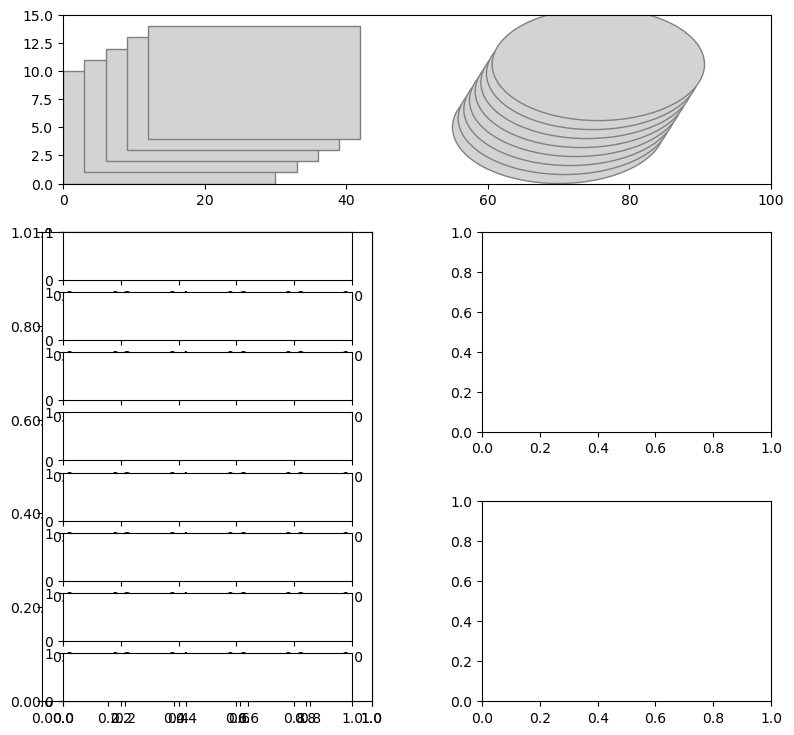

In [15]:
fix_x = 7.08#unit in inch
ws_x = 0.34#of the axis x lenght
ws_y = 0.25
distx = 0.45 #of the axis x lenght
disty = 1
ax_x = fix_x/(2+1*distx)
ax_y = ax_x/6

fix_y = (3+2*ws_y+disty+8 + 7*ws_y) * ax_y

gsEXP = GridSpec(1,1, bottom=bottom+(disty+8 + 7*ws_y)*ax_y/fix_y, top=-top+1, left=left+0., right=-right+1, wspace=ws_x,hspace = ws_y)
gs1 = GridSpec(8,1, bottom=bottom+0, top=-top+(8 + 7*ws_y)*ax_y/fix_y, left=left+0., right=-right+(1)*ax_x/fix_x, wspace=ws_x,hspace = ws_y)
gs1_aux1 = GridSpec(1,1, bottom=bottom+0, top=-top+(8 + 7*ws_y)*ax_y/fix_y, left=left+0., right=-right+(1+0.15*distx)*ax_x/fix_x, wspace=ws_x,hspace = ws_y)
gs1_aux2 = GridSpec(1,1, bottom=bottom+0, top=-top+(8 + 7*ws_y)*ax_y/fix_y, left=left-0.03+0., right=-right+(1+0.15*distx)*ax_x/fix_x, wspace=ws_x,hspace = ws_y)
gs2 = GridSpec(1,1, bottom=bottom+(4.6+4*ws_y)*ax_y/fix_y, top=-top+(8 + 7*ws_y)*ax_y/fix_y, left=left+(1+distx)*ax_x/fix_x, right=-right+1, wspace=ws_x,hspace = ws_y)
gs3 = GridSpec(1,1, bottom=bottom+0, top=-top+(3.4+3*ws_y)*ax_y/fix_y, left=left+(1+distx)*ax_x/fix_x, right=-right+1, wspace=ws_x,hspace = ws_y)

fig = plt.figure(figsize=(fix_x, fix_y))


axEXP = []
axEXP.append(fig.add_subplot(gsEXP[0]))
axA_aux = []
axA_aux.append(fig.add_subplot(gs1_aux1[0]))
axA_aux.append(fig.add_subplot(gs1_aux2[0]))
axA = []
for i in range(8):
    axA.append(fig.add_subplot(gs1[i]))
axB = []
axB.append(fig.add_subplot(gs2[0]))
axC = []
axC.append(fig.add_subplot(gs3[0]))











# Define the rectangles' properties
rectangle_width = 30
rectangle_height = 10
# Calculate actual overlap
overlapx = 0.1 * rectangle_width
overlapy = 0.1 * rectangle_height

# colors = ['red', 'green', 'blue', 'purple',  "black"] # List of colors for each rectangle






rectangles = [
    {'x': 0, 'y': 0, 'width': rectangle_width, 'height': rectangle_height},
    {'x': overlapx, 'y': overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 2*overlapx, 'y': 2*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 3*overlapx, 'y': 3*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 4*overlapx, 'y': 4*overlapy, 'width': rectangle_width, 'height': rectangle_height}]

# Draw each rectangle with smooth corners and different colors
for i, rect in enumerate(rectangles):
    patch = patches.Rectangle((rect['x'], rect['y']), rect['width'], rect['height'], edgecolor="gray", facecolor="lightgray")
    axEXP[0].add_patch(patch)

# Set limits to ensure all rectangles are visible
# Adjusting the limits to accommodate the increased overlap


# Remove axes
# axEXP[0].axis('off')
# axEXP[0].set_title("Sessions")




edge_list_1 = [(1,2,-0.1),(2,1,0.17),(7,1,-0.08), (1,3,0.11), (7,3,-0.18),
                 (2,6,-0.08),(10,9,-0.15),(3,6,0.02),(6,10,-0.09),(9,10,0.1),
                 (3,9,0.12),(8,9,-0.11),(9,6,-0.17),(4,10,0.18),(4,5,0.02),
                 (8,5,-0.02),(9,7,0.06),(9,5,-0.2)]


# plot_network(axEXP[0],(45,9.5),(14,4),edge_list_1,1)
# off_x = 0.2
# off_y = 0.
# ax[0].annotate("", xy=(off_x-1.1, off_y+1.), xytext=(off_x-1.4, off_y+1.), transform=ax[0].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.3, lengthB=.1', lw=1,color='k'), zorder=100)
# ax[0].annotate("", xy=(off_x-1.08, off_y+0.7), xytext=(off_x-1.4, off_y+0.7), transform=ax[0].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=0.6, head_width=0.3', lw=1,color='k'), zorder=100)
# off_x1 = 0.82
# off_y1 = -0.06
# ax[0].text(off_x1-1.1,off_y1+1.,"Inhibitory", transform=ax[0].transAxes)
# ax[0].text(off_x1-1.1,off_y1-0.13+1.,"Excitatory", transform=ax[0].transAxes)

# sm = plt.cm.ScalarMappable(cmap=cmr.iceburn, norm=Normalize(vmin=-0.2, vmax=0.2))
# sm.set_array([]) # Set the array to empty since we're not mapping it to anything
# cax = fig.add_axes([0.5,0.2,0.02,0.4])
# cbar = fig.colorbar(sm, cax=cax)

# # plot_network(axEXP[0],(25,9.5),(14,4),edge_list_1,1)

centers = [(70,5)] # centers for each Ellipse
# Define the Ellipse' properties
Ellipse_width = 30
Ellipse_height = 10
# Calculate actual overlap
# overlapx = 0.05 * Ellipse_width
overlapy = 0.08 * Ellipse_height
for i in range(1,8):
    a = centers[0][0]+i*overlapy
    b = centers[0][1]+i*overlapy
    centers.append((a,b))



# Draw each Ellipse with different centers
for i, center in enumerate(centers):
    circle = patches.Ellipse(center, width=Ellipse_width, height=Ellipse_height, edgecolor="gray", facecolor="lightgray") # Centered at (0, 0)
    axEXP[0].add_patch(circle)

# axEXP[0].plot([1,2,3,4])
axEXP[0].set_xlim(0, 100)
axEXP[0].set_ylim(0, 15)

# axEXP[0].axis("off")

plt.show()

In [107]:
axEXP[0].get_position().x0

0.06

In [92]:
(2*np.random.random(20)-1)/10

array([-0.09187071,  0.06020559,  0.01465781, -0.06402368, -0.04700424,
       -0.04329679,  0.03469384, -0.02269964, -0.0652047 ,  0.0560846 ,
        0.02001021, -0.01328404,  0.09145387, -0.06281162, -0.07154117,
       -0.0564863 ,  0.07872194, -0.03681992,  0.03644779, -0.04110547])

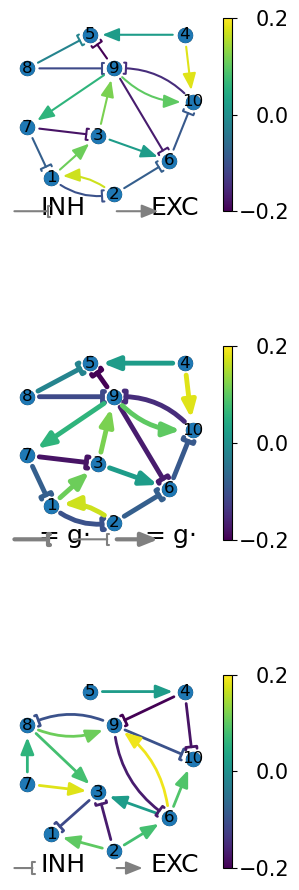

In [45]:
fix_x = 4.08#unit in inch
ws_x = 0.34#of the axis x lenght
ws_y = 0.7
distx = 0.48 #of the axis x lenght
disty = 0.2
ax_x = fix_x
ax_y = 0.7 * ax_x

fix_y = (3+2*ws_y) * ax_y





fig, ax = plt.subplots(3, 1, figsize=(2.5,8.5))

plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=ws_x, hspace=ws_y)

edge_list_1 = [(1,2,-0.1),(2,1,0.17),(7,1,-0.08), (1,3,0.11), (7,3,-0.18),
                 (2,6,-0.08),(10,9,-0.15),(3,6,0.02),(6,10,-0.09),(9,10,0.1),
                 (3,9,0.12),(8,9,-0.11),(9,6,-0.17),(4,10,0.18),(4,5,0.02),
                 (8,5,-0.02),(9,7,0.06),(9,5,-0.2)]

edge_list_2 = [(2,1,0.1),(2,3,-0.17),(8,3,0.08), (3,1,-0.11), (7,3,0.18),
                 (2,6,0.08),(6,9,0.19),(6,3,0.02),(6,10,0.09),(9,10,-0.1),
                 (5,4,0.02),(8,9,0.11),(9,6,-0.17),(4,10,-0.18),
                 (9,8,-0.1),(7,8,0.06),(4,9,-0.2)]


plot_network(ax[0],edge_list_1,1.5)
off_x = 1.3
ax[0].annotate("", xy=(-0.7, -1.3), xytext=(-1.2, -1.3), transform=ax[0].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.4, lengthB=.15', lw=1.5,color='gray'), zorder=100)
ax[0].annotate("", xy=(off_x-0.6, -1.3), xytext=(off_x-1.2, -1.3), transform=ax[0].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=1., head_width=0.4', lw=1.5,color='gray'), zorder=100)
off_x1 = 1.05
off_y1 = -0.06
ax[0].text(off_x1-0.9, -0.02,"INH", transform=ax[0].transAxes,fontsize=18)
ax[0].text(off_x1-0.35, -0.02,"EXC", transform=ax[0].transAxes,fontsize=18)

plot_network(ax[1],edge_list_1,3.5)
off_x = 1.3
ax[1].annotate("", xy=(-0.7, -1.3), xytext=(-1.2, -1.3), transform=ax[1].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.4, lengthB=.15', lw=3,color='gray'), zorder=100)
ax[1].annotate("", xy=(off_x-0.6, -1.3), xytext=(off_x-1.2, -1.3), transform=ax[1].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=1., head_width=0.4', lw=3,color='gray'), zorder=100)
off_x1 = 1.04
off_y1 = -0.06
ax[1].text(off_x1-0.9, -0.02,"= g"+r"$\cdot$", transform=ax[1].transAxes,fontsize=18)
ax[1].text(off_x1-0.02-0.35, -0.02,"= g"+r"$\cdot$", transform=ax[1].transAxes,fontsize=18)
ax[1].annotate("", xy=(0.75-0.7, -1.3), xytext=(0.75-1.2, -1.3), transform=ax[1].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.4, lengthB=.15', lw=1.5,color='gray'), zorder=100)
ax[1].annotate("", xy=(0.82+off_x-0.6, -1.3), xytext=(0.82+off_x-1.2, -1.3), transform=ax[1].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=1., head_width=0.4', lw=1.5,color='gray'), zorder=100)


plot_network(ax[2],edge_list_2,2)
off_x = 1.3
ax[2].annotate("", xy=(-0.9, -1.3), xytext=(-1.2, -1.3), transform=ax[2].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.4, lengthB=.15', lw=1.5,color='gray'), zorder=100)
ax[2].annotate("", xy=(off_x-0.8, -1.3), xytext=(off_x-1.2, -1.3), transform=ax[2].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=1., head_width=0.4', lw=1.5,color='gray'), zorder=100)
off_x1 = 1.05
off_y1 = -0.06
ax[2].text(off_x1-0.9, -0.02,"INH", transform=ax[2].transAxes,fontsize=18)
ax[2].text(off_x1-0.35, -0.02,"EXC", transform=ax[2].transAxes,fontsize=18)


fig.savefig("a.svg",dpi=600)


In [9]:
aa = 2*np.random.random((200,2))-1

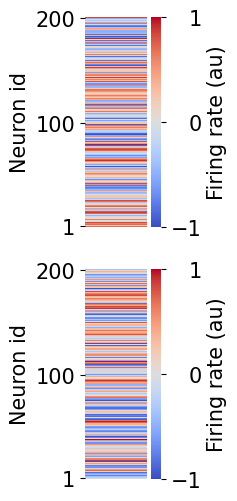

In [10]:
fig, axs = plt.subplots(2, 1, figsize=(1,6))
g2 = axs[0].imshow(aa[:,[0]], cmap="coolwarm", vmin = -1, vmax = 1, aspect='auto')
axs[0].invert_yaxis()
cbar = plt.colorbar(g2)
cbar.set_label("Firing rate (au)",fontsize=15)
axs[0].spines["top"].set_visible(False)
axs[0].spines["bottom"].set_visible(False)
axs[0].spines["right"].set_visible(False)
axs[0].spines["left"].set_visible(False)
cbar.outline.set_visible(False)
cbar.set_ticks([-1,0,1])
for t in cbar.ax.get_yticklabels():
    t.set_horizontalalignment('right')   
    t.set_x(3.9)
    t.set_fontsize(15)

axs[0].set_yticks(np.array([0, 99, 199]))
axs[0].set_yticklabels(np.array([0, 99, 199])+1,fontsize=15)

axs[0].set_xticks([])

axs[0].set_ylabel("Neuron id",fontsize=15)




g2 = axs[1].imshow(aa[:,[1]], cmap="coolwarm", vmin = -1, vmax = 1, aspect='auto')
axs[1].invert_yaxis()
cbar = plt.colorbar(g2)
cbar.set_label("Firing rate (au)",fontsize=15)
axs[1].spines["top"].set_visible(False)
axs[1].spines["bottom"].set_visible(False)
axs[1].spines["right"].set_visible(False)
axs[1].spines["left"].set_visible(False)
cbar.outline.set_visible(False)
cbar.set_ticks([-1,0,1])
for t in cbar.ax.get_yticklabels():
    t.set_horizontalalignment('right')   
    t.set_x(3.9)
    t.set_fontsize(15)

axs[1].set_yticks(np.array([0, 99, 199]))
axs[1].set_yticklabels(np.array([0, 99, 199])+1,fontsize=15)

axs[1].set_xticks([])

axs[1].set_ylabel("Neuron id",fontsize=15)


fig.savefig("a1.svg",dpi=600, bbox_inches='tight')

Text(-0.28000000000000014, 0.81, 'Excitatory')

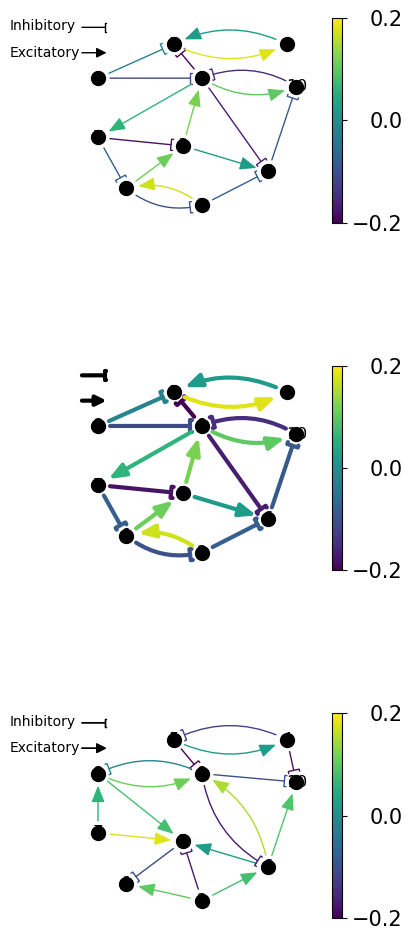

In [11]:
fix_x = 4.08#unit in inch
ws_x = 0.34#of the axis x lenght
ws_y = 0.7
distx = 0.48 #of the axis x lenght
disty = 0.2
ax_x = fix_x
ax_y = 0.7 * ax_x

fix_y = (3+2*ws_y) * ax_y





fig, ax = plt.subplots(3, 1, figsize=(3,9))

plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=ws_x, hspace=ws_y)

edge_list_1 = [(1,2,-0.1),(2,1,0.17),(7,1,-0.08), (1,3,0.11), (7,3,-0.18),
                 (2,6,-0.08),(10,9,-0.15),(3,6,0.02),(6,10,-0.09),(9,10,0.1),
                 (3,9,0.12),(8,9,-0.11),(9,6,-0.17),(5,4,0.18),(4,5,0.02),
                 (8,5,-0.02),(9,7,0.06),(9,5,-0.2)]

edge_list_2 = [(2,1,0.1),(2,3,-0.17),(8,3,0.08), (3,1,-0.11), (7,3,0.18),
                 (2,6,0.08),(6,9,0.15),(6,3,0.02),(6,10,0.09),(9,10,-0.1),
                 (5,4,0.02),(8,9,0.11),(9,6,-0.17),(4,10,-0.18),(4,5,-0.12),
                 (9,8,-0.02),(7,8,0.06),(5,9,-0.2)]


plot_network(ax[0],edge_list_1,1)
off_x = 0.2
off_y = 0.
ax[0].annotate("", xy=(off_x-1.1, off_y+1.), xytext=(off_x-1.4, off_y+1.), transform=ax[0].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.3, lengthB=.1', lw=1,color='k'), zorder=100)
ax[0].annotate("", xy=(off_x-1.08, off_y+0.7), xytext=(off_x-1.4, off_y+0.7), transform=ax[0].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=0.6, head_width=0.3', lw=1,color='k'), zorder=100)
off_x1 = 0.82
off_y1 = -0.06
ax[0].text(off_x1-1.1,off_y1+1.,"Inhibitory", transform=ax[0].transAxes)
ax[0].text(off_x1-1.1,off_y1-0.13+1.,"Excitatory", transform=ax[0].transAxes)

plot_network(ax[1],edge_list_1,3)
off_x = 0.2
off_y = 0.
ax[1].annotate("", xy=(off_x-1.1, off_y+1.), xytext=(off_x-1.4, off_y+1.), transform=ax[1].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.3, lengthB=.1', lw=3,color='k'), zorder=100)
ax[1].annotate("", xy=(off_x-1.08, off_y+0.7), xytext=(off_x-1.4, off_y+0.7), transform=ax[1].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=0.6, head_width=0.3', lw=3,color='k'), zorder=100)



plot_network(ax[2],edge_list_2,1)
off_x = 0.2
off_y = 0.
ax[2].annotate("", xy=(off_x-1.1, off_y+1.), xytext=(off_x-1.4, off_y+1.), transform=ax[2].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.3, lengthB=.1'), zorder=100)
ax[2].annotate("", xy=(off_x-1.08, off_y+0.7), xytext=(off_x-1.4, off_y+0.7), transform=ax[2].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=0.6, head_width=0.3', lw=1,color='k'), zorder=100)
off_x = 0.2
off_y = 0.
ax[2].annotate("", xy=(off_x-1.1, off_y+1.), xytext=(off_x-1.4, off_y+1.), transform=ax[2].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.3, lengthB=.1', lw=1,color='k'), zorder=100)
ax[2].annotate("", xy=(off_x-1.08, off_y+0.7), xytext=(off_x-1.4, off_y+0.7), transform=ax[2].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=0.6, head_width=0.3', lw=1,color='k'), zorder=100)
off_x1 = 0.82
off_y1 = -0.06
ax[2].text(off_x1-1.1,off_y1+1.,"Inhibitory", transform=ax[2].transAxes)
ax[2].text(off_x1-1.1,off_y1-0.13+1.,"Excitatory", transform=ax[2].transAxes)


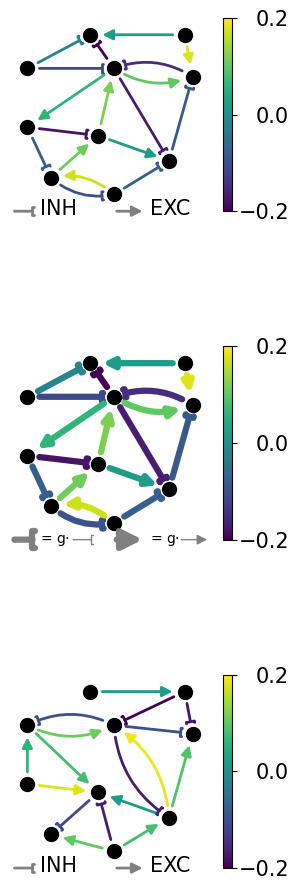

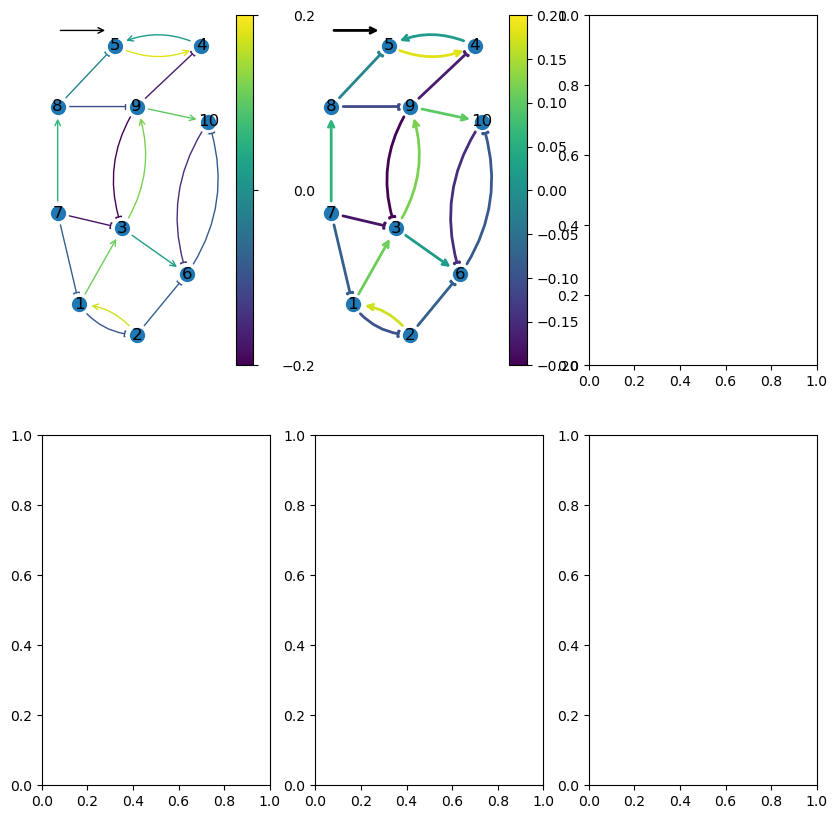

In [12]:
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.colors import Normalize
from matplotlib.patches import Patch


G = nx.DiGraph()
edge_list = [(1,2,-0.1),(2,1,0.17),(7,1,-0.08), (1,3,0.11), (7,3,-0.18),
             (2,6,-0.08),(10,6,-0.15),(3,6,0.02),(6,10,-0.09),(9,10,0.1),
             (3,9,0.12),(8,9,-0.11),(9,4,-0.17),(5,4,0.18),(4,5,0.02),
             (8,5,-0.02),(7,8,0.06),(9,3,-0.2)]

G.add_weighted_edges_from(edge_list)
pos = {}
pos[1]=np.array([-0.7, -0.9])
pos[2]=np.array([0.1, -1.1])
pos[3]=np.array([-0.1, -0.4])
pos[4]=np.array([1, 0.8])
pos[5]=np.array([-0.2, 0.8])
pos[6]=np.array([0.8, -0.7])
pos[7]=np.array([-1, -0.3])
pos[8]=np.array([-1, 0.4])
pos[9]=np.array([0.1, 0.4])
pos[10]=np.array([1.1, 0.3])

fig, ax = plt.subplots(2, 3, figsize=(10,10))

nx.draw_networkx_nodes(G, pos, node_size=100, ax=ax[0, 0])
nx.draw_networkx_labels(G, pos, ax=ax[0, 0])

fig.savefig("1.png", bbox_inches='tight', pad_inches=0)

curved_edges = [edge for edge in G.edges() if reversed(edge) in G.edges()]
straight_edges = list(set(G.edges()) - set(curved_edges))

curved_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in curved_edges]
straight_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in straight_edges]

curved_edges_exc = [curved_edges[i] for i in range(len(curved_edges)) if curved_edges_weight[i]>0]
curved_edges_inh = [curved_edges[i] for i in range(len(curved_edges)) if curved_edges_weight[i]<0]


edges_weight = straight_edges_weight + curved_edges_weight

# Convert the list of integers to a color map
vmin_aux = min(edges_weight)
vmax_aux = max(edges_weight)
vmax = max(vmax_aux,-vmin_aux)
norm = Normalize(vmin=-vmax, vmax=vmax)
colors = plt.cm.viridis(norm(edges_weight)) # Use viridis colormap as an example

arcs1 = nx.draw_networkx_edges(G, pos, ax=ax[0, 0], edgelist=straight_edges,arrowstyle='->')
offset = 0
for i, arc in enumerate(arcs1):  # change alpha values of arcs
    arc.set_color(colors[i])
    if edges_weight[i]<0:
        arc.set_arrowstyle('-[, widthB=.2, lengthB=.05')
    offset += 1



arc_rad = 0.25
arcs2 = nx.draw_networkx_edges(G, pos, ax=ax[0, 0], edgelist=curved_edges,arrowstyle='->', connectionstyle=f'arc3, rad = {arc_rad}')

for i, arc in enumerate(arcs2):  # change alpha values of arcs
    arc.set_color(colors[offset+i])
    if edges_weight[offset+i]<0:
        arc.set_arrowstyle('-[, widthB=.2, lengthB=.05')

sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=Normalize(vmin=-vmax, vmax=vmax))
sm.set_array([]) # Set the array to empty since we're not mapping it to anything

# Now explicitly specify the ax for the colorbar
cb = fig.colorbar(sm, ax=ax[0, 0])
cb.set_ticks([-vmax,0,vmax])
for t in cb.ax.get_yticklabels():
    t.set_horizontalalignment('right')   
    t.set_x(4)

ax[0,0].annotate("", xy=(-0.3, 1.1), xytext=(-1, 1.1), transform=ax[0,0].transAxes,arrowprops=dict(arrowstyle='-[, widthB=.2, lengthB=.05'), zorder=100)
ax[0,0].annotate("", xy=(-0.3, 0.9), xytext=(-1, 0.9), transform=ax[0,0].transAxes,arrowprops=dict(arrowstyle='->'), zorder=100)

ax[0, 0].axis("off")




G = nx.DiGraph()
edge_list = [(1,2,-0.1),(2,1,0.17),(7,1,-0.08), (1,3,0.11), (7,3,-0.18),
             (2,6,-0.08),(10,6,-0.15),(3,6,0.02),(6,10,-0.09),(9,10,0.1),
             (3,9,0.12),(8,9,-0.11),(9,4,-0.17),(5,4,0.18),(4,5,0.02),
             (8,5,-0.02),(7,8,0.06),(9,3,-0.2)]

G.add_weighted_edges_from(edge_list)

nx.draw_networkx_nodes(G, pos, node_size=100, ax=ax[0, 1])
nx.draw_networkx_labels(G, pos, ax=ax[0, 1])


curved_edges = [edge for edge in G.edges() if reversed(edge) in G.edges()]
straight_edges = list(set(G.edges()) - set(curved_edges))

curved_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in curved_edges]
straight_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in straight_edges]

curved_edges_exc = [curved_edges[i] for i in range(len(curved_edges)) if curved_edges_weight[i]>0]
curved_edges_inh = [curved_edges[i] for i in range(len(curved_edges)) if curved_edges_weight[i]<0]


edges_weight = straight_edges_weight + curved_edges_weight

# Convert the list of integers to a color map
vmin_aux = min(edges_weight)
vmax_aux = max(edges_weight)
vmax = max(vmax_aux,-vmin_aux)
norm = Normalize(vmin=-vmax, vmax=vmax)
colors = plt.cm.viridis(norm(edges_weight)) # Use viridis colormap as an example

arcs1 = nx.draw_networkx_edges(G, pos, ax=ax[0, 1], edgelist=straight_edges,arrowstyle='->',width=2)
offset = 0
for i, arc in enumerate(arcs1):  # change alpha values of arcs
    arc.set_color(colors[i])
    if edges_weight[i]<0:
        arc.set_arrowstyle('-[, widthB=.2, lengthB=.05')
    offset += 1



arc_rad = 0.25
arcs2 = nx.draw_networkx_edges(G, pos, ax=ax[0, 1], edgelist=curved_edges,arrowstyle='->', connectionstyle=f'arc3, rad = {arc_rad}',width=2)

for i, arc in enumerate(arcs2):  # change alpha values of arcs
    arc.set_color(colors[offset+i])
    if edges_weight[offset+i]<0:
        arc.set_arrowstyle('-[, widthB=.2, lengthB=.05')

sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=Normalize(vmin=-vmax, vmax=vmax))
sm.set_array([]) # Set the array to empty since we're not mapping it to anything

# Now explicitly specify the ax for the colorbar
cb = fig.colorbar(sm, ax=ax[0, 1])


ax[0,1].annotate("", xy=(-0.3, 1.1), xytext=(-1, 1.1), transform=ax[0,1].transAxes,arrowprops=dict(arrowstyle='-[, widthB=.2, lengthB=.05', lw=2), zorder=100)
ax[0,1].annotate("", xy=(-0.3, 0.9), xytext=(-1, 0.9), transform=ax[0,1].transAxes,arrowprops=dict(arrowstyle='->', lw=2), zorder=100)

ax[0, 1].axis("off")






fig.savefig("2.pdf", bbox_inches='tight', pad_inches=0)

In [336]:
vmax

0.6

In [274]:
pos_aux = 2*np.random.random((10,2)) - 1
pos = {i+1:pos_aux[i] for i in range(10)}

In [275]:
pos

{1: array([-0.71382837, -0.94414743]),
 2: array([-0.16203253, -0.95393174]),
 3: array([ 0.28775236, -0.42525945]),
 4: array([0.20472222, 0.11519622]),
 5: array([0.06447743, 0.92868839]),
 6: array([ 0.83391917, -0.98020976]),
 7: array([-0.70479351, -0.94614938]),
 8: array([-0.8656844 ,  0.62850396]),
 9: array([ 0.4390629 , -0.08905519]),
 10: array([ 0.91139916, -0.1492209 ])}

In [328]:
pos = {}
pos[1]=np.array([-0.7, -0.9])
pos[2]=np.array([0.1, -1.1])
pos[3]=np.array([-0.1, -0.4])
pos[4]=np.array([1, 0.8])
pos[5]=np.array([-0.2, 0.8])
pos[6]=np.array([0.8, -0.7])
pos[7]=np.array([-1, -0.3])
pos[8]=np.array([-1, 0.4])
pos[9]=np.array([0.1, 0.4])
pos[10]=np.array([1.1, 0.3])


In [242]:
pos

{1: array([0.4275207 , 0.51975446]),
 2: array([-0.48268296,  0.26571892]),
 3: array([0.00240953, 0.36379602]),
 4: array([0.07814554, 0.03399406]),
 5: array([-0.52673585,  0.39669884]),
 6: array([-0.91580243, -0.03312359]),
 7: array([ 0.78956271, -0.82001918]),
 8: array([ 1.        , -0.36093181]),
 9: array([-0.53227746,  0.6202365 ]),
 10: array([ 0.15986021, -0.98612423])}

In [215]:
conn[:,i][conn[:,i]<0]

array([-0.04402661, -0.03205876, -0.03732164, -0.03593505, -0.05720243,
       -0.0830458 , -0.00624833, -0.02191705, -0.02953754])

In [172]:
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.colors import Normalize

G = nx.DiGraph()
edge_list = [(1,2,0.2),(2,1,-0.1),(2,3,0.05),(3,1,0.15),
             (3,4,0.15),(4,3,0.15),(1,5,-0.15),(5,1,0.15),
             (3,5,0.15),(5,4,-0.15)]
G.add_weighted_ges_from(edge_list)
pos = nx.spring_layout(G, seed=1)
fig, ax = plt.subplots(2, 3)

nx.draw_networkx_nodes(G, pos, node_size=100, ax=ax[0, 0])
nx.draw_networkx_labels(G, pos, ax=ax[0, 0])

fig.save("1.png", bbox_inches='tight', pad_inches=0)

curved_edges = [edge for edge in G.edges() if reversed(edge) in G.edges()]
straight_edges = list(set(G.edges()) - set(curved_edges))

curved_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in
 curved_edges]
straight_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in
 straight_edges]


edges_weight = straight_edges_weight + curved_edges_weight

vmin_aux = min(edges_weight)
vmax_aux = max(edges_weight)
vmax = max(vmax_aux,-vmin_aux)
norm = Normalize(vmin=-vmax, vmax=vmax)
colors = plt.cm.viridis(norm(edges_weight)) # Use viridis colormap as an example


# Assuming you have already drawn the edges as shown in your code snippet

# Create a legend
excitatory_line = mpatches.Line2D([0], [0], color='green', markerfacecolor='green', marker='o',
                                  markersize=8, label='Excitatory Connections')
inhibitory_line = mpatches.Line2D([0], [0], color='red', markerfacecolor='red',
 marker='s',
                                   markersize=8, label='Inhibitory Connections')

ax[0, 0].legend(handles=[excitatory_line, inhibitory_line], loc='upper left')

ax[0, 0].axis("off")
fig.save("2.pdf", bbox_inches='tight', pad_inches=0)

AttributeError: 'DiGraph' object has no attribute 'add_weighted_ges_from'

In [133]:
curved_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in curved_edges]
curved_edges_weight

straight_edges_weight = [G.get_edge_data(edge[0],edge[1])["weight"] for edge in straight_edges]
straight_edges_weight

[0.15, -0.15, 0.05, 0.15]

In [152]:
len(curved_edges)

6

In [134]:
curved_edges_weight +straight_edges_weight

[0.2, -0.15, -0.1, 0.15, 0.15, 0.15, 0.15, -0.15, 0.05, 0.15]

In [9]:
for session in range(1,2):
    with open(f'./data/data_synaptic_upscaling_chaos_session_{session}.pickle', 'rb') as handle:
        data = pickle.load(handle)

    conn = data["connectivity_strength"]
    
    G = nx.DiGraph()
    edge_list, edge_weight = connectivity_matrix_to_edge_list(conn)

    G.add_edges_from(edge_list)

    curved_edges = [edge for edge in G.edges() if reversed(edge) in G.edges()]
    straight_edges = list(set(G.edges()) - set(curved_edges))
    
    print(len(curved_edges))
    print(" ")

426
 


In [17]:
j=0
for i in edge_list:
    if i[0]==167 and i[1] == 18:
        print(j)
    else:
        j += 1

3377


In [18]:
j=0
for i in edge_list:
    if i[1]==167 and i[0] == 18:
        print(j)
    else:
        j += 1

378


In [28]:
curved_edges[0]

(18, 167)

In [39]:
np.array(edge_list)

array([[  0,  18],
       [  0,  19],
       [  0,  22],
       ...,
       [199, 162],
       [199, 179],
       [199, 188]])

In [38]:
np.array(edge_list)[0][0]==curved_edges[0][0]

False

In [41]:
j1 = np.where((np.array(edge_list)[:,0]==curved_edges[0][0])&(np.array(edge_list)[:,1]==curved_edges[0][1]))[0]

j2 = np.where((np.array(edge_list)[:,1]==curved_edges[0][0])&(np.array(edge_list)[:,0]==curved_edges[0][1]))[0]

array([378])

In [34]:
np.array(edge_list)[236]==curved_edges[0]

array([False,  True])

In [43]:
for ii in curved_edges:

    j1 = np.where((np.array(edge_list)[:,0]==ii[0])&(np.array(edge_list)[:,1]==ii[1]))[0][0]

    j2 = np.where((np.array(edge_list)[:,1]==ii[0])&(np.array(edge_list)[:,0]==ii[1]))[0][0]


    print(edge_weight[j1],edge_weight[j2])

0.06496732355635432 0.08283296070751502
0.02868947396657843 -0.02516332113767178
0.0444822907752473 0.05579825422082599
0.03407871462337066 0.05786081293836449
0.0001190481756031631 0.002309076713376237
-0.04873156577822475 -0.033522477428582546
-0.02218382800655498 0.07259994386788896
0.03193536992883498 0.105998599497887
0.013650379292423489 0.03139664455637549
0.03740658221565358 0.058452326793771464
0.01242291197646609 0.03571763103354996
0.047134315866728047 0.07540186729759307
-0.005134794518306965 -0.03997186262702952
-0.023395717203748764 -0.03955554902663551
-0.039785271876595175 -0.04400882984549299
0.0025717877822506526 -0.013057260802436504
-0.09413525474654616 -0.0668842833366332
-0.02882023405703768 0.1160459593749902
-0.002002788625972433 -0.053893743776931305
0.024864650111621176 0.0670574789936536
0.019797875461614503 0.00676695962251971
-0.1385637720525184 -0.029176117912584766
0.04387325407551576 -0.09241010750617772
0.03786272851929441 -0.06559753464805868
0.0293096

In [47]:
we = []
for ii in curved_edges:

    j1 = np.where((np.array(edge_list)[:,0]==ii[0])&(np.array(edge_list)[:,1]==ii[1]))[0][0]

    j2 = np.where((np.array(edge_list)[:,1]==ii[0])&(np.array(edge_list)[:,0]==ii[1]))[0][0]


    we.append((edge_weight[j1],edge_weight[j2]))

we = np.array(we)

In [56]:
len(we[:,0][we[:,0]>0]),len(we[:,0][we[:,0]<0])

(228, 198)

(array([45., 32., 58., 29., 29., 14.,  8.,  7.,  3.,  3.]),
 array([2.29477651e-06, 1.37663111e-02, 2.75303274e-02, 4.12943438e-02,
        5.50583601e-02, 6.88223764e-02, 8.25863928e-02, 9.63504091e-02,
        1.10114425e-01, 1.23878442e-01, 1.37642458e-01]),
 <BarContainer object of 10 artists>)

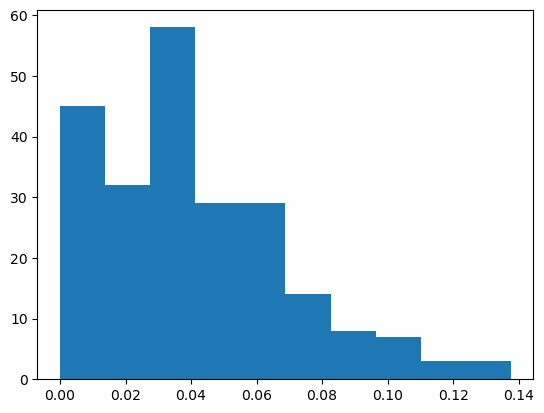

In [59]:
plt.hist(we[:,0][we[:,0]>0])

(array([ 1.,  1.,  3.,  5., 10., 14., 33., 39., 44., 48.]),
 array([-0.17073915, -0.15373776, -0.13673637, -0.11973499, -0.1027336 ,
        -0.08573221, -0.06873083, -0.05172944, -0.03472805, -0.01772666,
        -0.00072528]),
 <BarContainer object of 10 artists>)

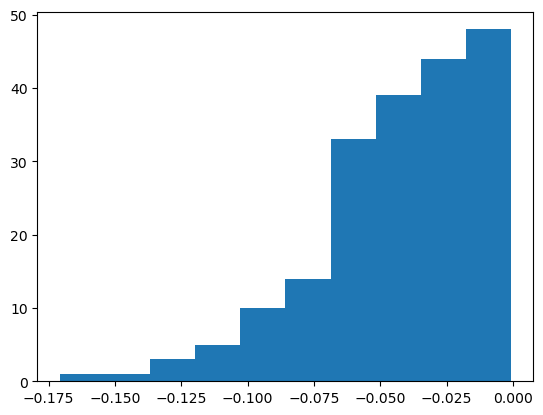

In [60]:
plt.hist(we[:,0][we[:,0]<0])

In [58]:
we.shape

(426, 2)

In [50]:
for i in we[:,1]:
    if i not in we[:,0]:
        print("hi")

In [21]:
edge_list[3377],edge_list[378]

((167, 18), (18, 167))

In [22]:
edge_weight[3377],edge_weight[378]

(0.08283296070751502, 0.06496732355635432)

In [14]:
j=0
for i in curved_edges:
    if i[0]==167 and i[1] == 18:
        print(j)
    else:
        j += 1

288


In [10]:
curved_edges

[(18, 167),
 (22, 125),
 (22, 164),
 (22, 180),
 (22, 191),
 (24, 41),
 (24, 42),
 (24, 155),
 (26, 115),
 (26, 156),
 (26, 167),
 (35, 126),
 (35, 155),
 (62, 139),
 (62, 196),
 (110, 4),
 (110, 63),
 (117, 116),
 (117, 123),
 (117, 143),
 (145, 96),
 (145, 106),
 (145, 118),
 (145, 122),
 (160, 137),
 (166, 97),
 (166, 140),
 (166, 153),
 (174, 127),
 (191, 22),
 (195, 7),
 (1, 87),
 (1, 102),
 (9, 66),
 (9, 102),
 (17, 13),
 (17, 23),
 (17, 156),
 (29, 48),
 (29, 134),
 (29, 194),
 (30, 75),
 (30, 125),
 (33, 107),
 (33, 164),
 (33, 192),
 (45, 118),
 (45, 155),
 (48, 29),
 (57, 118),
 (57, 189),
 (61, 76),
 (66, 9),
 (66, 43),
 (66, 87),
 (66, 92),
 (66, 122),
 (87, 1),
 (87, 66),
 (87, 164),
 (100, 134),
 (100, 151),
 (102, 1),
 (102, 2),
 (102, 9),
 (102, 58),
 (102, 63),
 (102, 72),
 (120, 51),
 (120, 67),
 (120, 152),
 (126, 35),
 (126, 98),
 (129, 53),
 (131, 63),
 (131, 89),
 (131, 149),
 (136, 156),
 (137, 54),
 (137, 160),
 (146, 2),
 (146, 47),
 (149, 5),
 (149, 55),
 (149

In [11]:
straight_edges

[(186, 159),
 (173, 40),
 (71, 29),
 (143, 197),
 (63, 25),
 (48, 45),
 (134, 85),
 (162, 67),
 (155, 28),
 (45, 156),
 (151, 137),
 (49, 126),
 (84, 4),
 (103, 17),
 (129, 155),
 (41, 42),
 (25, 34),
 (152, 138),
 (93, 52),
 (45, 12),
 (159, 34),
 (167, 38),
 (53, 16),
 (170, 43),
 (102, 137),
 (108, 68),
 (163, 4),
 (109, 33),
 (154, 184),
 (139, 55),
 (67, 36),
 (86, 49),
 (13, 65),
 (59, 32),
 (151, 29),
 (137, 131),
 (104, 183),
 (63, 182),
 (130, 92),
 (103, 138),
 (192, 67),
 (88, 95),
 (106, 143),
 (193, 31),
 (91, 20),
 (22, 149),
 (68, 116),
 (69, 81),
 (147, 180),
 (160, 199),
 (176, 64),
 (13, 186),
 (18, 115),
 (32, 199),
 (110, 118),
 (116, 49),
 (73, 87),
 (139, 32),
 (11, 112),
 (180, 70),
 (70, 198),
 (191, 79),
 (23, 86),
 (51, 68),
 (82, 172),
 (55, 38),
 (146, 193),
 (106, 120),
 (159, 132),
 (143, 187),
 (35, 96),
 (189, 154),
 (129, 109),
 (34, 137),
 (162, 57),
 (180, 191),
 (151, 127),
 (57, 120),
 (131, 69),
 (187, 86),
 (53, 6),
 (193, 129),
 (45, 2),
 (17, 16

In [7]:
import matplotlib as mpl

def reverse_colourmap(cmap, name = 'my_cmap_r'):
    """
    In: 
    cmap, name 
    Out:
    my_cmap_r

    Explanation:
    t[0] goes from 0 to 1
    row i:   x  y0  y1 -> t[0] t[1] t[2]
                   /
                  /
    row i+1: x  y0  y1 -> t[n] t[1] t[2]

    so the inverse should do the same:
    row i+1: x  y1  y0 -> 1-t[0] t[2] t[1]
                   /
                  /
    row i:   x  y1  y0 -> 1-t[n] t[2] t[1]
    """        
    reverse = []
    k = []   

    for key in cmap._segmentdata:    
        k.append(key)
        channel = cmap._segmentdata[key]
        data = []

        for t in channel:                    
            data.append((1-t[0],t[2],t[1]))            
        reverse.append(sorted(data))    

    LinearL = dict(zip(k,reverse))
    my_cmap_r = mpl.colors.LinearSegmentedColormap(name, LinearL) 
    return my_cmap_r

cdict1 = {'red':   ((0.0, 0.0, 0.0),
                   (0.5, 0.0, 0.1),
                   (1.0, 1.0, 1.0)),

         'green': ((0.0, 0.0, 0.0),
                   (1.0, 0.0, 0.0)),

         'blue':  ((0.0, 0.0, 1.0),
                   (0.5, 0.1, 0.0),
                   (1.0, 0.0, 0.0))
         }

blue_red1 = mpl.colors.LinearSegmentedColormap('BlueRed1', cdict1)
blue_red1_r = reverse_colourmap(blue_red1)

In [10]:
conn = data["connectivity_strength"]
conn

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        , -0.01050435],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.08324338,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.00015567,  0.        , -0.05823219, ...,  0.        ,
         0.        ,  0.        ]])

In [11]:
np.where(conn!=0)

(array([  0,   0,   0, ..., 199, 199, 199]),
 array([ 18,  19,  22, ..., 162, 179, 188]))

In [12]:
import networkx as nx
from matplotlib.colors import Normalize

In [ ]:
G = nx.DiGraph()
edge_list = [(1,2),(2,1),(2,3),(3,1),
             (3,4),(4,3),(1,5),(5,1),
             (3,5),(5,4)]

In [8]:
def connectivity_matrix_to_edge_list(matrix):
    """
    Converts an asymmetric connectivity matrix to an edge list.

    Parameters:
    - matrix: A 2D list representing the asymmetric connectivity matrix.

    Returns:
    - A list of tuples representing the edges.
    """
    edge_list = []
    edge_weight = []
    n = len(matrix) # Number of nodes
    for i in range(n):
        for j in range(n): # Iterate over all nodes, including itself
            if matrix[i][j]!= 0: # Check if there's an edge from in to j
                edge_list.append((i, j))
                edge_weight.append(matrix[i][j])
    return edge_list, edge_weight

# Example usage
asymmetric_connectivity_matrix = [
    [0, 1, 0, 0],
    [3, 0, 1, 0],
    [0, 0, 0, 1],
    [0, 0, 0, 0]]

edge_list = connectivity_matrix_to_edge_list(asymmetric_connectivity_matrix)
print(edge_list)

([(0, 1), (1, 0), (1, 2), (2, 3)], [1, 3, 1, 1])


In [62]:
G = nx.DiGraph()
edge_list, edge_weight = connectivity_matrix_to_edge_list(conn)

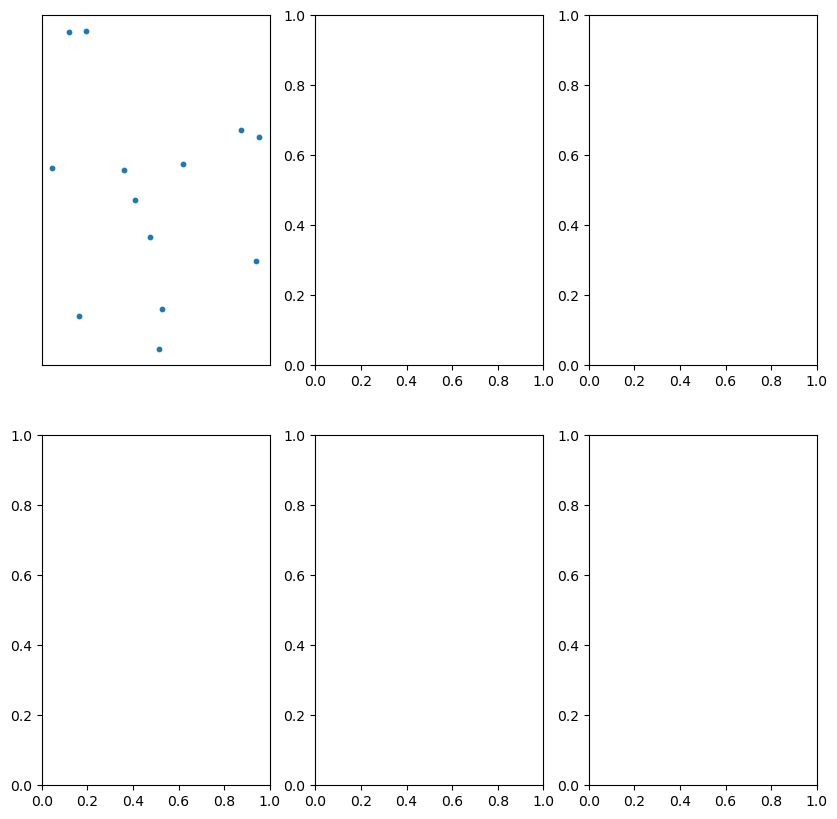

In [50]:
G.add_edges_from(edge_list)
pos = nx.spring_layout(G, seed=5)
fig, ax = plt.subplots(2, 3,figsize=(10,10))

nx.draw_networkx_nodes(G, pos, node_size=10, ax=ax[0, 0])
# nx.draw_networkx_labels(G, pos, ax=ax[0, 0])

fig.savefig("1.png", bbox_inches='tight', pad_inches=0)

In [67]:
curved_edges = [edge for edge in G.edges() if reversed(edge) in G.edges()]
straight_edges = list(set(G.edges()) - set(curved_edges))

nx.draw_networkx_edges(G, pos, ax=ax[0, 0], edgelist=straight_edges)

arc_rad = 0.25
# Convert the list of integers to a color map
norm = Normalize(vmin=min(edge_weight), vmax=max(edge_weight))
colors = blue_red1_r(norm(edge_weight)) # Use viridis colormap as an example

nx.draw_networkx_edges(G, pos, ax=ax[0, 0], edgelist=curved_edges, connectionstyle=f'arc3, rad = {arc_rad}', edge_color=colors)

sm = plt.cm.ScalarMappable(cmap=blue_red1_r, norm=Normalize(vmin=min(edge_weight), vmax=max(edge_weight)))
sm.set_array([]) # Set the array to empty since we're not mapping it to anything

# Now explicitly specify the ax for the colorbar
cb = fig.colorbar(sm, ax=ax[0, 0])

ax[0, 0].axis("off")
fig.savefig("2.png", bbox_inches='tight', pad_inches=0)

In [34]:
min(edge_weight)

-0.18083761176000035

In [53]:
colors.shape

(15, 4)

In [55]:
curved_edges

[]

[]

In [33]:
from matplotlib.gridspec import GridSpec

In [34]:
left=0.06
right=0.02
top=0.05
bottom=0.07

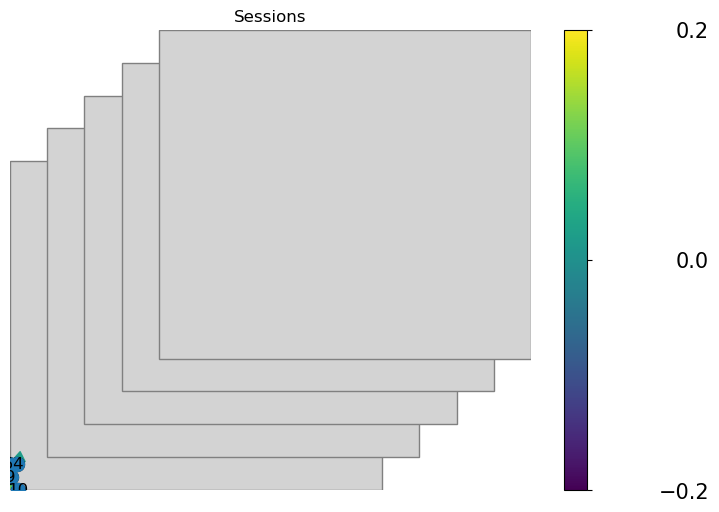

In [43]:
fix_x = 7.08#unit in inch
ws_x = 0.34#of the axis x lenght
ws_y = 0.25
distx = 0.2 #of the axis x lenght
disty = 0.2
ax_x = fix_x/(2+1*distx)
ax_y = ax_x/6

fix_y = (8 + 7*ws_y) * ax_y

fig = plt.figure(figsize=(fix_x, fix_y))


gsEXP = GridSpec(1,1, bottom=bottom+0, top=-top+1, left=left+0., right=-right+1, wspace=ws_x,hspace = ws_y)
axEXP = []
axEXP.append(fig.add_subplot(gsEXP[0]))




# Define the rectangles' properties
rectangle_width = 50
rectangle_height = 10
# Calculate actual overlap
overlapx = 0.1 * rectangle_width
overlapy = 0.1 * rectangle_height

colors = ['red', 'green', 'blue', 'purple',  "black"] # List of colors for each rectangle

rectangles = [
    {'x': 0, 'y': 0, 'width': rectangle_width, 'height': rectangle_height},
    {'x': overlapx, 'y': overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 2*overlapx, 'y': 2*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 3*overlapx, 'y': 3*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 4*overlapx, 'y': 4*overlapy, 'width': rectangle_width, 'height': rectangle_height}]

# Draw each rectangle with smooth corners and different colors
for i, rect in enumerate(rectangles):
    patch = patches.Rectangle((rect['x'], rect['y']), rect['width'], rect['height'], edgecolor="gray", facecolor="lightgray")
    axEXP[0].add_patch(patch)

# Set limits to ensure all rectangles are visible
# Adjusting the limits to accommodate the increased overlap
axEXP[0].set_xlim(0, rectangle_width + overlapx * 4)
axEXP[0].set_ylim(0, rectangle_height + overlapy * 4)

# Remove axes
axEXP[0].axis('off')
axEXP[0].set_title("Sessions")




edge_list_1 = [(1,2,-0.1),(2,1,0.17),(7,1,-0.08), (1,3,0.11), (7,3,-0.18),
                 (2,6,-0.08),(10,9,-0.15),(3,6,0.02),(6,10,-0.09),(9,10,0.1),
                 (3,9,0.12),(8,9,-0.11),(9,6,-0.17),(5,4,0.18),(4,5,0.02),
                 (8,5,-0.02),(9,7,0.06),(9,5,-0.2)]


plot_network(axEXP[0],edge_list_1,1)
# off_x = 0.2
# off_y = 0.
# ax[0].annotate("", xy=(off_x-1.1, off_y+1.), xytext=(off_x-1.4, off_y+1.), transform=ax[0].transAxes,arrowprops=dict(arrowstyle='-[, widthB=0.3, lengthB=.1', lw=1,color='k'), zorder=100)
# ax[0].annotate("", xy=(off_x-1.08, off_y+0.7), xytext=(off_x-1.4, off_y+0.7), transform=ax[0].transAxes,arrowprops=dict(arrowstyle='-|>, head_length=0.6, head_width=0.3', lw=1,color='k'), zorder=100)
# off_x1 = 0.82
# off_y1 = -0.06
# ax[0].text(off_x1-1.1,off_y1+1.,"Inhibitory", transform=ax[0].transAxes)
# ax[0].text(off_x1-1.1,off_y1-0.13+1.,"Excitatory", transform=ax[0].transAxes)




plt.show()

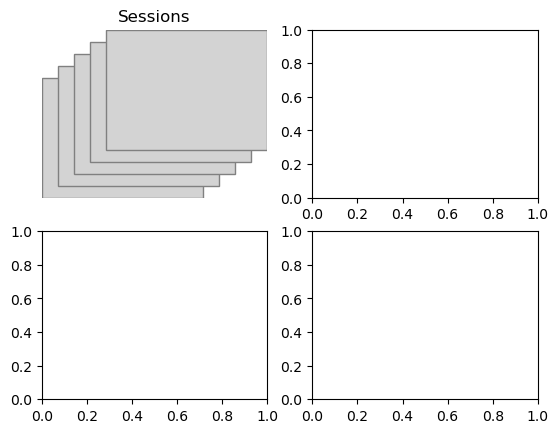

In [31]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Create a figure and ax[0,0]is
fig, ax = plt.subplots(2,2)

# Define the rectangles' properties
rectangle_width = 50
rectangle_height = 10
# Calculate actual overlap
overlapx = 0.1 * rectangle_width
overlapy = 0.1 * rectangle_height

colors = ['red', 'green', 'blue', 'purple',  "black"] # List of colors for each rectangle

rectangles = [
    {'x': 0, 'y': 0, 'width': rectangle_width, 'height': rectangle_height},
    {'x': overlapx, 'y': overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 2*overlapx, 'y': 2*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 3*overlapx, 'y': 3*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 4*overlapx, 'y': 4*overlapy, 'width': rectangle_width, 'height': rectangle_height}]

# Draw each rectangle with smooth corners and different colors
for i, rect in enumerate(rectangles):
    patch = patches.Rectangle((rect['x'], rect['y']), rect['width'], rect['height'], edgecolor="gray", facecolor="lightgray")
    ax[0,0].add_patch(patch)

# Set limits to ensure all rectangles are visible
# Adjusting the limits to accommodate the increased overlap
ax[0,0].set_xlim(0, rectangle_width + overlapx * 4)
ax[0,0].set_ylim(0, rectangle_height + overlapy * 4)

# Remove ax[0,0]es
ax[0,0].axis('off')
ax[0,0].set_title("Sessions")

plt.show()

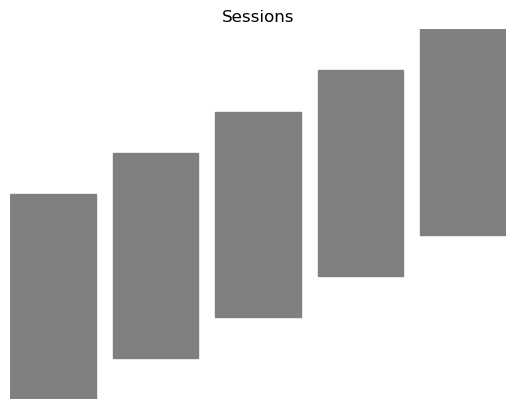

In [82]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Create a figure and axis
fig, ax = plt.subplots()

# Define the rectangles' properties
rectangle_width = 50
rectangle_height = 10
# Calculate actual overlap
overlapx = 1.2 * rectangle_width
overlapy = 0.2 * rectangle_height

colors = ['red', 'green', 'blue', 'purple',  "black"] # List of colors for each rectangle

rectangles = [
    {'x': 0, 'y': 0, 'width': rectangle_width, 'height': rectangle_height},
    {'x': overlapx, 'y': overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 2*overlapx, 'y': 2*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 3*overlapx, 'y': 3*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 4*overlapx, 'y': 4*overlapy, 'width': rectangle_width, 'height': rectangle_height}]

# Draw each rectangle with smooth corners and different colors
for i, rect in enumerate(rectangles):
    patch = patches.Rectangle((rect['x'], rect['y']), rect['width'], rect['height'], edgecolor="gray", facecolor="gray")
    ax.add_patch(patch)

# Set limits to ensure all rectangles are visible
# Adjusting the limits to accommodate the increased overlap
ax.set_xlim(0, rectangle_width + overlapx * 4)
ax.set_ylim(0, rectangle_height + overlapy * 4)

# Remove axes
ax.axis('off')
ax.set_title("Sessions")

plt.show()

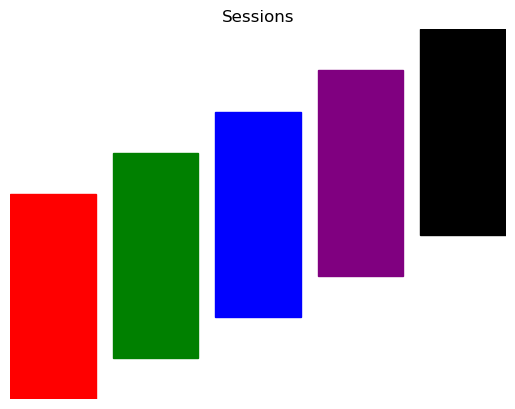

In [80]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Create a figure and axis
fig, ax = plt.subplots()

# Define the rectangles' properties
rectangle_width = 50
rectangle_height = 10
# Calculate actual overlap
overlapx = 1.2 * rectangle_width
overlapy = 0.2 * rectangle_height

colors = ['red', 'green', 'blue', 'purple',  "black"] # List of colors for each rectangle

rectangles = [
    {'x': 0, 'y': 0, 'width': rectangle_width, 'height': rectangle_height},
    {'x': overlapx, 'y': overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 2*overlapx, 'y': 2*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 3*overlapx, 'y': 3*overlapy, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 4*overlapx, 'y': 4*overlapy, 'width': rectangle_width, 'height': rectangle_height}]

# Draw each rectangle with smooth corners and different colors
for i, rect in enumerate(rectangles):
    patch = patches.Rectangle((rect['x'], rect['y']), rect['width'], rect['height'], edgecolor=colors[i], facecolor=colors[i])
    ax.add_patch(patch)

# Set limits to ensure all rectangles are visible
# Adjusting the limits to accommodate the increased overlap
ax.set_xlim(0, rectangle_width + overlapx * 4)
ax.set_ylim(0, rectangle_height + overlapy * 4)

# Remove axes
ax.axis('off')
ax.set_title("Sessions")

plt.show()

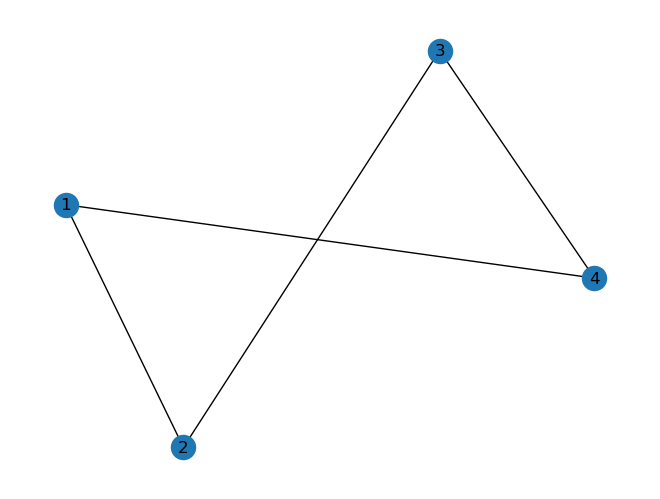

In [59]:
import networkx as nx
import matplotlib.pyplot as plt

# Creating a graph
G = nx.Graph()

# Adding nodes
G.add_node(1)
G.add_node(2)
G.add_node(3)
G.add_node(4)

# Adding edges
G.add_edge(1, 2)
G.add_edge(2, 3)
G.add_edge(3, 4)
G.add_edge(4, 1)

# Drawing the graph
nx.draw(G, with_labels=True)
plt.show()


In [66]:
import networkx as nx
import matplotlib.pyplot as plt

# Create the graph
G = nx.read_graphml("filename.graphml", node_type=str)

# Visualize
nx.draw_networkx(G)
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'filename.graphml'

In [68]:
import networkx as nx
import matplotlib.pyplot as plt

# Create the graph
G = nx.read_graphml("filename.graphml", node_type=str)

# Visualize
nx.draw_networkx(G)
plt.show()

NetworkXError: file not successfully read as graphml

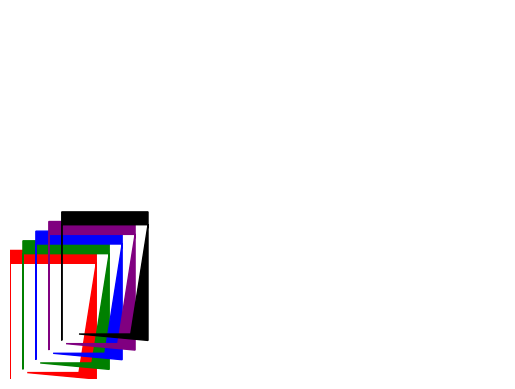

In [44]:
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches

# Create a figure and axis
fig, ax = plt.subplots()

# Define the rectangles' properties
rectangle_size = 200
rectangle_width = 200
rectangle_height = 400
overlap_percentage = 0.9 # 90% overlap
overlap = 30 # Calculate actual overlap

colors = ['red', 'green', 'blue', 'purple', "black"] # List of colors for each rectangle

rectangles = [
    {'x': 0, 'y': 0, 'width': rectangle_width, 'height': rectangle_height},
    {'x': overlap, 'y': overlap, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 2*overlap, 'y': 2*overlap, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 3*overlap, 'y': 3*overlap, 'width': rectangle_width, 'height': rectangle_height},
    {'x': 4*overlap, 'y': 4*overlap, 'width': rectangle_width, 'height': rectangle_height}
]

# Function to create a rounded rectangle path
def create_rounded_rect_path(x, y, width, height, radius):
    verts = [
        (x, y),
        (x, y+height),
        (x+width, y+height),
        (x+width, y),
        (x+radius*2, y+radius), # top-right corner
        (x+width-radius*2, y+radius), # bottom-right corner
        (x+width, y+height-radius*2), # bottom-left corner
        (x+radius*2, y+height-radius*2), # top-left corner
        (x, y+height-radius*2),
        (x, y),
    ]
    codes = [Path.MOVETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.CLOSEPOLY]
    return Path(verts, codes)

# Draw each rectangle with rounded corners and different colors
for i, rect in enumerate(rectangles):
    path = create_rounded_rect_path(rect['x'], rect['y'], rect['width'], rect['height'], radius=20) # Adjust radius as needed
    patch = patches.PathPatch(path, edgecolor=colors[i], facecolor=colors[i], lw=1)
    ax.add_patch(patch)

# Set limits to ensure all rectangles are visible
# Adjusting the limits to accommodate the increased overlap
ax.set_xlim(0, (rectangle_size + overlap) * 5)
ax.set_ylim(0, (rectangle_size + overlap) * 5)

# Remove axes
ax.axis('off')

plt.show()

ValueError: 'codes' must be a 1D list or array with the same length of 'vertices'. Your vertices have shape (10, 2) but your codes have shape (9,)

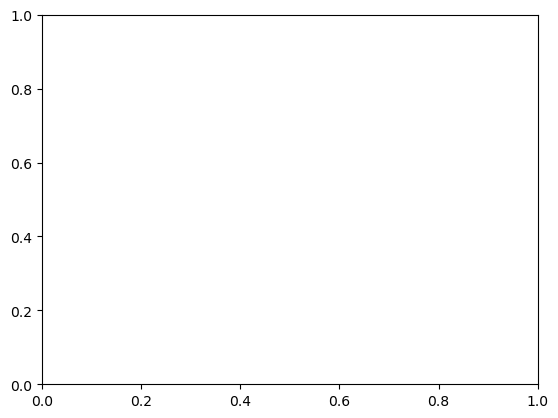

In [42]:
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches

# Create a figure and axis
fig, ax = plt.subplots()

# Define the rectangles' properties
rectangle_size = 2
overlap_percentage = 0.9 # 90% overlap
overlap = int(rectangle_size * overlap_percentage) # Calculate actual overlap

colors = ['red', 'green', 'blue', 'yellow', 'purple'] # List of colors for each rectangle

rectangles = [
    {'x': 0, 'y': 0, 'width': rectangle_size, 'height': rectangle_size},
    {'x': rectangle_size + overlap, 'y': rectangle_size + overlap, 'width': rectangle_size, 'height': rectangle_size},
    {'x': (rectangle_size + overlap) * 2, 'y': (rectangle_size + overlap) * 2, 'width': rectangle_size, 'height': rectangle_size},
    {'x': (rectangle_size + overlap) * 3, 'y': (rectangle_size + overlap) * 3, 'width': rectangle_size, 'height': rectangle_size},
    {'x': (rectangle_size + overlap) * 4, 'y': (rectangle_size + overlap) * 4, 'width': rectangle_size, 'height': rectangle_size}
]

# Function to create a rounded rectangle path
def create_rounded_rect_path(x, y, width, height, radius):
    verts = [
        (x, y),
        (x, y+height),
        (x+width, y+height),
        (x+width, y),
        (x+radius*2, y+radius), # top-right corner
        (x+width-radius*2, y+radius), # bottom-right corner
        (x+width, y+height-radius*2), # bottom-left corner
        (x+radius*2, y+height-radius*2), # top-left corner
        (x, y+height-radius*2),
        (x, y),
    ]
    codes = [Path.MOVETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.LINETO,
             Path.CLOSEPOLY]
    return Path(verts, codes)

# Draw each rectangle with rounded corners and different colors
for i, rect in enumerate(rectangles):
    path = create_rounded_rect_path(rect['x'], rect['y'], rect['width'], rect['height'], radius=1) # Adjust radius as needed
    patch = patches.PathPatch(path, edgecolor='black', facecolor=colors[i], lw=1)
    ax.add_patch(patch)

# Set limits to ensure all rectangles are visible
# Adjusting the limits to accommodate the increased overlap
ax.set_xlim(0, (rectangle_size + overlap) * 5)
ax.set_ylim(0, (rectangle_size + overlap) * 5)

# Remove axes
ax.axis('off')

plt.show()


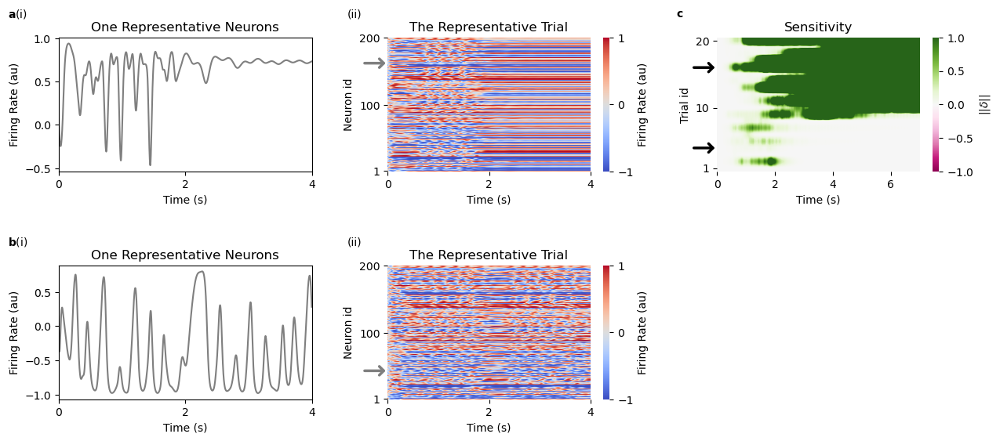

In [68]:
session=1

# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 6))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot
g = 10

for j, id in enumerate([161, 42]):
    if id ==161:
        axs[j, 0].plot(data[f"session={session}"][f"g={g}"]["example"][id], color='#7f7f7f')
    else:
        axs[j, 0].plot(data[f"session={session}"][f"g={g}"]["example_2"][id], color='#7f7f7f')
        
    axs[j, 0].set_xlim(0,4000)
    axs[j, 0].set_xticks([0, 2000, 4000])
    axs[j, 0].set_xticklabels([0, 2, 4])
    axs[j, 0].set_title('One Representative Neurons')
    axs[j, 0].set_ylabel('Firing Rate (au)')
    
    if id ==161:
        g1 = axs[j, 1].imshow(data[f"session={session}"][f"g={g}"]["example"][:,:4000], cmap="coolwarm", vmin=-1, vmax=1, aspect='auto')
    else:
        g1 = axs[j, 1].imshow(data[f"session={session}"][f"g={g}"]["example_2"][:,:4000], cmap="coolwarm", vmin=-1, vmax=1, aspect='auto')        
    
    axs[j, 1].invert_yaxis()
    cbar = plt.colorbar(g1)
    cbar.set_label('Firing Rate (au)')
    axs[j, 1].spines["top"].set_visible(False)
    axs[j, 1].spines["bottom"].set_visible(False)
    axs[j, 1].spines["right"].set_visible(False)
    axs[j, 1].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.set_ticks([-1,0,1])
    
    axs[j, 1].set_yticks(np.array([0, 99, 199]))
    axs[j, 1].set_yticklabels(np.array([0, 99, 199])+1)
    
    axs[j, 1].set_xticks(np.array([0,1999, 3999]))
    axs[j, 1].set_xticklabels(np.array([0,2, 4]), rotation=0)
    
    axs[j, 1].set_ylabel("Neuron id")
    
    
    axs[j, 1].annotate('', xy=(0, id), xycoords='data',
                xytext=(-500, id), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='#7f7f7f',lw=2.5))
    axs[j, 1].set_title('The Representative Trial')
    


j=0
g2 = axs[j, 2].imshow(y, cmap="PiYG", vmin = -1, vmax = 1, aspect='auto')
axs[j, 2].invert_yaxis()
cbar = plt.colorbar(g2)
cbar.set_label(r'$||\delta||$')
axs[j, 2].spines["top"].set_visible(False)
axs[j, 2].spines["bottom"].set_visible(False)
axs[j, 2].spines["right"].set_visible(False)
axs[j, 2].spines["left"].set_visible(False)
cbar.outline.set_visible(False)
cbar.formatter.set_powerlimits((0, 0))

# to get 10^3 instead of 1e3
cbar.formatter.set_useMathText(True)



axs[j, 2].set_yticks(np.array([0, 9, 19]))
axs[j, 2].set_yticklabels(np.array([0, 9, 19])+1)

xticks = np.array([0, 1999, 3999, 5999]) 
xticklabels = np.array([0, 2, 4, 6]) 

axs[j, 2].set_xticks(xticks)
axs[j, 2].set_xticklabels(xticklabels, rotation=0)

axs[j, 2].annotate('', xy=(0, 3), xycoords='data',
            xytext=(-7000/8, 3), textcoords='data',
            va='top', ha='left',
            arrowprops=dict(arrowstyle='->, head_width=0.4',color='k',lw=2.5))

axs[j, 2].annotate('', xy=(0, 15), xycoords='data',
            xytext=(-7000/8, 15), textcoords='data',
            va='top', ha='left',
            arrowprops=dict(arrowstyle='->, head_width=0.4',color='k',lw=2.5))


axs[j, 2].set_title('Sensitivity')

axs[j, 2].set_ylabel("Trial id")

# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')


axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)


axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)

axs[0,2].text(-0.2,1.15,r"$\bf{c}$",horizontalalignment='left', transform=axs[0,2].transAxes)

axs[1,2].remove()

# Save the plot
# fig.savefig("./figures/fig2.pdf")
# plt.close()


In [38]:
thresh = np.sqrt(200*10**(-8))

In [39]:
y= data[f"session={session}"][f"g={g}"]["delta"]
y.shape

(20, 7000)

In [62]:
y_new = (y-thresh) / y.max(axis=1).reshape(-1,1)

In [47]:
y.max(axis=1).reshape(-1,1)

array([[2.43020238e-03],
       [2.00604111e+00],
       [2.43174603e-02],
       [1.13741112e-01],
       [4.63057618e-01],
       [2.30890427e-01],
       [9.39901968e-01],
       [2.19213499e-01],
       [8.47584048e+00],
       [1.09252487e+01],
       [1.24326196e+01],
       [1.13738818e+01],
       [1.75212788e+01],
       [1.69862713e+01],
       [1.59945183e+01],
       [1.40384642e+01],
       [1.68599156e+01],
       [1.61010768e+01],
       [1.15734825e+01],
       [1.31641657e+01]])

In [51]:
 y_new[4,2000], y_new[4,4000],y_new[14,6000],

(0.5293899932180538, 0.020289891747987513, 0.8567261096061735)

In [57]:
( y[14,6000] - thresh) / y.max(axis=1)[14]

0.8567261096061735

In [40]:
y[y>thresh]

array([1.41855546e-03, 1.43151579e-03, 1.44492853e-03, ...,
       1.31333650e+01, 1.31333183e+01, 1.31332708e+01])

In [13]:
y[:,0]

array([0.00141421, 0.00141421, 0.00141421, 0.00141421, 0.00141421,
       0.00141421, 0.00141421, 0.00141421, 0.00141421, 0.00141421,
       0.00141421, 0.00141421, 0.00141421, 0.00141421, 0.00141421,
       0.00141421, 0.00141421, 0.00141421, 0.00141421, 0.00141421])

In [25]:
data[f"session={session}"][f"g={7}"]["delta"][:,0]

array([0.00141421, 0.00141421, 0.00141421, 0.00141421, 0.00141421,
       0.00141421, 0.00141421, 0.00141421, 0.00141421, 0.00141421,
       0.00141421, 0.00141421, 0.00141421, 0.00141421, 0.00141421,
       0.00141421, 0.00141421, 0.00141421, 0.00141421, 0.00141421])

In [19]:
np.sqrt(np.dot(data[f"session={session}"][f"g={g}"]["example"][:,0],data[f"session={session}"][f"g={g}"]["example"][:,0]))

8.38073073126667

In [16]:
data[f"session={session}"][f"g={g}"].keys()

dict_keys(['example', 'example_2', 'delta', 'delta_index', 'delta_mean', 'delta_point'])

In [21]:
data[f"session={session}"][f"g={g}"]["example"].shape

(200, 4000)

In [3]:
def Fit(y_aux):
    x_aux = np.arange(len(y_aux))

    # Fit a line to the data
    coefficients = np.polyfit(x_aux, y_aux, 1)
    
    # Create a polynomial function from the coefficients
    polynomial = np.poly1d(coefficients)
    
    # Use the fitted line to predict y-values
    y_fit = polynomial(x_aux)

    return coefficients[0], coefficients[1]

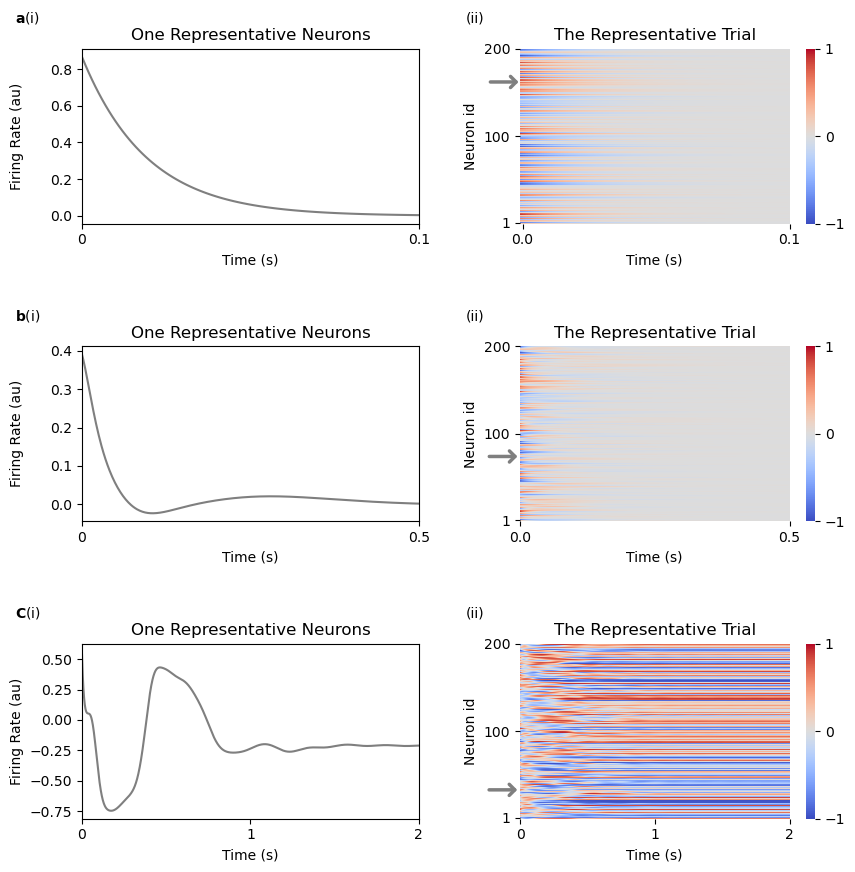

In [3]:
# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(10, 10))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot

for j, g in enumerate([1, 4, 7]):
    id = 161
    if g==4:
        id = 73
    if g==7:
        id = 32
    axs[j, 0].plot(data[f"g={g}"]["rates1"]['rep=0'][id], color='#7f7f7f')
    axs[j, 0].set_title('One Representative Neurons')
    axs[j, 0].set_ylabel('Firing Rate (au)')

    lim = 100
    if g==4:
        lim = 500
    if g==7:
        lim = 2000
        
    g1 = axs[j, 1].imshow(data[f"g={g}"]["rates1"]['rep=0'][:,:lim], cmap="coolwarm", vmin=-1, vmax=1, aspect='auto')
    axs[j, 1].invert_yaxis()
    cbar = plt.colorbar(g1)
    axs[j, 1].spines["top"].set_visible(False)
    axs[j, 1].spines["bottom"].set_visible(False)
    axs[j, 1].spines["right"].set_visible(False)
    axs[j, 1].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.set_ticks([-1,0,1])

    axs[j, 1].set_yticks(np.array([0, 99, 199]) + 0.5)
    axs[j, 1].set_yticklabels(np.array([0, 99, 199])+1)
    
    xticks = np.array([0, 99]) 
    xticklabels = np.array([0, 0.1]) 
    if g==4:
        xticks = np.array([0, 499]) 
        xticklabels = np.array([0, 0.5]) 
    if g==7:
        xticks = np.array([0,999, 1999])
        xticklabels = np.array([0, 1, 2])
    
    axs[j, 1].set_xticks(xticks+ 0.5)
    axs[j, 1].set_xticklabels(xticklabels, rotation=0)
    
    axs[j, 1].annotate('', xy=(0, id+.5), xycoords='data',
                xytext=(-lim/8, id+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='#7f7f7f',lw=2.5))
    axs[j, 1].set_title('The Representative Trial')

    axs[j, 1].set_ylabel("Neuron id")



axs[0, 0].set_xlim(0,100)
axs[0, 0].set_xticks([0, 100])
axs[0, 0].set_xticklabels([0, 0.1])

axs[1, 0].set_xlim(0,500)
axs[1, 0].set_xticks([0, 500])
axs[1, 0].set_xticklabels([0, 0.5])

axs[2, 0].set_xlim(0,2000)
axs[2, 0].set_xticks([0, 1000, 2000])
axs[2, 0].set_xticklabels([0, 1, 2])
    


# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')

axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)


axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)

axs[2,0].text(-0.2,1.15,r"$\bf{C}$"+"(i)",horizontalalignment='left', transform=axs[2,0].transAxes)
axs[2,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[2,1].transAxes)


fig.align_ylabels(axs[:,0])


# Save the plot
fig.savefig("fig1.pdf")

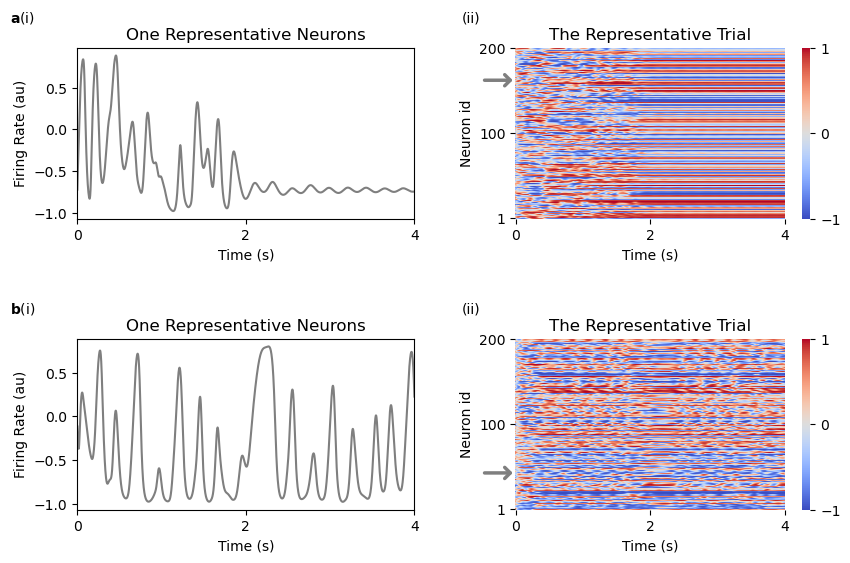

In [4]:
# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 6))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot
g = 10

for j, rep in enumerate([12, 13]):
    id = 161
    if rep ==13:
        id =42
    axs[j, 0].plot(data[f"g={g}"]["rates1"][f'rep={rep}'][id], color='#7f7f7f')
    
    axs[j, 0].set_xlim(0,4000)
    axs[j, 0].set_xticks([0, 2000, 4000])
    axs[j, 0].set_xticklabels([0, 2, 4])
    axs[j, 0].set_title('One Representative Neurons')
    axs[j, 0].set_ylabel('Firing Rate (au)')
    
    
    g1 = axs[j, 1].imshow(data[f"g={g}"]["rates1"][f'rep={rep}'][:,:4000], cmap="coolwarm", vmin=-1, vmax=1, aspect='auto')
    axs[j, 1].invert_yaxis()
    cbar = plt.colorbar(g1)
    axs[j, 1].spines["top"].set_visible(False)
    axs[j, 1].spines["bottom"].set_visible(False)
    axs[j, 1].spines["right"].set_visible(False)
    axs[j, 1].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.set_ticks([-1,0,1])
    
    axs[j, 1].set_yticks(np.array([0, 99, 199]) + 0.5)
    axs[j, 1].set_yticklabels(np.array([0, 99, 199])+1)
    
    axs[j, 1].set_xticks(np.array([0,1999, 3999]) + 0.5)
    axs[j, 1].set_xticklabels(np.array([0,2, 4]), rotation=0)
    
    axs[j, 1].set_ylabel("Neuron id")
    
    
    axs[j, 1].annotate('', xy=(0, id+.5), xycoords='data',
                xytext=(-500, id+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='#7f7f7f',lw=2.5))
    axs[j, 1].set_title('The Representative Trial')
    
        

# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')


axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)


axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)




# Save the plot
fig.savefig("fig2.pdf")

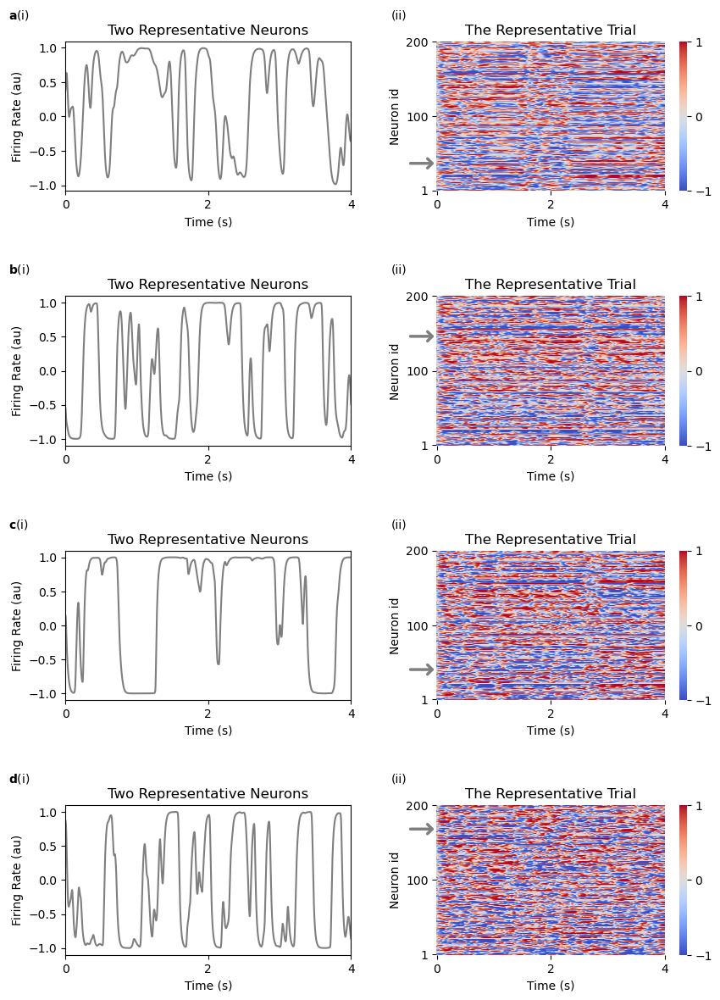

In [5]:
# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(10, 14))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot
ids = [36, 145, 40, 167]
for j, g in enumerate([13, 16, 19, 22]):

    id = ids[j]
    axs[j, 0].plot(data[f"g={g}"]["rates1"]['rep=0'][id], color='#7f7f7f')
    axs[j, 0].set_title('Two Representative Neurons')
    axs[j, 0].set_xlim(0,4000)
    axs[j, 0].set_xticks([0, 2000, 4000])
    axs[j, 0].set_xticklabels([0, 2, 4])
    axs[j, 0].set_ylabel('Firing Rate (au)')
    
    g1 = axs[j, 1].imshow(data[f"g={g}"]["rates1"]['rep=0'][:,:4000], cmap="coolwarm", vmin=-1, vmax=1, aspect='auto')
    axs[j, 1].invert_yaxis()
    cbar = plt.colorbar(g1)
    axs[j, 1].spines["top"].set_visible(False)
    axs[j, 1].spines["bottom"].set_visible(False)
    axs[j, 1].spines["right"].set_visible(False)
    axs[j, 1].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.set_ticks([-1,0,1])
    
    axs[j, 1].set_yticks(np.array([0, 99, 199]) + 0.5)
    axs[j, 1].set_yticklabels(np.array([0, 99, 199])+1)
    
    axs[j, 1].set_xticks(np.array([0,1999, 3999]) + 0.5)
    axs[j, 1].set_xticklabels(np.array([0,2, 4]), rotation=0)
    
    axs[j, 1].set_ylabel("Neuron id")
    
    axs[j, 1].annotate('', xy=(0, id+.5), xycoords='data',
                xytext=(-500, id+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='#7f7f7f',lw=2.5))
    axs[j, 1].set_title('The Representative Trial')


# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')


axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)


axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)

axs[2,0].text(-0.2,1.15,r"$\bf{c}$"+"(i)",horizontalalignment='left', transform=axs[2,0].transAxes)
axs[2,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[2,1].transAxes)

axs[3,0].text(-0.2,1.15,r"$\bf{d}$"+"(i)",horizontalalignment='left', transform=axs[3,0].transAxes)
axs[3,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[3,1].transAxes)




# Save the plot
fig.savefig("fig3.pdf")

In [19]:
# # Create a figure and a set of subplots with specified dimensions
# fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 6))

# # Adjust the horizontal space between subplots
# plt.subplots_adjust(wspace=0.3, hspace=0.7)

# # Plotting on each subplot
# g = 10

# for j, rep in enumerate([12, 13]):
#     id = 161
#     if rep ==13:
#         id =42
#     axs[j, 0].plot(data[f"g={g}"]["rates1"][f'rep={rep}'][id], color='#7f7f7f')
    
#     axs[j, 0].set_xlim(0,4000)
#     axs[j, 0].set_xticks([0, 2000, 4000])
#     axs[j, 0].set_xticklabels([0, 2, 4])
#     axs[j, 0].set_title('One Representative Neurons')
#     axs[j, 0].set_ylabel('Firing Rate (au)')
    
    
#     g1 = sns.heatmap(data[f"g={g}"]["rates1"][f'rep={rep}'][:,:4000], cmap="coolwarm", vmin=-1, vmax=1, ax=axs[j, 1], cbar_kws={"ticks":[-1, 0, 1]})
#     g1.invert_yaxis()
#     g1.set_yticks(np.array([0, 99, 199]) + 0.5)
#     g1.set_yticklabels(np.array([0, 99, 199])+1)
    
#     g1.set_xticks(np.array([0,1999, 3999]) + 0.5)
#     g1.set_xticklabels(np.array([0,2, 4]), rotation=0)
    
#     g1.set_ylabel("Neuron id")
    
    
#     g1.annotate('', xy=(0, id+.5), xycoords='data',
#                 xytext=(-500, id+.5), textcoords='data',
#                 va='top', ha='left',
#                 arrowprops=dict(arrowstyle='->, head_width=0.4',color='#7f7f7f',lw=2.5))
#     axs[j, 1].set_title('The Representative Trial')
    
        

# # Optionally, add labels and titles to each subplot
# for ax in axs.flat:
#     ax.set(xlabel='Time (s)')


# axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
# axs[0,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)


# axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
# axs[1,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)




# # Save the plot
# fig.savefig("fig2.pdf")

In [4]:
T, dt = 7000, 1
size = 200
p = 0.1
rep = 20

In [5]:
data_to_save = {}

for g in range(1,24,3):
    
    diff = np.zeros((rep, int(T/dt)), dtype=float)
    m, n = diff.shape

    for i in range(rep):
        rates1 = data[f"g={g}"]["rates1"][f'rep={i}']
        rates2 = data[f"g={g}"]["rates2"][f'rep={i}']
        for j in range(n):
            diff[i, j] = np.sqrt(np.dot(rates2[:, j] - rates1[:, j], rates2[:, j] - rates1[:, j]))
    data_to_save[f"g={g}"] = diff

In [6]:
def Fit(y_aux):
    x_aux = np.arange(len(y_aux))

    # Fit a line to the data
    coefficients = np.polyfit(x_aux, y_aux, 1)
    
    # Create a polynomial function from the coefficients
    polynomial = np.poly1d(coefficients)
    
    # Use the fitted line to predict y-values
    y_fit = polynomial(x_aux)

    return coefficients[0], coefficients[1]

NameError: name 'data_to_save' is not defined

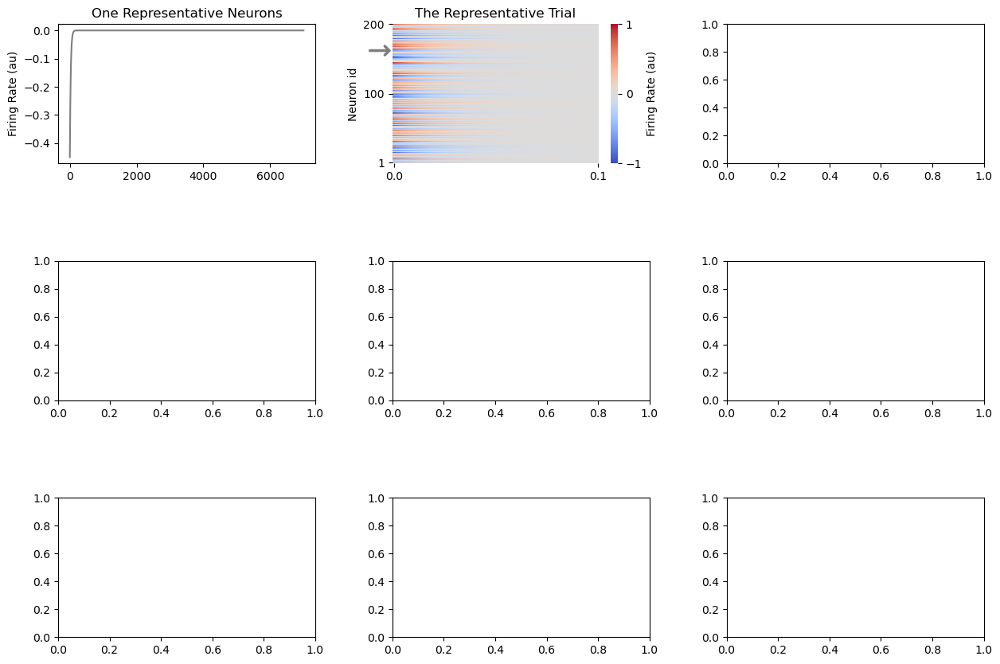

In [5]:
# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot

for j, g in enumerate([1, 4, 7]):
    rep = 4
    id = 161
    if g==4:
        rep = 16
        id = 73
    if g==7:
        rep = 13
        id = 32
    axs[j, 0].plot(data[f"g={g}"]["rates1"][f'rep={rep}'][id], color='#7f7f7f')
    axs[j, 0].set_title('One Representative Neurons')
    axs[j, 0].set_ylabel('Firing Rate (au)')

    lim = 100
    if g==4:
        lim = 500
    if g==7:
        lim = 2000
        
    g1 = axs[j, 1].imshow(data[f"g={g}"]["rates1"][f'rep={rep}'][:,:lim], cmap="coolwarm", vmin=-1, vmax=1, aspect='auto')
    axs[j, 1].invert_yaxis()
    cbar = plt.colorbar(g1)
    cbar.set_label('Firing Rate (au)')
    axs[j, 1].spines["top"].set_visible(False)
    axs[j, 1].spines["bottom"].set_visible(False)
    axs[j, 1].spines["right"].set_visible(False)
    axs[j, 1].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.set_ticks([-1,0,1])

    axs[j, 1].set_yticks(np.array([0, 99, 199]) + 0.5)
    axs[j, 1].set_yticklabels(np.array([0, 99, 199])+1)
    
    xticks = np.array([0, 99]) 
    xticklabels = np.array([0, 0.1]) 
    if g==4:
        xticks = np.array([0, 499]) 
        xticklabels = np.array([0, 0.5]) 
    if g==7:
        xticks = np.array([0,999, 1999])
        xticklabels = np.array([0, 1, 2])
    
    axs[j, 1].set_xticks(xticks+ 0.5)
    axs[j, 1].set_xticklabels(xticklabels, rotation=0)
    
    axs[j, 1].annotate('', xy=(0, id+.5), xycoords='data',
                xytext=(-lim/8, id+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='#7f7f7f',lw=2.5))
    axs[j, 1].set_title('The Representative Trial')

    axs[j, 1].set_ylabel("Neuron id")




    lim = 100
    if g==4:
        lim = 200
    if g==7:
        lim = 3000

    g2 = axs[j, 2].imshow(data_to_save[f"g={g}"][:,:lim], cmap="copper", vmin=0, aspect='auto')
    axs[j, 2].invert_yaxis()
    cbar = plt.colorbar(g2)
    cbar.set_label(r'$||\delta||$')
    axs[j, 2].spines["top"].set_visible(False)
    axs[j, 2].spines["bottom"].set_visible(False)
    axs[j, 2].spines["right"].set_visible(False)
    axs[j, 2].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.formatter.set_powerlimits((0, 0))

    # to get 10^3 instead of 1e3
    cbar.formatter.set_useMathText(True)
    cbar.set_ticks([0, 0.0005, 0.001])
    if g==7:
        cbar.set_ticks([0, 0.005, 0.01])
    

    axs[j, 2].set_yticks(np.array([0, 9, 19]))
    axs[j, 2].set_yticklabels(np.array([0, 9, 19])+1)
    
    xticks = np.array([0, 99]) 
    xticklabels = np.array([0, 0.1]) 
    if g==4:
        xticks = np.array([0, 199]) 
        xticklabels = np.array([0, 0.2]) 
    if g==7:
        xticks = np.array([0,999, 1999, 2999])
        xticklabels = np.array([0, 1, 2, 3])
    
    axs[j, 2].set_xticks(xticks+ 0.5)
    axs[j, 2].set_xticklabels(xticklabels, rotation=0)
    
    axs[j, 2].annotate('', xy=(0, rep+.5), xycoords='data',
                xytext=(-lim/8, rep+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='k',lw=2.5))
    axs[j, 2].set_title('Sensitivity')

    axs[j, 2].set_ylabel("Trial id")



axs[0, 0].set_xlim(0,100)
axs[0, 0].set_xticks([0, 100])
axs[0, 0].set_xticklabels([0, 0.1])

axs[1, 0].set_xlim(0,500)
axs[1, 0].set_xticks([0, 500])
axs[1, 0].set_xticklabels([0, 0.5])

axs[2, 0].set_xlim(0,2000)
axs[2, 0].set_xticks([0, 1000, 2000])
axs[2, 0].set_xticklabels([0, 1, 2])
    


# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')

axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)
axs[0,2].text(-0.2,1.15,"(iii)",horizontalalignment='left', transform=axs[0,2].transAxes)

axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)
axs[1,2].text(-0.2,1.15,"(iii)",horizontalalignment='left', transform=axs[1,2].transAxes)

axs[2,0].text(-0.2,1.15,r"$\bf{C}$"+"(i)",horizontalalignment='left', transform=axs[2,0].transAxes)
axs[2,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[2,1].transAxes)
axs[2,2].text(-0.2,1.15,"(iii)",horizontalalignment='left', transform=axs[2,2].transAxes)


fig.align_ylabels(axs[:,0])


# Save the plot
fig.savefig("fig1.pdf")

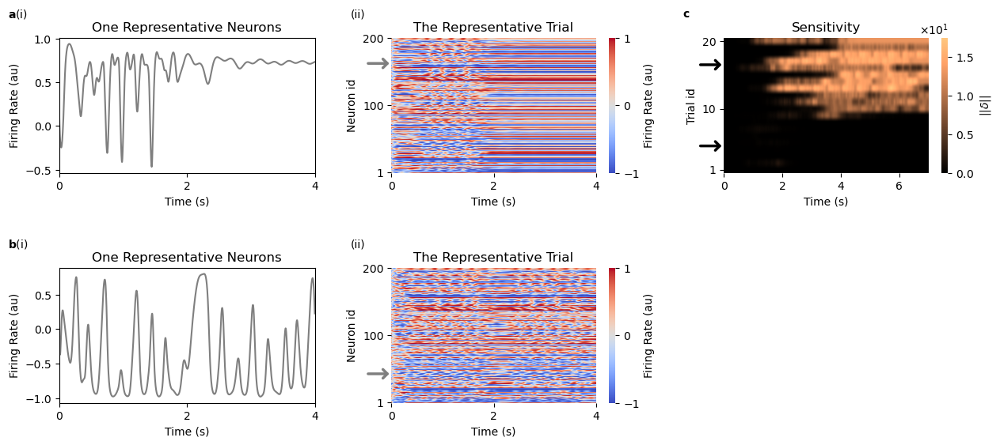

In [83]:
# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 6))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot
g = 10

for j, rep in enumerate([6, 13]):
    id = 161
    if rep ==13:
        id =42
    axs[j, 0].plot(data[f"g={g}"]["rates1"][f'rep={rep}'][id], color='#7f7f7f')
    
    axs[j, 0].set_xlim(0,4000)
    axs[j, 0].set_xticks([0, 2000, 4000])
    axs[j, 0].set_xticklabels([0, 2, 4])
    axs[j, 0].set_title('One Representative Neurons')
    axs[j, 0].set_ylabel('Firing Rate (au)')
    
    
    g1 = axs[j, 1].imshow(data[f"g={g}"]["rates1"][f'rep={rep}'][:,:4000], cmap="coolwarm", vmin=-1, vmax=1, aspect='auto')
    axs[j, 1].invert_yaxis()
    cbar = plt.colorbar(g1)
    cbar.set_label('Firing Rate (au)')
    axs[j, 1].spines["top"].set_visible(False)
    axs[j, 1].spines["bottom"].set_visible(False)
    axs[j, 1].spines["right"].set_visible(False)
    axs[j, 1].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.set_ticks([-1,0,1])
    
    axs[j, 1].set_yticks(np.array([0, 99, 199]) + 0.5)
    axs[j, 1].set_yticklabels(np.array([0, 99, 199])+1)
    
    axs[j, 1].set_xticks(np.array([0,1999, 3999]) + 0.5)
    axs[j, 1].set_xticklabels(np.array([0,2, 4]), rotation=0)
    
    axs[j, 1].set_ylabel("Neuron id")
    
    
    axs[j, 1].annotate('', xy=(0, id+.5), xycoords='data',
                xytext=(-500, id+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='#7f7f7f',lw=2.5))
    axs[j, 1].set_title('The Representative Trial')
    


stables = []
for i in range(20):
    if data_to_save[f"g={10}"][i,-1] < 1:
        stables.append(i)

for i in range(20):
    if data_to_save[f"g={10}"][i,-1] >= 1:
        stables.append(i)

j=0
g2 = axs[j, 2].imshow(data_to_save[f"g={g}"][stables], cmap="copper", aspect='auto')
axs[j, 2].invert_yaxis()
cbar = plt.colorbar(g2)
cbar.set_label(r'$||\delta||$')
axs[j, 2].spines["top"].set_visible(False)
axs[j, 2].spines["bottom"].set_visible(False)
axs[j, 2].spines["right"].set_visible(False)
axs[j, 2].spines["left"].set_visible(False)
cbar.outline.set_visible(False)
cbar.formatter.set_powerlimits((0, 0))

# to get 10^3 instead of 1e3
cbar.formatter.set_useMathText(True)



axs[j, 2].set_yticks(np.array([0, 9, 19]))
axs[j, 2].set_yticklabels(np.array([0, 9, 19])+1)

xticks = np.array([0, 1999, 3999, 5999]) 
xticklabels = np.array([0, 2, 4, 6]) 

axs[j, 2].set_xticks(xticks+ 0.5)
axs[j, 2].set_xticklabels(xticklabels, rotation=0)

axs[j, 2].annotate('', xy=(0, 3+.5), xycoords='data',
            xytext=(-7000/8, 3+.5), textcoords='data',
            va='top', ha='left',
            arrowprops=dict(arrowstyle='->, head_width=0.4',color='k',lw=2.5))

axs[j, 2].annotate('', xy=(0, 15+.5), xycoords='data',
            xytext=(-7000/8, 15+.5), textcoords='data',
            va='top', ha='left',
            arrowprops=dict(arrowstyle='->, head_width=0.4',color='k',lw=2.5))


axs[j, 2].set_title('Sensitivity')

axs[j, 2].set_ylabel("Trial id")

# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')


axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)


axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)

axs[0,2].text(-0.2,1.15,r"$\bf{c}$",horizontalalignment='left', transform=axs[0,2].transAxes)

axs[1,2].remove()

# Save the plot
fig.savefig("fig2.pdf")

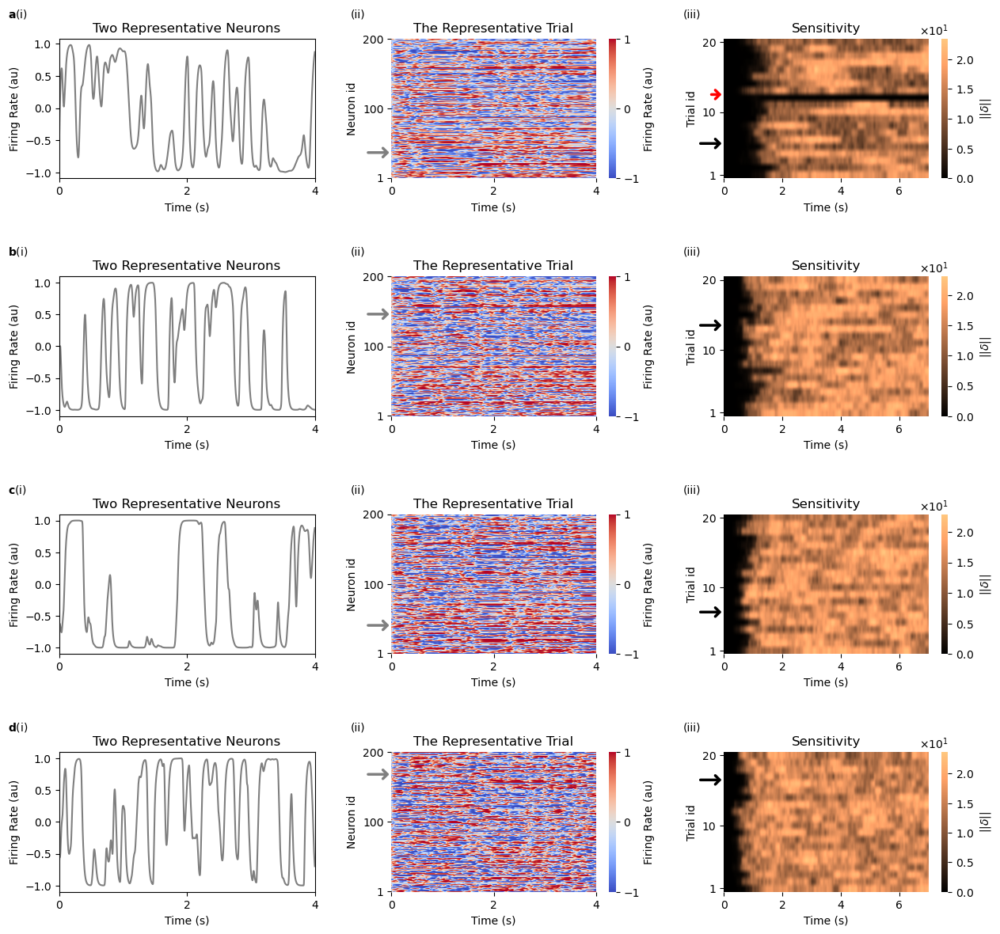

In [85]:
# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 14))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot
ids = [36, 145, 40, 167]
reps = [4,12,5,15]
for j, g in enumerate([13, 16, 19, 22]):

    id = ids[j]
    rep = reps[j]
    axs[j, 0].plot(data[f"g={g}"]["rates1"][f'rep={rep}'][id], color='#7f7f7f')
    axs[j, 0].set_title('Two Representative Neurons')
    axs[j, 0].set_xlim(0,4000)
    axs[j, 0].set_xticks([0, 2000, 4000])
    axs[j, 0].set_xticklabels([0, 2, 4])
    axs[j, 0].set_ylabel('Firing Rate (au)')
    
    g1 = axs[j, 1].imshow(data[f"g={g}"]["rates1"][f'rep={rep}'][:,:4000], cmap="coolwarm", vmin=-1, vmax=1, aspect='auto')
    axs[j, 1].invert_yaxis()
    cbar = plt.colorbar(g1)
    cbar.set_label('Firing Rate (au)')
    axs[j, 1].spines["top"].set_visible(False)
    axs[j, 1].spines["bottom"].set_visible(False)
    axs[j, 1].spines["right"].set_visible(False)
    axs[j, 1].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.set_ticks([-1,0,1])
    
    axs[j, 1].set_yticks(np.array([0, 99, 199]) + 0.5)
    axs[j, 1].set_yticklabels(np.array([0, 99, 199])+1)
    
    axs[j, 1].set_xticks(np.array([0,1999, 3999]) + 0.5)
    axs[j, 1].set_xticklabels(np.array([0,2, 4]), rotation=0)
    
    axs[j, 1].set_ylabel("Neuron id")
    
    axs[j, 1].annotate('', xy=(0, id+.5), xycoords='data',
                xytext=(-500, id+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='#7f7f7f',lw=2.5))
    axs[j, 1].set_title('The Representative Trial')



    lim = 7000
    g2 = axs[j, 2].imshow(data_to_save[f"g={g}"][:,:lim], cmap="copper", vmin=0, aspect='auto')
    axs[j, 2].invert_yaxis()
    cbar = plt.colorbar(g2)
    cbar.set_label(r'$||\delta||$')
    axs[j, 2].spines["top"].set_visible(False)
    axs[j, 2].spines["bottom"].set_visible(False)
    axs[j, 2].spines["right"].set_visible(False)
    axs[j, 2].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.formatter.set_powerlimits((0, 0))

    # to get 10^3 instead of 1e3
    cbar.formatter.set_useMathText(True)
    # cbar.set_ticks([0, 0.0005, 0.001])
    # if g==7:
    #     cbar.set_ticks([0, 0.005, 0.01])
    

    axs[j, 2].set_yticks(np.array([0, 9, 19]))
    axs[j, 2].set_yticklabels(np.array([0, 9, 19])+1)
    
    xticks = np.array([0, 1999, 3999, 5999]) 
    xticklabels = np.array([0, 2, 4, 6]) 
    
    axs[j, 2].set_xticks(xticks+ 0.5)
    axs[j, 2].set_xticklabels(xticklabels, rotation=0)
    
    axs[j, 2].annotate('', xy=(0, rep+.5), xycoords='data',
                xytext=(-lim/8, rep+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='k',lw=2.5))
    if j==0:
        axs[j, 2].annotate('', xy=(0, 11+.5), xycoords='data',
                xytext=(-lim/14, 11+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='r',lw=2.5))
    axs[j, 2].set_title('Sensitivity')

    axs[j, 2].set_ylabel("Trial id")


# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')


axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)
axs[0,2].text(-0.2,1.15,"(iii)",horizontalalignment='left', transform=axs[0,2].transAxes)

axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)
axs[1,2].text(-0.2,1.15,"(iii)",horizontalalignment='left', transform=axs[1,2].transAxes)

axs[2,0].text(-0.2,1.15,r"$\bf{c}$"+"(i)",horizontalalignment='left', transform=axs[2,0].transAxes)
axs[2,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[2,1].transAxes)
axs[2,2].text(-0.2,1.15,"(iii)",horizontalalignment='left', transform=axs[2,2].transAxes)

axs[3,0].text(-0.2,1.15,r"$\bf{d}$"+"(i)",horizontalalignment='left', transform=axs[3,0].transAxes)
axs[3,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[3,1].transAxes)
axs[3,2].text(-0.2,1.15,"(iii)",horizontalalignment='left', transform=axs[3,2].transAxes)




# Save the plot
fig.savefig("fig3.pdf")

Text(0.5, 0, 'Time (s)')

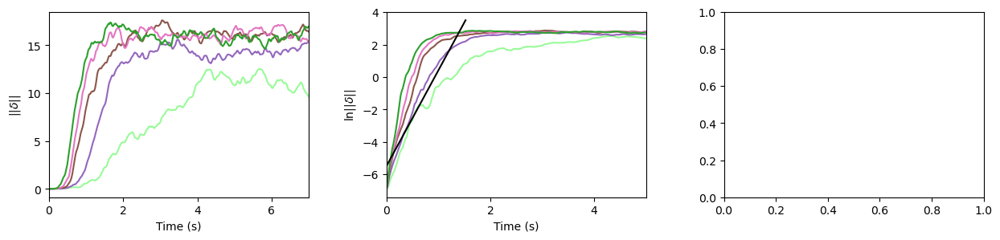

In [117]:
# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15, 3))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot


colors = [
    
    '#98FB98', # Light Green
    '#9467bd', # Purple
    '#8c564b', # Brown
    '#e377c2', # Pink
    '#2ca02c' # Green
]


for i, g in enumerate([10,13,16,19,22]):
    if g in [10,13]:
        non_stables = []
        for j in range(20):
            if data_to_save[f"g={g}"][j,-1] >= 1:
                non_stables.append(j)
        axs[0].plot(data_to_save[f"g={g}"][non_stables].mean(axis=0), c=colors[i],label=f'g={g}')

    else:
        axs[0].plot(data_to_save[f"g={g}"].mean(axis=0), c=colors[i],label=f'g={g}')

axs[0].set_xlim(0,7000)
axs[0].set_xticks([0, 2000, 4000, 6000])
axs[0].set_xticklabels([0, 2, 4, 6])
axs[0].set_yticks([0, 5, 10, 15])
axs[0].set_ylabel(r'$||\delta ||$')
axs[0].set_xlabel('Time (s)')



for i, g in enumerate([10,13,16,19,22]):
    if g in [10,13]:
        non_stables = []
        for j in range(20):
            if data_to_save[f"g={g}"][j,-1] >= 1:
                non_stables.append(j)
        axs[1].plot(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0)), c=colors[i],label=f'g={g}')

    else:
        axs[1].plot(np.log(data_to_save[f"g={g}"].mean(axis=0)), c=colors[i],label=f'g={g}')


g=13
point = np.where(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0)) >= 0.8 * np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0)).max())[0][0]
coefficients = Fit(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0))[:point])
# Create a polynomial function from the coefficients
polynomial = np.poly1d(coefficients)
# Use the fitted line to predict y-values
y_fit = polynomial(np.arange(len(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0))[:point])))

axs[1].plot(np.arange(len(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0))[:point])),y_fit,"k")



axs[1].set_xlim(0,5000)
axs[1].set_xticks([0, 2000, 4000])
axs[1].set_xticklabels([0, 2, 4])
# axs[1].set_yticks([0, 5, 10, 15])
axs[1].set_ylabel(r'$\ln ||\delta ||$')
axs[1].set_xlabel('Time (s)')

In [34]:
slopes = np.zeros(5,dtype=float)
for i,g in enumerate(np.arange(10,24,3)):
    point = np.where(np.log(data_to_save[f"g={g}"].mean(axis=0)) >= 0.8 * np.log(data_to_save[f"g={g}"].mean(axis=0)).max())[0][0]
    slopes[i] = Fit(np.log(data_to_save[f"g={g}"].mean(axis=0))[:point])[0]

Text(-0.2, 1.15, '$\\bf{C}$')

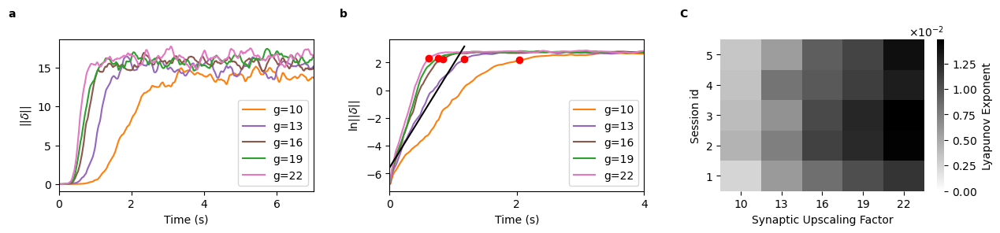

In [96]:
# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15, 2.5))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot


colors = [
    
    '#ff7f0e', # Orange
    '#9467bd', # Purple
    '#8c564b', # Brown
    '#2ca02c', # Green
    '#e377c2', # Pink
    '#98FB98', # Light Green
    '#7f7f7f', # Gray
    '#1f77b4', # Blue
    '#d62728' # Red
]


for i, g in enumerate([10,13,16,19,22]):
    if g in [10,13]:
        non_stables = []
        for j in range(20):
            if data_to_save[f"g={g}"][j,-1] >= 1:
                non_stables.append(j)
        axs[0].plot(data_to_save[f"g={g}"][non_stables].mean(axis=0), c=colors[i],label=f'g={g}')

    else:
        axs[0].plot(data_to_save[f"g={g}"].mean(axis=0), c=colors[i],label=f'g={g}')

axs[0].set_xlim(0,7000)
axs[0].set_xticks([0, 2000, 4000, 6000])
axs[0].set_xticklabels([0, 2, 4, 6])
axs[0].set_yticks([0, 5, 10, 15])
axs[0].set_ylabel(r'$||\delta ||$')
axs[0].set_xlabel('Time (s)')
axs[0].legend()



for i, g in enumerate([10,13,16,19,22]):
    non_stables = []
    for j in range(20):
        if data_to_save[f"g={g}"][j,-1] >= 1:
            non_stables.append(j)
    axs[1].plot(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0)), c=colors[i],label=f'g={g}')
    point = np.where(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0)) >= 0.8 * np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0)).max())[0][0]
    axs[1].plot(point, np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0))[point],"ro")



g=13
non_stables = []
for j in range(20):
    if data_to_save[f"g={g}"][j,-1] >= 1:
        non_stables.append(j)
point = np.where(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0)) >= 0.8 * np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0)).max())[0][0]
coefficients = Fit(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0))[:point])
# Create a polynomial function from the coefficients
polynomial = np.poly1d(coefficients)
# Use the fitted line to predict y-values
y_fit = polynomial(np.arange(len(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0))[:point])))

axs[1].plot(np.arange(len(np.log(data_to_save[f"g={g}"][non_stables].mean(axis=0))[:point])),y_fit,"k")

axs[1].legend()




g2 = axs[2].imshow(data_aux["Lyapunov_exponent"], cmap="binary", vmin=0, aspect='auto')
axs[2].invert_yaxis()
cbar = plt.colorbar(g2)
cbar.set_label("Lyapunov Exponent")
axs[2].spines["top"].set_visible(False)
axs[2].spines["bottom"].set_visible(False)
axs[2].spines["right"].set_visible(False)
axs[2].spines["left"].set_visible(False)
cbar.outline.set_visible(False)
cbar.formatter.set_powerlimits((0, 0))

# to get 10^3 instead of 1e3
cbar.formatter.set_useMathText(True)
# cbar.set_ticks([0, 0.0005, 0.001])
# if g==7:
#     cbar.set_ticks([0, 0.005, 0.01])

yticks = np.arange(5)
yticklabels = np.arange(1,6)
axs[2].set_yticks(yticks)
axs[2].set_yticklabels(yticklabels)

xticks = np.arange(5)
xticklabels = np.arange(10,24,3)
axs[2].set_xticks(xticks)
axs[2].set_xticklabels(xticklabels, rotation=0)

axs[2].annotate('', xy=(-2, 0), xycoords='data',
            xytext=(-0, 0), textcoords='data',
            va='top', ha='left',
            arrowprops=dict(arrowstyle='->, head_width=0.4',color='k',lw=2.5))

axs[2].set_ylabel("Session id")
axs[2].set_xlabel("Synaptic Upscaling Factor (g)")


axs[1].set_xlim(0,4000)
axs[1].set_xticks([0, 2000, 4000])
axs[1].set_xticklabels([0, 2, 4])
axs[1].set_ylabel(r'$\ln ||\delta ||$')
axs[1].set_xlabel('Time (s)')




axs[0].text(-0.2,1.15,r"$\bf{a}$",horizontalalignment='left', transform=axs[0].transAxes)

axs[1].text(-0.2,1.15,r"$\bf{b}$",horizontalalignment='left', transform=axs[1].transAxes)

axs[2].text(-0.2,1.15,r"$\bf{C}$",horizontalalignment='left', transform=axs[2].transAxes)


# Save the plot
# fig.savefig(f"fig_protocol_{protocol}_second.pdf")
# plt.close()

In [82]:
data_aux["Lyapunov_exponent"]

array([[0.00248297, 0.0059059 , 0.00835181, 0.01030419, 0.0117693 ],
       [0.0044557 , 0.00743363, 0.0110283 , 0.01236442, 0.01461567],
       [0.00388971, 0.00631835, 0.01049738, 0.01260368, 0.0148356 ],
       [0.00356837, 0.00810619, 0.00957064, 0.01119244, 0.01309912],
       [0.00331435, 0.00568844, 0.0093565 , 0.01084994, 0.01395181]])

In [81]:
with open('./data/data_curation.pickle', 'rb') as handle:
    data_aux = pickle.load(handle)

In [65]:
data_aux.keys()

dict_keys(['protocol=1', 'protocol=2', 'protocol=3', 'protocol=4', 'protocol=5'])

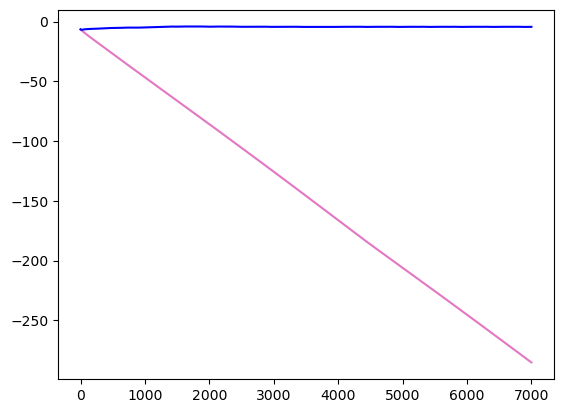

In [50]:
g=1
plt.plot(np.log(data_to_save[f"g={g}"].mean(axis=0)), c=colors[i],label=f'g={g}')

g=7
plt.plot(np.log(data_to_save[f"g={g}"].mean(axis=0)), c="b",label=f'g={g}')

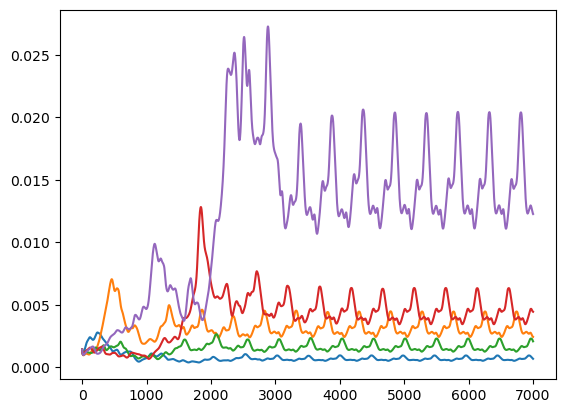

In [63]:
for i in range(15,20):
    plt.plot(data_to_save[f"g={g}"][i])

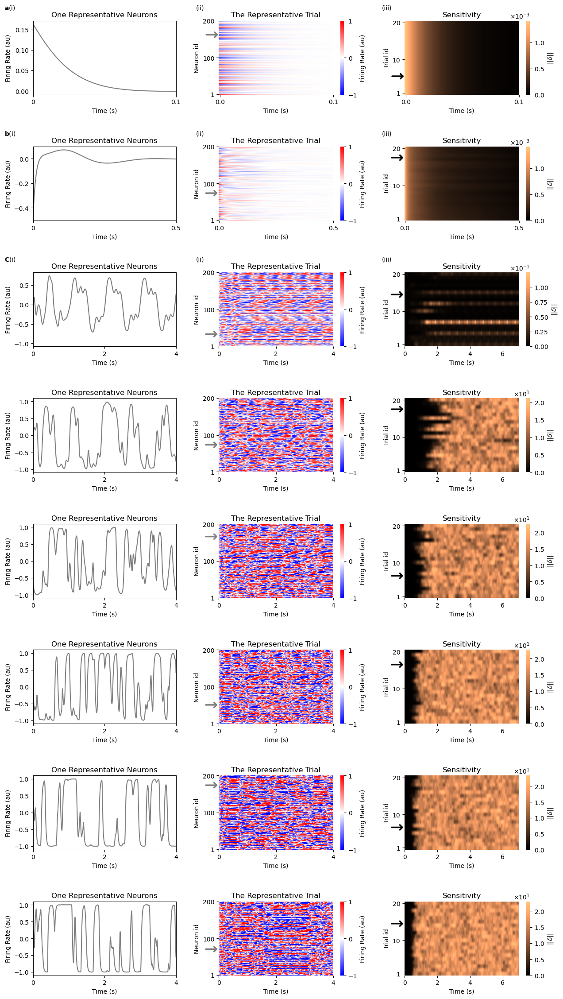

In [38]:
synaptic_upscaling = np.arange(1,24,3)

# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=len(synaptic_upscaling), ncols=3, figsize=(15, 3.5*len(synaptic_upscaling)))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot

for j, g in enumerate(synaptic_upscaling):
    rep = 4
    id = 161
    if g==4:
        rep = 16
        id = 73
    if g==7:
        rep = 13
        id = 32
    if g==10:
        rep = 16
        id = 73
    if g==13:
        rep = 5
        id = 165
    if g==16:
        rep = 15
        id = 50
    if g==19:
        rep = 5
        id = 173
    if g==22:
        rep = 13
        id = 70
    axs[j, 0].plot(data[f"g={g}"]["rates1"][f'rep={rep}'][id], color='#7f7f7f')
    axs[j, 0].set_title('One Representative Neurons')
    axs[j, 0].set_ylabel('Firing Rate (au)')

    lim = 100
    if g==4:
        lim = 500
    if g>=7:
        lim = 4000
        
    g1 = axs[j, 1].imshow(data[f"g={g}"]["rates1"][f'rep={rep}'][:,:lim], cmap="bwr", vmin=-1, vmax=1, aspect='auto')
    axs[j, 1].invert_yaxis()
    cbar = plt.colorbar(g1)
    cbar.set_label('Firing Rate (au)')
    axs[j, 1].spines["top"].set_visible(False)
    axs[j, 1].spines["bottom"].set_visible(False)
    axs[j, 1].spines["right"].set_visible(False)
    axs[j, 1].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.set_ticks([-1,0,1])

    axs[j, 1].set_yticks(np.array([0, 99, 199]) + 0.5)
    axs[j, 1].set_yticklabels(np.array([0, 99, 199])+1)
    
    xticks = np.array([0, 99]) 
    xticklabels = np.array([0, 0.1]) 
    if g==4:
        xticks = np.array([0, 499]) 
        xticklabels = np.array([0, 0.5]) 
    if g>=7:
        xticks = np.array([0, 1999, 3999])
        xticklabels = np.array([0, 2, 4])
    
    axs[j, 1].set_xticks(xticks+ 0.5)
    axs[j, 1].set_xticklabels(xticklabels, rotation=0)
    
    axs[j, 1].annotate('', xy=(0, id+.5), xycoords='data',
                xytext=(-lim/8, id+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='#7f7f7f',lw=2.5))
    axs[j, 1].set_title('The Representative Trial')

    axs[j, 1].set_ylabel("Neuron id")




    lim = 100
    if g==4:
        lim = 500
    if g>=7:
        lim = 7000
    
    stables = []
    for ij in range(20):
        if data_to_save[f"g={g}"][ij,-1] < 1:
            stables.append(ij)
    
    for ij in range(20):
        if data_to_save[f"g={g}"][ij,-1] >= 1:
            stables.append(ij)
    
    g2 = axs[j, 2].imshow(data_to_save[f"g={g}"][stables,:lim], cmap="copper", vmin=0, aspect='auto')
    axs[j, 2].invert_yaxis()
    cbar = plt.colorbar(g2)
    cbar.set_label(r'$||\delta||$')
    axs[j, 2].spines["top"].set_visible(False)
    axs[j, 2].spines["bottom"].set_visible(False)
    axs[j, 2].spines["right"].set_visible(False)
    axs[j, 2].spines["left"].set_visible(False)
    cbar.outline.set_visible(False)
    cbar.formatter.set_powerlimits((0, 0))

    # to get 10^3 instead of 1e3
    cbar.formatter.set_useMathText(True)
    if g<7:
        cbar.set_ticks([0, 0.0005, 0.001])
    

    axs[j, 2].set_yticks(np.array([0, 9, 19]))
    axs[j, 2].set_yticklabels(np.array([0, 9, 19])+1)
    
    xticks = np.array([0, 99]) 
    xticklabels = np.array([0, 0.1]) 
    if g==4:
        xticks = np.array([0, 499]) 
        xticklabels = np.array([0, 0.5]) 

    if g>=7:
        xticks = np.array([0, 1999, 3999, 5999])
        xticklabels = np.array([0, 2, 4, 6])
    
    axs[j, 2].set_xticks(xticks+ 0.5)
    axs[j, 2].set_xticklabels(xticklabels, rotation=0)
    
    axs[j, 2].annotate('', xy=(0, rep+.5), xycoords='data',
                xytext=(-lim/8, rep+.5), textcoords='data',
                va='top', ha='left',
                arrowprops=dict(arrowstyle='->, head_width=0.4',color='k',lw=2.5))
    axs[j, 2].set_title('Sensitivity')

    axs[j, 2].set_ylabel("Trial id")



axs[0, 0].set_xlim(0,100)
axs[0, 0].set_xticks([0, 100])
axs[0, 0].set_xticklabels([0, 0.1])

axs[1, 0].set_xlim(0,500)
axs[1, 0].set_xticks([0, 500])
axs[1, 0].set_xticklabels([0, 0.5])

axs[2, 0].set_xlim(0,2000)
axs[2, 0].set_xticks([0, 1000, 2000])
axs[2, 0].set_xticklabels([0, 1, 2])

for i in range(2, len(synaptic_upscaling)):
    axs[i, 0].set_xlim(0,4000)
    axs[i, 0].set_xticks([0, 2000, 4000])
    axs[i, 0].set_xticklabels([0, 2, 4])
    


# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')

axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)
axs[0,2].text(-0.2,1.15,"(iii)",horizontalalignment='left', transform=axs[0,2].transAxes)

axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)
axs[1,2].text(-0.2,1.15,"(iii)",horizontalalignment='left', transform=axs[1,2].transAxes)

axs[2,0].text(-0.2,1.15,r"$\bf{C}$"+"(i)",horizontalalignment='left', transform=axs[2,0].transAxes)
axs[2,1].text(-0.2,1.15,"(ii)",horizontalalignment='left', transform=axs[2,1].transAxes)
axs[2,2].text(-0.2,1.15,"(iii)",horizontalalignment='left', transform=axs[2,2].transAxes)


fig.align_ylabels(axs[:,0])


# Save the plot
# fig.savefig("fig1.pdf")

In [114]:
len(np.arange(len(np.log(data_to_save[f"g={g}"].mean(axis=0))[:point])))

1528

In [115]:
y_fit.shape

(1528,)

In [70]:
stables==6

[2, 3, 5, 6, 10, 11, 12, 15, 19, 0, 1, 4, 7, 8, 9, 13, 14, 16, 17, 18]

In [55]:
stables = []
for i in range(20):
    if data_to_save[f"g={10}"][i,-1] < 1:
        stables.append(i)

non_stables = []
for i in range(20):
    if data_to_save[f"g={10}"][i,-1] >= 1:
        non_stables.append(i)

In [56]:
stables

[2, 3, 5, 6, 10, 11, 12, 15, 19, 0, 1, 4, 7, 8, 9, 13, 14, 16, 17, 18]

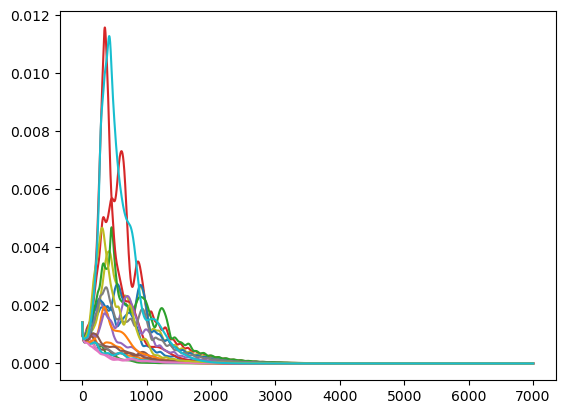

In [64]:
for i in range(20):
    plt.plot(data_to_save[f"g={7}"][i])

In [86]:
stables = []
for i in range(20):
    if data_to_save[f"g={13}"][i,-1] < 1:
        stables.append(i)
stables

[11]

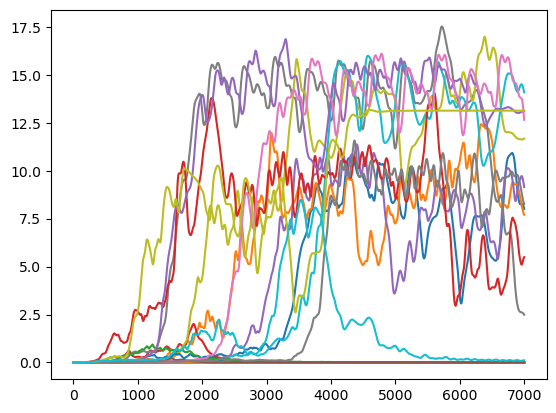

In [60]:
for i in range(20):
    # if i not in stables:
        plt.plot(data_to_save[f"g={10}"][i])

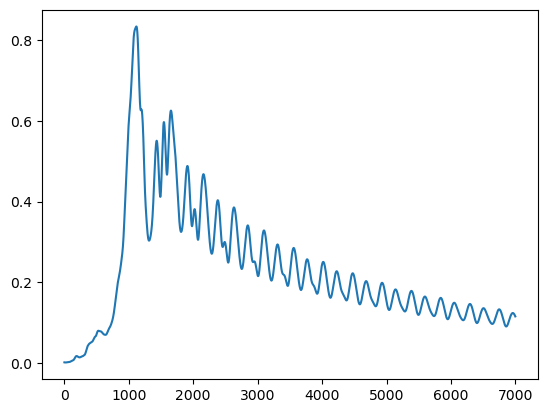

In [27]:
for i in range(20):
    if i in stables:
        plt.plot(data_to_save[f"g={13}"][i])

Text(0.5, 0, 'Time (s)')

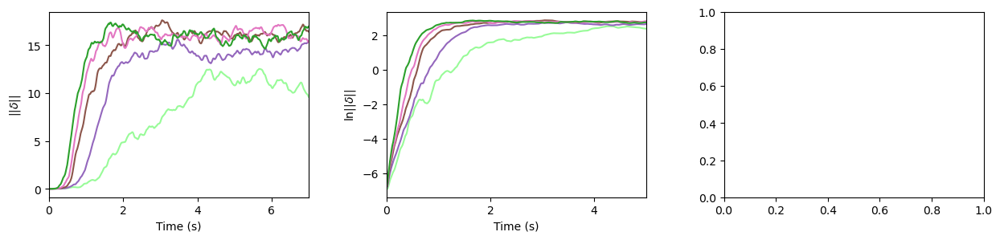

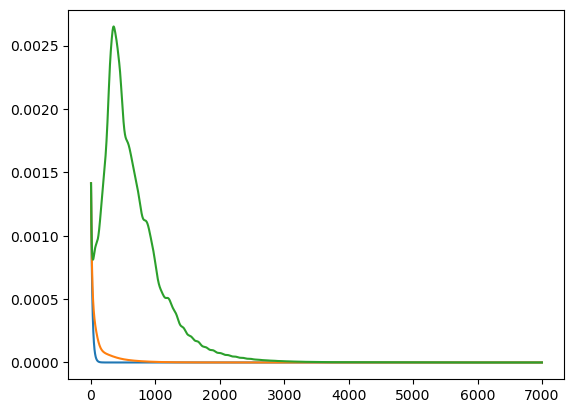

In [14]:
plt.plot(data_to_save[f"g={1}"].mean(axis=0))
plt.plot(data_to_save[f"g={4}"].mean(axis=0))
plt.plot(data_to_save[f"g={7}"].mean(axis=0))

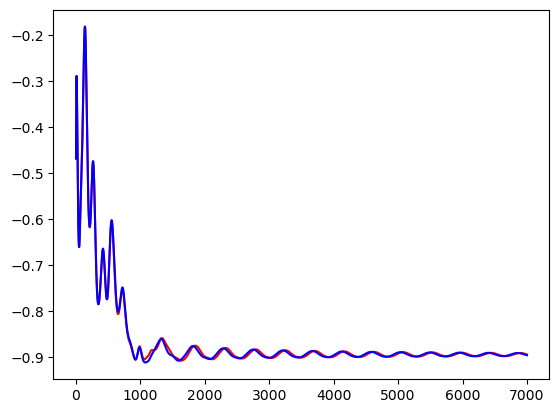

In [28]:
plt.plot(data[f"g={13}"]["rates1"][f'rep={11}'][0],"r")
plt.plot(data[f"g={13}"]["rates2"][f'rep={11}'][0],"b")

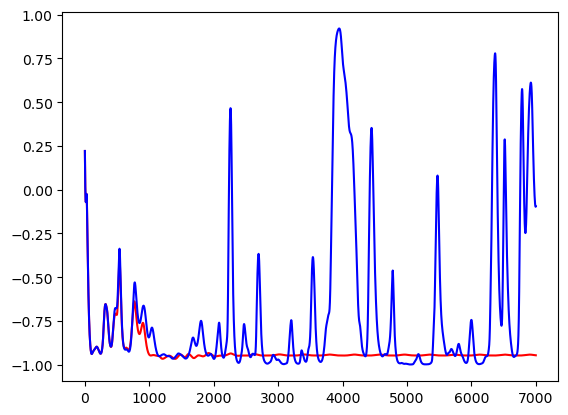

In [28]:
plt.plot(data[f"g={16}"]["rates1"][f'rep={6}'][0],"r")
plt.plot(data[f"g={16}"]["rates2"][f'rep={6}'][0],"b")

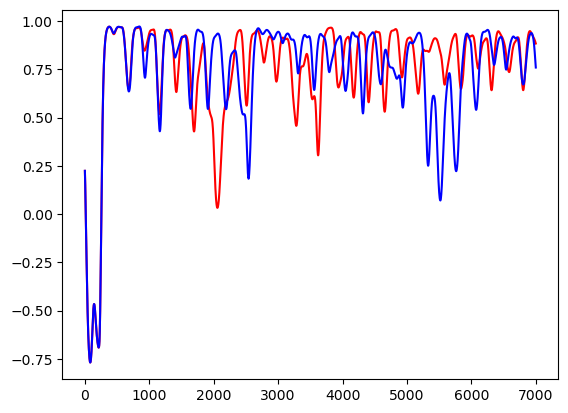

In [29]:
plt.plot(data[f"g={10}"]["rates1"][f'rep={13}'][0],"r")
plt.plot(data[f"g={10}"]["rates2"][f'rep={13}'][0],"b")

In [10]:
A = data[f"g={1}"]["rates1"]['rep=0']
for rep in range(1, 20):
    A = np.vstack((A,data[f"g={1}"]["rates1"][f'rep={rep}']))


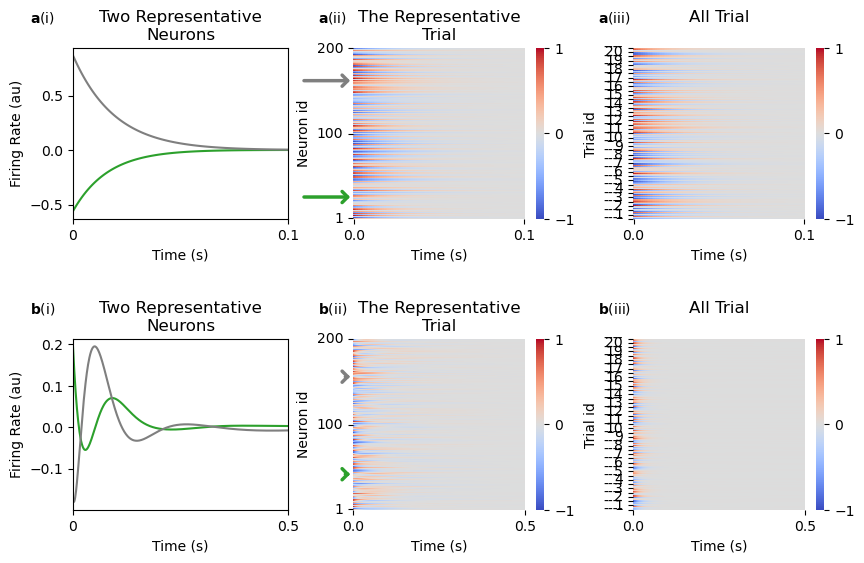

In [14]:
colors_neuron = [
    '#2ca02c', # Green
    '#7f7f7f', # Gray
]

# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(10, 6))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot
j = 0
g = 1


id = [25, 161]
for ii, i in enumerate(id):
    axs[j, 0].plot(data[f"g={g}"]["rates1"]['rep=0'][i], color=colors_neuron[ii])
axs[j, 0].set_title('Two Representative\nNeurons')

g1 = sns.heatmap(data[f"g={g}"]["rates1"]['rep=0'][:,:100], cmap="coolwarm", vmin=-1, vmax=1, ax=axs[j, 1], cbar_kws={"ticks":[-1, 0, 1]})
g1.invert_yaxis()
g1.set_yticks(np.array([0, 99, 199]) + 0.5)
g1.set_yticklabels(np.array([0, 99, 199])+1)

g1.set_xticks(np.array([0,99]) + 0.5)
g1.set_xticklabels(np.array([0,0.1]), rotation=0)

g1.set_ylabel("Neuron id")
g1.set_xlabel("Time (s)")


g1.annotate('', xy=(0, 25.5), xycoords='data',
            xytext=(-30, 25.5), textcoords='data',
            va='top', ha='left',
            arrowprops=dict(arrowstyle='->, head_width=0.4',color=colors_neuron[0],lw=2.5))

g1.annotate('', xy=(0, 161.5), xycoords='data',
            xytext=(-30, 161.5), textcoords='data',
            va='top', ha='left',
            arrowprops=dict(arrowstyle='->, head_width=0.4',color=colors_neuron[1],lw=2.5))
axs[j, 1].set_title('The Representative\nTrial')




g2 = sns.heatmap(A[:,:100], cmap="coolwarm", vmin=-1, vmax=1, ax=axs[j, 2], cbar_kws={"ticks":[-1, 0, 1]})

g2.invert_yaxis()


y_tick = np.arange(99,20*200, 100)
y_tick = np.hstack((np.array([0]),y_tick))

y_ticklabel = []
for i in range(1, 21):
    y_ticklabel.append(["----", f"{i}"])
y_ticklabel = np.array(y_ticklabel).ravel()
y_ticklabel = np.append(y_ticklabel,"----")


g2.set_yticks(y_tick + 0.5)
g2.set_yticklabels(y_ticklabel)

g2.set_xticks(np.array([0,99]) + 0.5)
g2.set_xticklabels(np.array([0,0.1]), rotation=0)

g2.set_ylabel("Trial id")
g2.set_xlabel("Time (s)")

axs[j, 2].set_title('All Trial\n')








g=4
j=1

id = [41, 155]
for ii, i in enumerate(id):
    axs[j, 0].plot(data[f"g={g}"]["rates1"]['rep=0'][i], color=colors_neuron[ii])
axs[j, 0].set_title('Two Representative\nNeurons')


g1 = sns.heatmap(data[f"g={g}"]["rates1"]['rep=0'][:,:500], cmap="coolwarm", vmin=-1, vmax=1, ax=axs[j, 1], cbar_kws={"ticks":[-1, 0, 1]})
g1.invert_yaxis()
g1.set_yticks(np.array([0, 99, 199]) + 0.5)
g1.set_yticklabels(np.array([0, 99, 199])+1)

g1.set_xticks(np.array([0,499]) + 0.5)
g1.set_xticklabels(np.array([0,0.5]), rotation=0)

g1.set_ylabel("Neuron id")
g1.set_xlabel("Time (s)")


g1.annotate('', xy=(0, 41.5), xycoords='data',
            xytext=(-30, 41.5), textcoords='data',
            va='top', ha='left',
            arrowprops=dict(arrowstyle='->, head_width=0.4',color=colors_neuron[0],lw=2.5))

g1.annotate('', xy=(0, 155.5), xycoords='data',
            xytext=(-30, 155.5), textcoords='data',
            va='top', ha='left',
            arrowprops=dict(arrowstyle='->, head_width=0.4',color=colors_neuron[1],lw=2.5))
axs[j, 1].set_title('The Representative\nTrial')




g2 = sns.heatmap(A[:,:500], cmap="coolwarm", vmin=-1, vmax=1, ax=axs[j, 2], cbar_kws={"ticks":[-1, 0, 1]})

g2.invert_yaxis()


y_tick = np.arange(99,20*200, 100)
y_tick = np.hstack((np.array([0]),y_tick))

y_ticklabel = []
for i in range(1, 21):
    y_ticklabel.append(["----", f"{i}"])
y_ticklabel = np.array(y_ticklabel).ravel()
y_ticklabel = np.append(y_ticklabel,"----")


g2.set_yticks(y_tick + 0.5)
g2.set_yticklabels(y_ticklabel)

g2.set_xticks(np.array([0,499]) + 0.5)
g2.set_xticklabels(np.array([0,0.5]), rotation=0)

g2.set_ylabel("Trial id")
g2.set_xlabel("Time (s)")

axs[j, 2].set_title('All Trial\n')




    
axs[0, 0].set_xlim(0,100)
axs[0, 0].set_xticks([0, 100])
axs[0, 0].set_xticklabels([0, 0.1])

axs[1, 0].set_xlim(0,500)
axs[1, 0].set_xticks([0, 500])
axs[1, 0].set_xticklabels([0, 0.5])
    
        

# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')
axs[0, 0].set_ylabel('Firing Rate (au)')
axs[1, 0].set_ylabel('Firing Rate (au)')


axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)
axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(iii)",horizontalalignment='left', transform=axs[0,2].transAxes)


axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)
axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(iii)",horizontalalignment='left', transform=axs[1,2].transAxes)




# Save the plot
fig.savefig("fig1.pdf")

In [9]:
id = [25, 161]
data[f"g={1}"]["rates1"]['rep=0'][id,:120].shape

(2, 120)

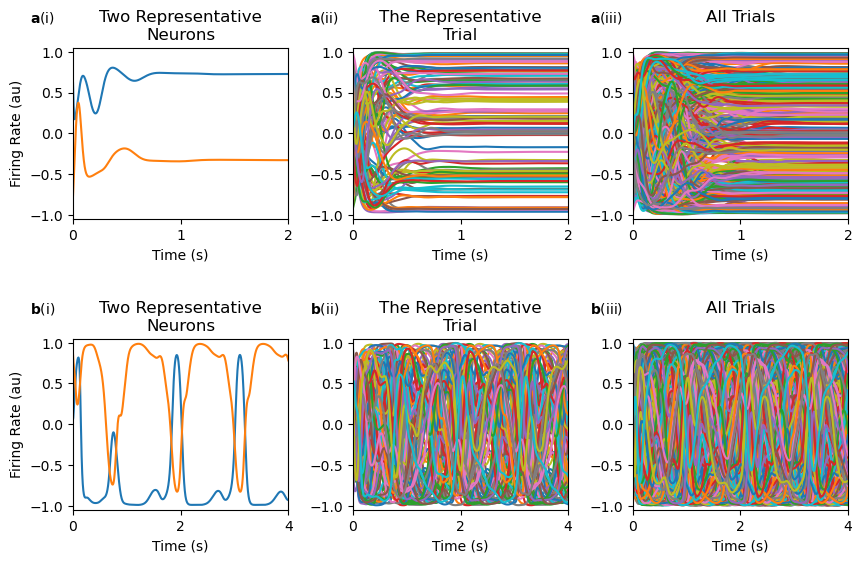

In [171]:
# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(10, 6))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Repetitions with stable fixed points
ind_1 = [11, 2, 6, 15]

# Repetitions with stable limit cycle
ind_2 = [i for i in range (20) if i not in ind_1]


g = 7
# Plotting on each subplot
for j, indexes in enumerate([ind_1, ind_2]):
    a = np.load(f"rates1_g_{g}_rep_{indexes[0]}.npy")
    id = [7, 8]
    for i in id:
        axs[j, 0].plot(a[i])
    axs[j, 0].set_title('Two Representative\nNeurons')
    
    for i in range(100):
        axs[j, 1].plot(a[i])
    axs[j, 1].set_title('The Representative\nTrial')
    
    for rep in indexes:
        a = np.load(f"rates1_g_{g}_rep_{rep}.npy")
        for i in range(100):
            axs[j, 2].plot(a[i])
    axs[j, 2].set_title('All Trials\n')
    
    for i in range(3):
        axs[j, i].set_ylim([-1.05,1.05])
    
for i in range(3):
    axs[0, i].set_xlim(0,2000)
    axs[0, i].set_xticks([0, 1000, 2000])
    axs[0, i].set_xticklabels([0, 1, 2])

for i in range(3):
    axs[1, i].set_xlim(0,4000)
    axs[1, i].set_xticks([0, 2000, 4000])
    axs[1, i].set_xticklabels([0, 2, 4])
    
        

# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')
axs[0, 0].set_ylabel('Firing Rate (au)')
axs[1, 0].set_ylabel('Firing Rate (au)')


axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)
axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(iii)",horizontalalignment='left', transform=axs[0,2].transAxes)


axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)
axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(iii)",horizontalalignment='left', transform=axs[1,2].transAxes)




# Save the plot
fig.savefig("fig2.pdf")

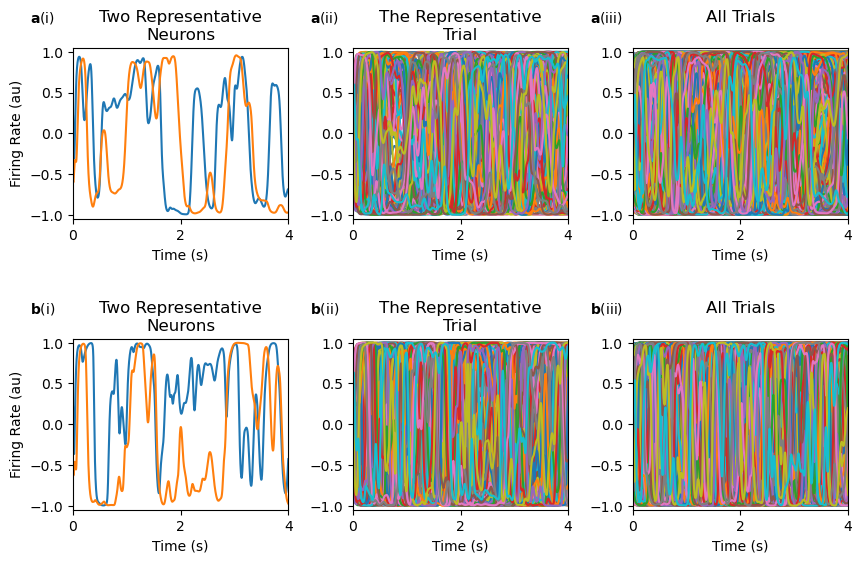

In [173]:
# Create a figure and a set of subplots with specified dimensions
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(10, 6))

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.7)

# Plotting on each subplot
for j, g in enumerate([10,13]):
    a = np.load(f"rates1_g_{g}_rep_0.npy")
    id = [25, 97]
    for i in id:
        axs[j, 0].plot(a[i])
    axs[j, 0].set_title('Two Representative\nNeurons')
    
    for i in range(100):
        axs[j, 1].plot(a[i])
    axs[j, 1].set_title('The Representative\nTrial')
    
    for rep in range(20):
        a = np.load(f"rates1_g_{g}_rep_{rep}.npy")
        for i in range(100):
            axs[j, 2].plot(a[i])
    axs[j, 2].set_title('All Trials\n')
    
    for i in range(3):
        axs[j, i].set_ylim([-1.05,1.05])

    
for i in range(3):
    axs[0, i].set_xlim(0,4000)
    axs[0, i].set_xticks([0, 2000, 4000])
    axs[0, i].set_xticklabels([0, 2, 4])

for i in range(3):
    axs[1, i].set_xlim(0,4000)
    axs[1, i].set_xticks([0, 2000, 4000])
    axs[1, i].set_xticklabels([0, 2, 4])
    
        

# Optionally, add labels and titles to each subplot
for ax in axs.flat:
    ax.set(xlabel='Time (s)')
axs[0, 0].set_ylabel('Firing Rate (au)')
axs[1, 0].set_ylabel('Firing Rate (au)')


axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(i)",horizontalalignment='left', transform=axs[0,0].transAxes)
axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(ii)",horizontalalignment='left', transform=axs[0,1].transAxes)
axs[0,0].text(-0.2,1.15,r"$\bf{a}$"+"(iii)",horizontalalignment='left', transform=axs[0,2].transAxes)


axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(i)",horizontalalignment='left', transform=axs[1,0].transAxes)
axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(ii)",horizontalalignment='left', transform=axs[1,1].transAxes)
axs[1,0].text(-0.2,1.15,r"$\bf{b}$"+"(iii)",horizontalalignment='left', transform=axs[1,2].transAxes)




# Save the plot
fig.savefig("fig3.pdf")

In [287]:
def Fit(y_aux):
    x_aux = np.arange(len(y_aux))

    # Fit a line to the data
    coefficients = np.polyfit(x_aux, y_aux, 1)
    
    # Create a polynomial function from the coefficients
    polynomial = np.poly1d(coefficients)
    
    # Use the fitted line to predict y-values
    y_fit = polynomial(x_aux)

    return coefficients[0], coefficients[1]

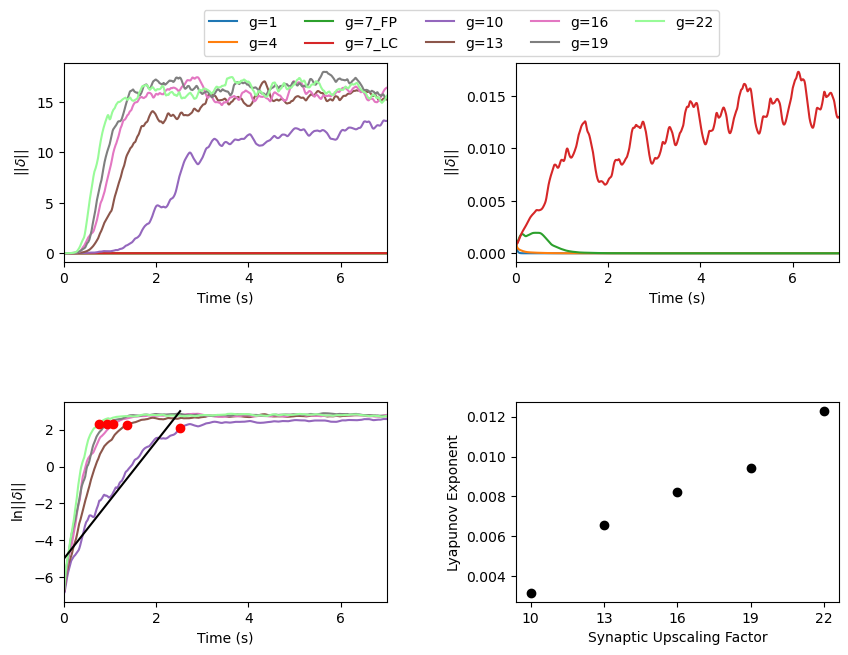

In [301]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 7))


colors = [
    '#1f77b4', # Blue
    '#ff7f0e', # Orange
    '#2ca02c', # Green
    '#d62728', # Red
    '#9467bd', # Purple
    '#8c564b', # Brown
    '#e377c2', # Pink
    '#7f7f7f', # Gray
    '#98FB98' # Light Green
]

# Adjust the horizontal space between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.7)

for i,g in enumerate(np.arange(1,5,3)):
    axs[0,0].plot(data[f'g={g}']["delta_mean"],label=f'g={g}', c=colors[i])



b = np.load("diff_g_7.npy")
axs[0,0].plot(b[ind_1].mean(axis=0),label=f'g={7}_FP', c=colors[2])
axs[0,0].plot(b[ind_2].mean(axis=0),label=f'g={7}_LC', c=colors[3])

for i,g in enumerate(np.arange(10,24,3)):
    axs[0,0].plot(data[f'g={g}']["delta_mean"],label=f'g={g}', c=colors[4+i])
axs[0,0].legend(bbox_to_anchor=(2.05, 1.3), ncol=5)


for i,g in enumerate(np.arange(1,5,3)):
    axs[0,1].plot(data[f'g={g}']["delta_mean"],label=f'g={g}', c=colors[i])

b = np.load("diff_g_7.npy")
axs[0,1].plot(b[ind_1].mean(axis=0),label=f'g={7}_FP', c=colors[2])
axs[0,1].plot(b[ind_2].mean(axis=0),label=f'g={7}_LC', c=colors[3])

for i in range(2):
    axs[0,i].set_xlim(0,7000)
    axs[0,i].set_xticks([0, 2000, 4000, 6000])
    axs[0,i].set_xticklabels([0, 2, 4, 6])

axs[0,0].set_ylabel(r'$ ||\delta ||$')
axs[0,1].set_ylabel(r'$ ||\delta ||$')

axs[0,0].set_xlabel('Time (s)')
axs[0,1].set_xlabel('Time (s)')

axs[0,0].set_yticks([0, 5, 10, 15])

axs[0,1].set_yticks([0, 0.005, 0.01, 0.015])



for i,g in enumerate(np.arange(10,24,3)):
    axs[1,0].plot(np.log(data[f'g={g}']["delta_mean"]),label=f'g={g}', c=colors[4+i])
axs[1,0].set_xlim(0,7000)
axs[1,0].set_xticks([0, 2000, 4000, 6000])
axs[1,0].set_xticklabels([0, 2, 4, 6])


for i,g in enumerate(np.arange(10,24,3)):
    point = np.where(np.log(data[f'g={g}']["delta_mean"]) >= 0.8 * np.log(data[f'g={g}']["delta_mean"]).max())[0][0]
    axs[1,0].plot(point, np.log(data[f'g={g}']["delta_mean"])[point],"ro")

g=10
point = np.where(np.log(data[f'g={g}']["delta_mean"]) >= 0.8 * np.log(data[f'g={g}']["delta_mean"]).max())[0][0]
coefficients = Fit(np.log(data[f'g={g}']["delta_mean"])[:point])
# Create a polynomial function from the coefficients
polynomial = np.poly1d(coefficients)
# Use the fitted line to predict y-values
y_fit = polynomial(np.arange(len(np.log(data[f'g={g}']["delta_mean"])[:point])))

axs[1,0].plot(np.arange(len(np.log(data[f'g={g}']["delta_mean"])[:point])),y_fit,"k")
axs[1,0].set_ylabel(r'$\ln ||\delta ||$')
axs[1,0].set_xlabel('Time (s)')


slopes = np.zeros(5,dtype=float)
for i,g in enumerate(np.arange(10,24,3)):
    point = np.where(np.log(data[f'g={g}']["delta_mean"]) >= 0.8 * np.log(data[f'g={g}']["delta_mean"]).max())[0][0]
    slopes[i] = Fit(np.log(data[f'g={g}']["delta_mean"])[:point])[0]

axs[1,1].plot(np.arange(10,24,3),slopes,"ko")
axs[1,1].set_xticks(np.arange(10,24,3))

axs[1,1].set_xlabel("Synaptic Upscaling Factor")
axs[1,1].set_ylabel("Lyapunov Exponent")

# Save the plot
fig.savefig("fig4.pdf")

In [280]:
g = 10

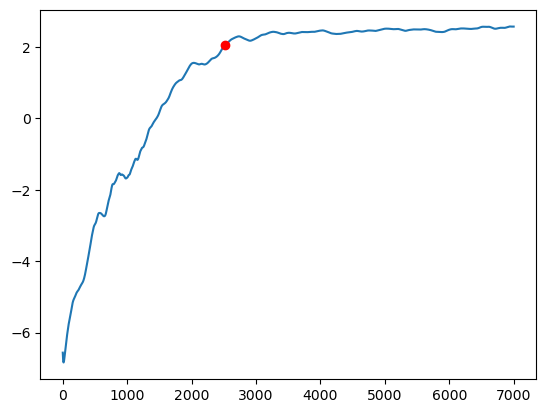

In [281]:

point = np.where(np.log(data[f'g={g}']["delta_mean"]) >= 0.8 * np.log(data[f'g={g}']["delta_mean"]).max())[0][0]


plt.plot(np.log(data[f'g={g}']["delta_mean"]))

plt.plot(point, np.log(data[f'g={g}']["delta_mean"])[point],"ro")

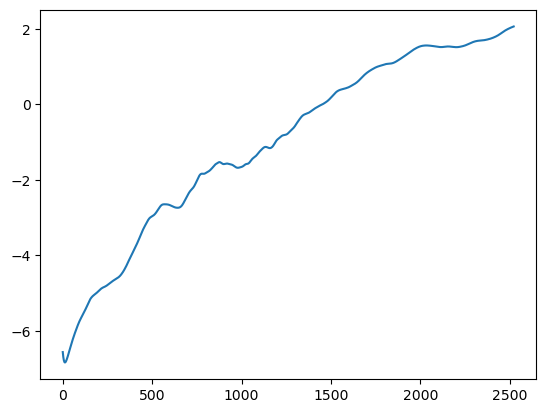

In [283]:
plt.plot(np.log(data[f'g={g}']["delta_mean"])[:point])

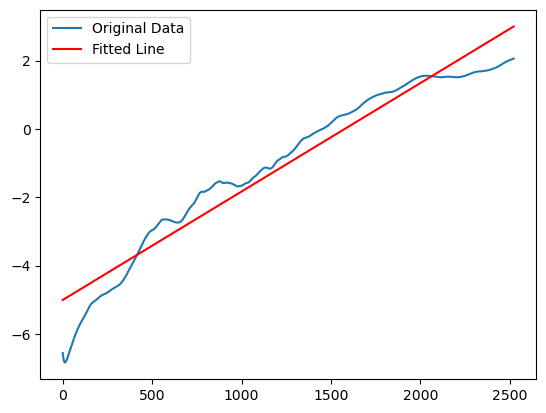

Slope: 0.0031744741994506136
Intercept: -5.004788534373201


In [285]:
# Sample data

y_aux = np.log(data[f'g={g}']["delta_mean"])[:point] # Dependent variable
x_aux = np.arange(len(y_aux))

# Fit a line to the data
coefficients = np.polyfit(x_aux, y_aux, 1)

# Create a polynomial function from the coefficients
polynomial = np.poly1d(coefficients)

# Use the fitted line to predict y-values
y_fit = polynomial(x_aux)

# Plot the original data and the fitted line
plt.plot(x_aux, y_aux, label='Original Data')
plt.plot(x_aux, y_fit, color='red', label='Fitted Line')
plt.legend()
plt.show()

# Print the coefficients of the fitted line
print("Slope:", coefficients[0])
print("Intercept:", coefficients[1])


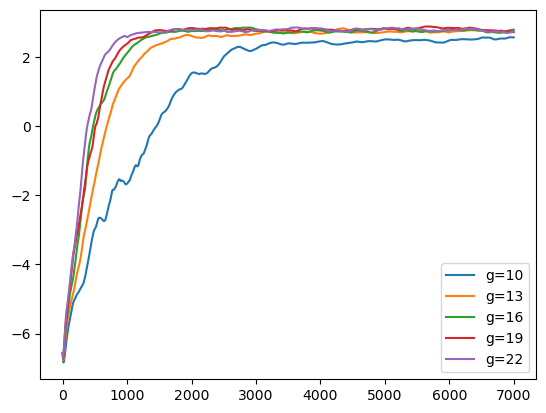

In [232]:
for g in range(10,24,3):
    plt.plot(np.log(data[f'g={g}']["delta_mean"]),label=f'g={g}')
plt.legend()

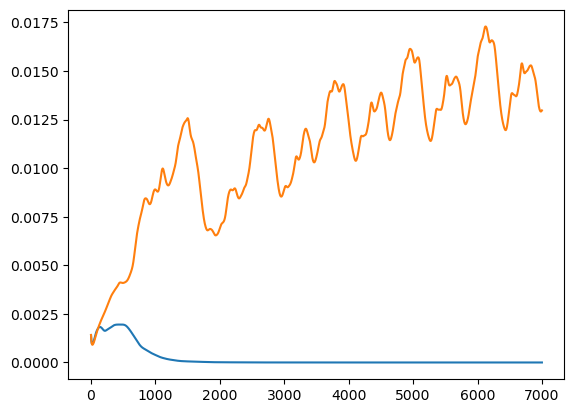

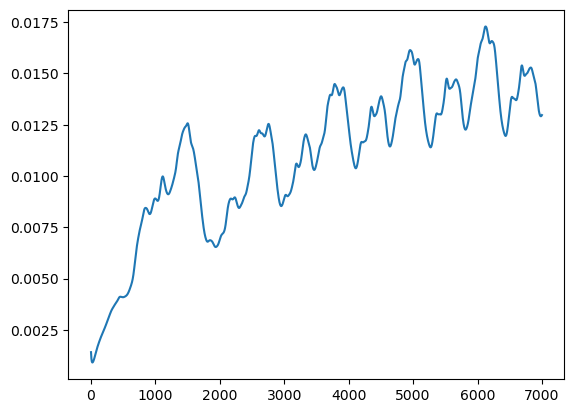

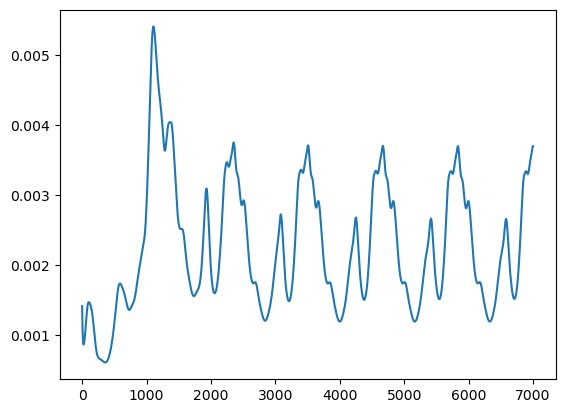

In [202]:
plt.plot(b[ind_2][10])

In [196]:
ind_2

[0, 1, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 16, 17, 18, 19]

In [154]:
for j, g in enumerate([[1],[2,3,4]]):
    print(g)

[1]
[2, 3, 4]


In [158]:
ind_1 = [2, 6, 11, 15]
ind_2 = [i for i in range (20) if i not in ind_1]

In [159]:
ind_2

[0, 1, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 16, 17, 18, 19]

In [203]:
g = 7

In [204]:
rep = 13

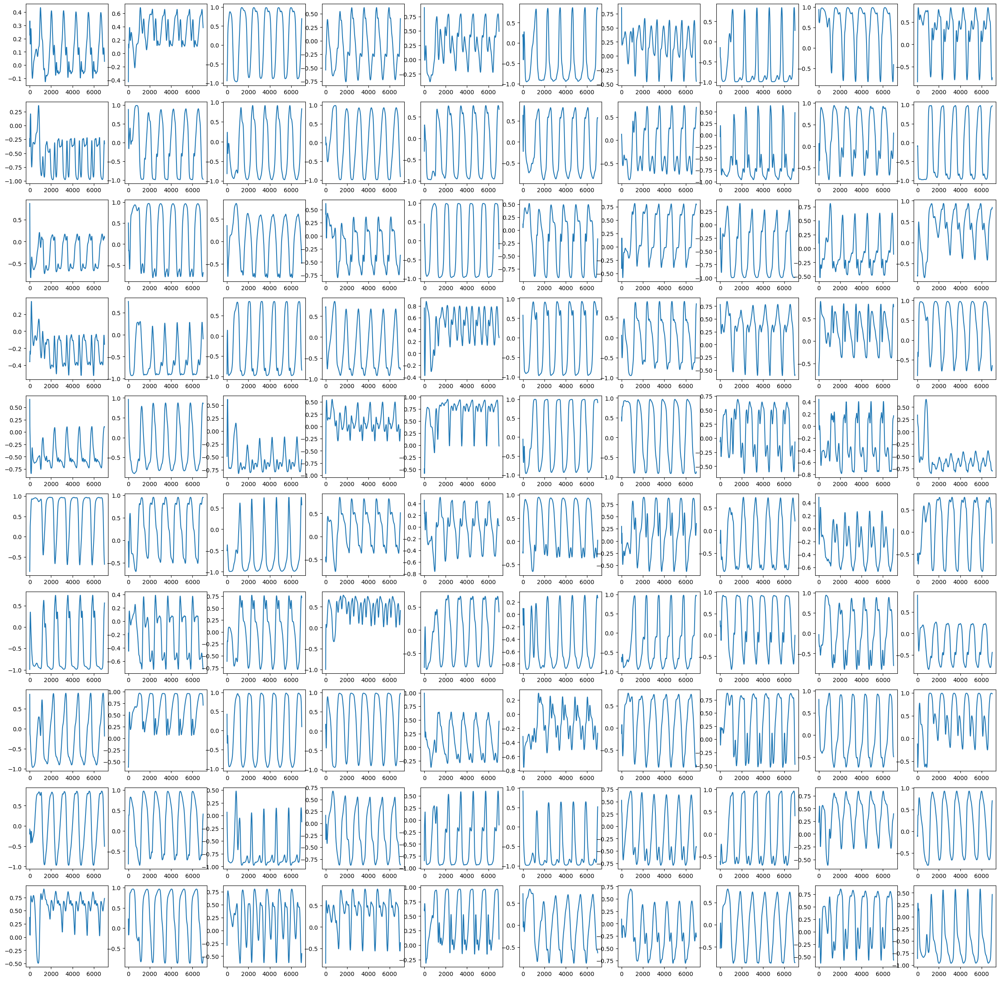

In [208]:
fig, axs = plt.subplots(nrows=10, ncols=10, figsize=(30, 30))
axs = axs.ravel()
a = np.load(f"rates1_g_{g}_rep_{rep}.npy")
for i in range(100):
    axs[i].plot(a[i])

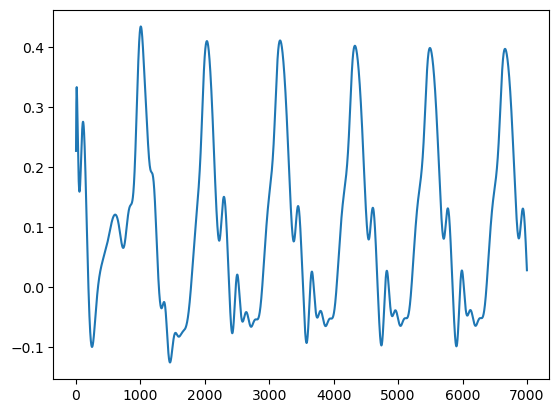

In [209]:
plt.plot(a[0])

In [94]:
axs.shape

(100,)

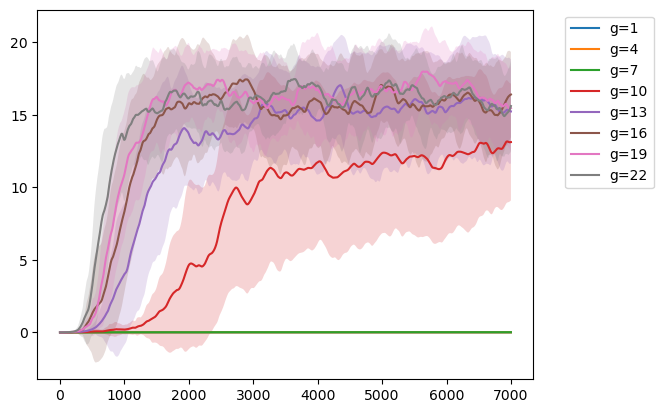

In [7]:
for g in range(1,24,3):
    plt.plot(data[f'g={g}']["delta_mean"],label=f'g={g}')
    plt.fill_between(np.arange(7000),data[f'g={g}']["delta_mean"]-data[f'g={g}']["delta_std"],data[f'g={g}']["delta_mean"]+data[f'g={g}']["delta_std"],alpha=0.2)

plt.legend(bbox_to_anchor=(1.05, 1))

# plt.xlim(0,4000)

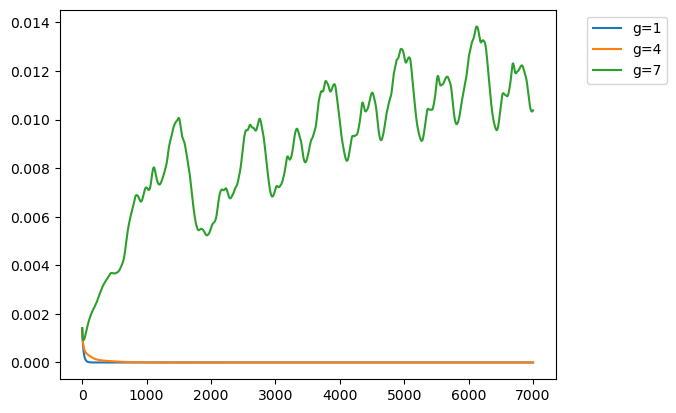

In [11]:
for g in range(1,8,3):
    plt.plot(data[f'g={g}']["delta_mean"],label=f'g={g}')
    # plt.fill_between(np.arange(7000),data[f'g={g}']["delta_mean"]-data[f'g={g}']["delta_std"],data[f'g={g}']["delta_mean"]+data[f'g={g}']["delta_std"],alpha=0.2)

plt.legend(bbox_to_anchor=(1.05, 1))

# plt.xlim(0,4000)

(0.0, 500.0)

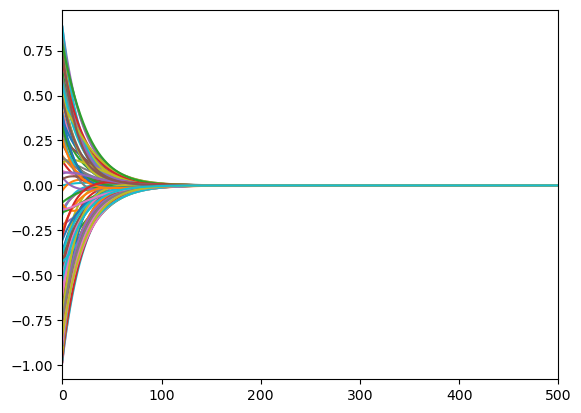

In [46]:
a = np.load("rates1_g_1_rep_5.npy")

for i in range(100):
    plt.plot(a[i])
plt.xlim(0,500)

(0.0, 2000.0)

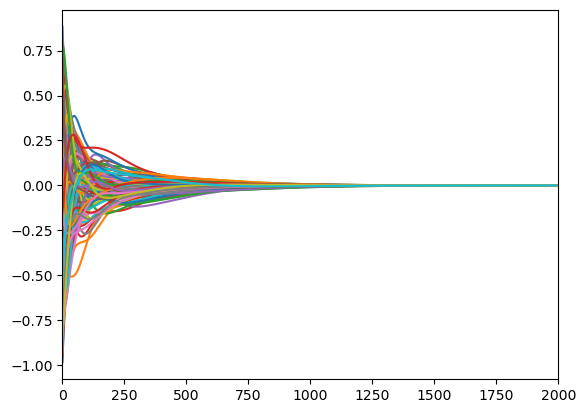

In [18]:
a = np.load("rates1_g_4_rep_5.npy")

for i in range(100):
    plt.plot(a[i])
plt.xlim(0,2000)

(0.0, 2000.0)

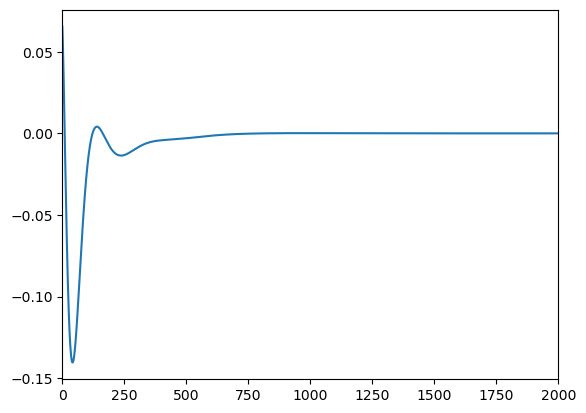

In [53]:
a = np.load("rates1_g_4_rep_0.npy")

for i in range(62,63):
    plt.plot(a[i])
plt.xlim(0,2000)

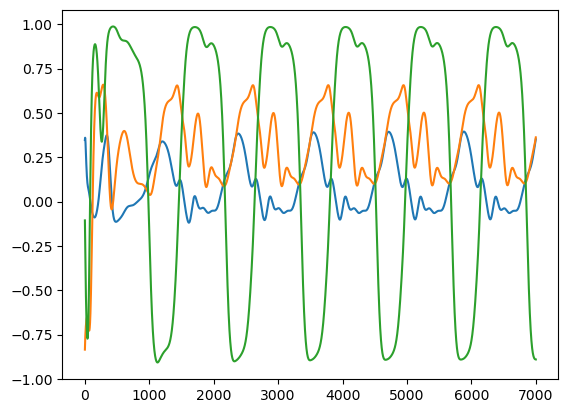

In [39]:
a = np.load("rates1_g_7_rep_1.npy")

for i in range(3):
    plt.plot(a[i])
# plt.xlim(0,2000)

In [41]:
b = np.load("diff_g_7.npy")

In [44]:
b.shape

(20, 7000)

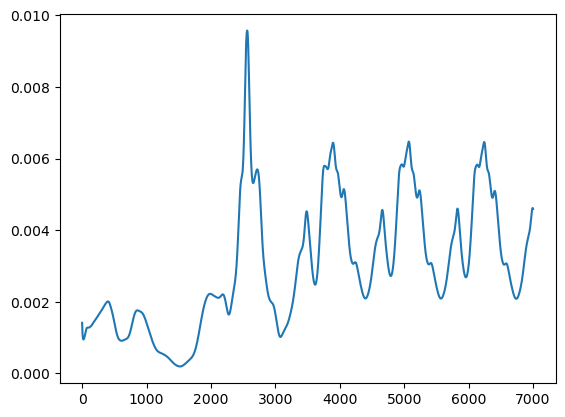

In [45]:
plt.plot(b[7])

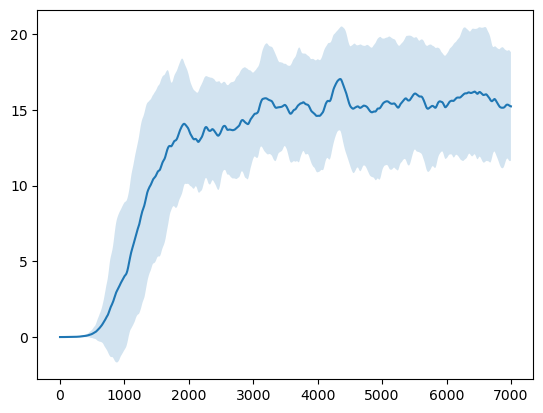

In [5]:
g=13
plt.plot(data[f'g={g}']["delta_mean"],label=f'g={g}')
plt.fill_between(np.arange(7000),data[f'g={g}']["delta_mean"]-data[f'g={g}']["delta_std"],data[f'g={g}']["delta_mean"]+data[f'g={g}']["delta_std"],alpha=0.2)

In [79]:
data[f'g={g}']["delta_std"]

array([3.41411804e-18, 6.10875890e-06, 1.03843006e-05, ...,
       7.93463449e+00, 7.93467700e+00, 7.93472767e+00])

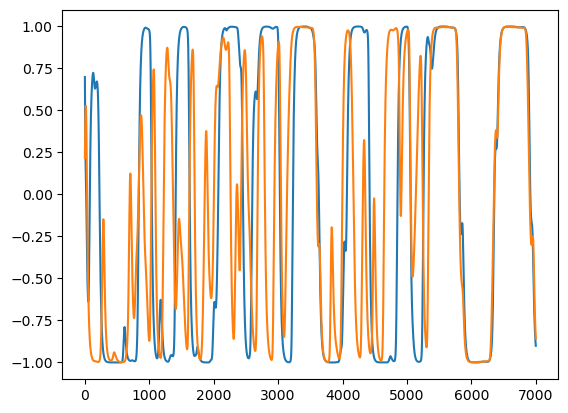

In [72]:
a = np.load("rates1_g_9_rep_5.npy")

for i in range(2):
    plt.plot(a[i])

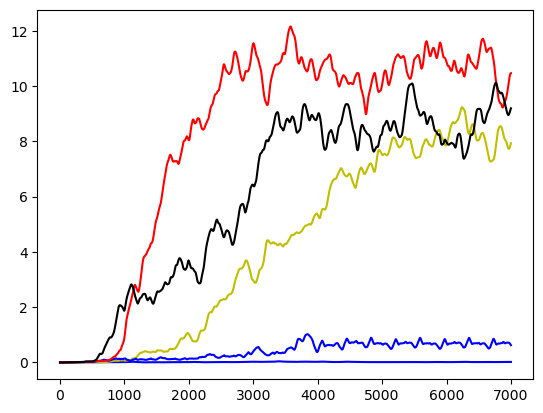

In [38]:
plt.plot(data['g=6']["delta"].mean(axis=0),"b")
plt.plot((data['g=7'])["delta"].mean(axis=0),"y")
plt.plot((data['g=9'])["delta"].mean(axis=0),"b")
plt.plot(data1['g=10.0']["delta"].mean(axis=0),"r")
plt.plot(data['g=11']["delta"].mean(axis=0),"k")


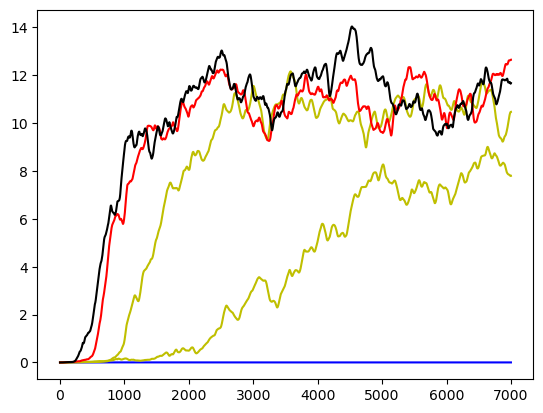

In [35]:
plt.plot(data['g=5']["delta"].mean(axis=0),"b")
plt.plot((data['g=8'])["delta"].mean(axis=0),"y")
plt.plot((data1['g=10.0'])["delta"].mean(axis=0),"y")
plt.plot(data['g=15']["delta"].mean(axis=0),"r")
plt.plot(data['g=20']["delta"].mean(axis=0),"k")


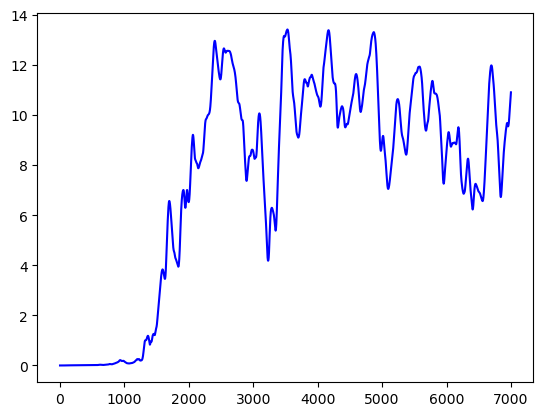

In [6]:
plt.plot(data['g=10.0']["delta"][0],"b")

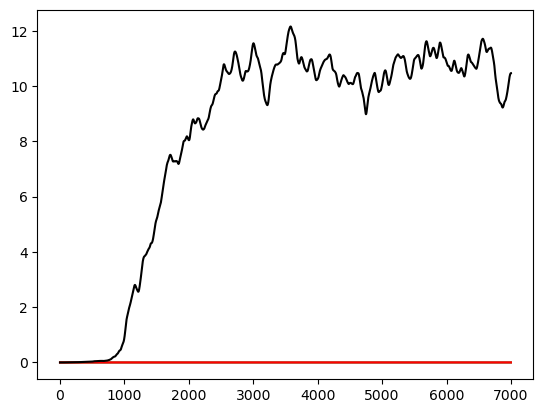

In [7]:
plt.plot(data['g=0.5']["delta"].mean(axis=0),"b")
plt.plot((data['g=1.0'])["delta"].mean(axis=0),"y")
plt.plot(data['g=5.0']["delta"].mean(axis=0),"r")
plt.plot(data['g=10.0']["delta"].mean(axis=0),"k")


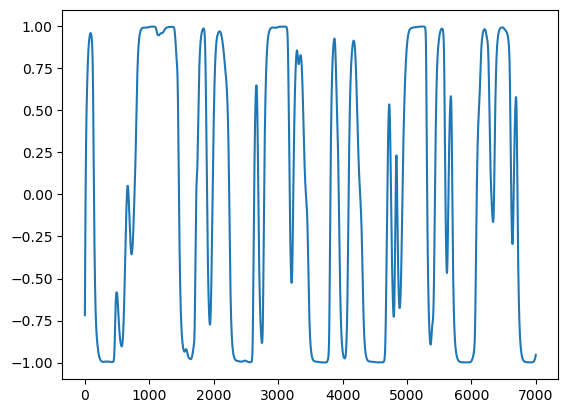

In [9]:
plt.plot(data['g=10.0']['rep=7']["rates1"][10])

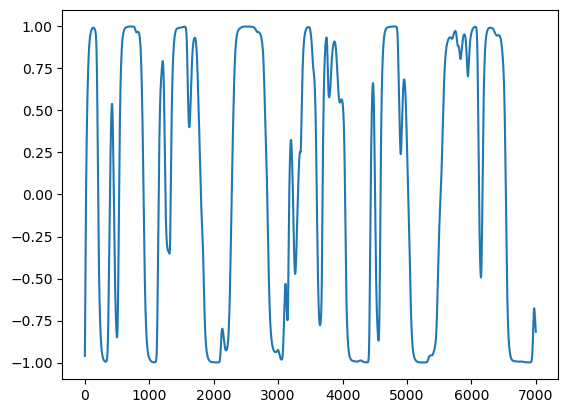

In [11]:
plt.plot(data['g=10.0']['rep=1']["rates2"][10])

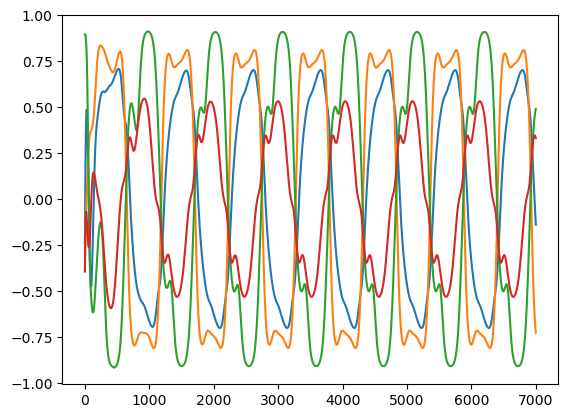

In [23]:
for i in range(4):
    plt.plot(data['g=5.0']['rep=2']["rates1"][i])

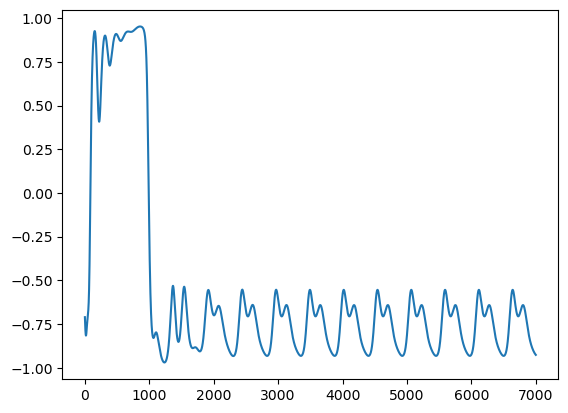

In [33]:
plt.plot(data['g=5']['rep=1']["rates1"][0])

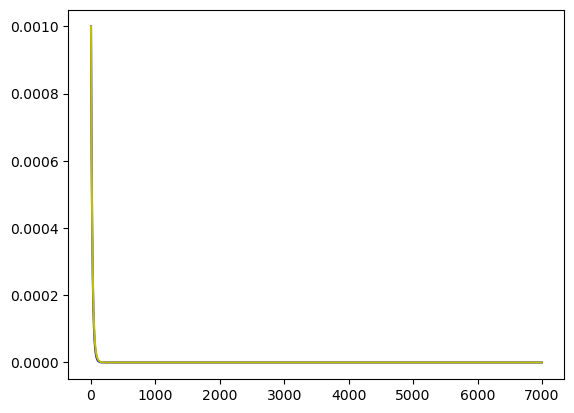

In [27]:
plt.plot(data['g=0.5']["delta"].mean(axis=0),"b")
plt.plot((data['g=1.0'])["delta"].mean(axis=0),"y")
# plt.plot(data['g=5.0']["delta"].mean(axis=0),"r")
# plt.plot(data['g=10.0']["delta"].mean(axis=0),"k")

In [1]:
# Import the NumPy library for numerical operations
import numpy as np

# Import the custom module for synaptic upscaling chaos analysis
import synaptic_upscaling_chaos_module as SUCM

# Import the pickle module for serializing and deserializing Python objects
import pickle

In [27]:
T, dt = 7000, 1
size = 100
p = 0.1
rep = 10

In [3]:
conn = SUCM.Connectivity_Strength(size, p, 1/(size*p))

# Initialize random initial states for the RNNs
init_states = 2 * np.random.random((rep, size)) - 1

In [4]:
g = 1.0
print("")
print(f"    synaptic upscaling value is {g}")
print("")

data = {}

# Preallocate space for storing differences in firing rates
diff = np.zeros((rep, int(T/dt)), dtype=float)
m, n = diff.shape

# Loop over repetitions
for i in range(rep):
    # Print a message to the terminal
    print(f"        repetition number {i}")

    data["rep={}".format(i)] = {}

    # Create and simulate the first RNN instance
    rnn1 = SUCM.RNN(size, g*conn, init_states[i])
    rates1 = rnn1.dynamics(T, dt)

    # Create and simulate the second RNN instance with a slightly different initial condition
    rnn2 = SUCM.RNN(size, g*conn, init_states[i] + 0.0001)
    rates2 = rnn2.dynamics(T, dt)

    # Store the firing rates of both RNN instances
    data["rep={}".format(i)]["rates1"] = rates1
    data["rep={}".format(i)]["rates2"] = rates2

    # Calculate the Euclidean distance between the firing rates of the two RNN instances
    for j in range(n):
        diff[i, j] = np.sqrt(np.dot(rates2[:, j] - rates1[:, j], rates2[:, j] - rates1[:, j]))

# Store the differences in firing rates for each synaptic upscaling level
data["delta"] = diff


    synaptic upscaling value is 1.0

        repetition number 0
        repetition number 1
        repetition number 2
        repetition number 3
        repetition number 4
        repetition number 5
        repetition number 6
        repetition number 7
        repetition number 8
        repetition number 9


In [5]:
import matplotlib.pyplot as plt

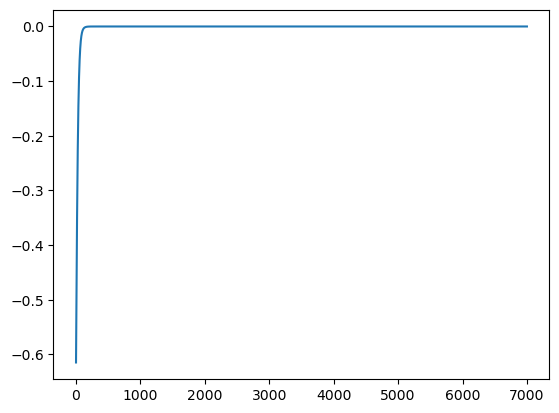

In [9]:
plt.plot(data['rep=1']["rates1"][0])

(array([  4.,  20.,  73., 181., 224., 234., 163.,  71.,  22.,   3.]),
 array([-0.31653947, -0.25300797, -0.18947648, -0.12594499, -0.06241349,
         0.001118  ,  0.0646495 ,  0.12818099,  0.19171249,  0.25524398,
         0.31877547]),
 <BarContainer object of 10 artists>)

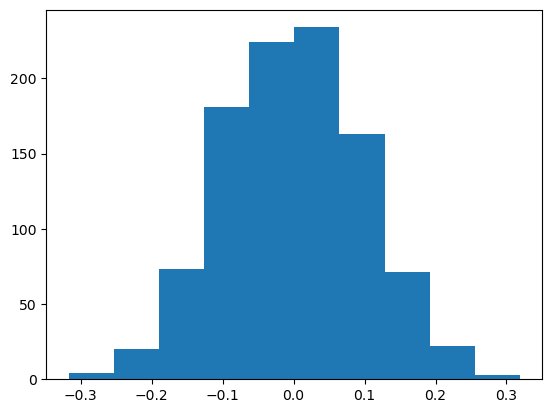

In [19]:
plt.hist(conn[conn!=0])

In [24]:
class RateNeuron:
    def __init__(self,init_state, threshold=0, neural_gain=0.3, tau=20.0):
        self.threshold = threshold
        self.neural_gain = neural_gain
        self.tau = tau
        self.rate = init_state

    def update(self, total_current, dt):
        if dt == 0:
            print("dt cannot be zero.")
            return
        current = np.tanh(total_current)
        self.rate += (dt / self.tau) * (-self.rate + current)




class RNN:
    def __init__(self, size, recurrent_weights,init_states, threshold=1.0, neural_gain=0.3, tau=20.0):
        self.size = size
        self.threshold = threshold
        self.neural_gain = neural_gain
        self.tau = tau
        self.neurons = [RateNeuron(init_states[i], threshold, neural_gain, tau) for i in range(size)]
        self.rates = [neuron.rate for neuron in self.neurons]
        self.recurrent_weights = recurrent_weights# Randomly initialized weights for recurrent connections
        

    def update(self,dt):
        # Compute input currents for each neuron
        recurrent_currents = np.dot(self.recurrent_weights, self.rates)
        for i,neuron in enumerate(self.neurons):
            neuron.update(recurrent_currents[i],dt)
        self.rates = [neuron.rate for neuron in self.neurons]
        pass

    def dynamics(self,T,dt):
        iter = int(T/dt)
        rate_history = np.zeros((self.size,iter),dtype=float)
        for i in range(iter):
            rate_history[:,i] = self.rates
            self.update(dt)
        return rate_history
        

In [25]:
def Edges(size,p):
    # Zero out self-connectivity
    zero_conn = np.eye(size).astype(bool)

    # Assign connectivities a probability of 1-p to zero
    aux = np.random.random(size**2-size)
    zero_conn_aux = aux<=1-p

    zero_conn[~zero_conn] = zero_conn_aux

    return ~zero_conn


def Connectivity_Strength(size,p,std):

    conn = np.zeros((size,size),dtype=float)

    # Construct a boolean matrix representing the network's connectivity
    edges = Edges(size,p)
    n_edges = len(edges[edges])

    # Generate connectivity strengths from a normal distribution with a mean of 0 and a standard deviation of 'std'
    aux = np.random.normal(0,std,n_edges)
    conn[edges] = aux - aux.mean()

    return conn

In [28]:
conn = Connectivity_Strength(size,p,1/(size*p))

In [23]:
conn1 = SUCM.Connectivity_Strength(size, p, 1/(size*p))

NameError: name 'size' is not defined

In [36]:
init_states = 2 * np.random.random(size) -1

In [30]:
rnn = RNN(size,14*conn,init_states)
rates = rnn.dynamics(T,dt)

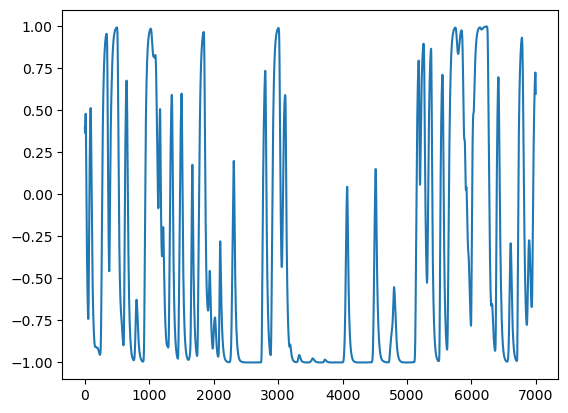

In [37]:
import matplotlib.pyplot as plt

for i in range(1):
    plt.plot(rates[i])

# plt.xlim(0,2000)

(array([  3.,  13.,  34., 116., 206., 236., 209., 103.,  39.,  10.]),
 array([-13.82507476, -11.29109619,  -8.75711762,  -6.22313905,
         -3.68916049,  -1.15518192,   1.37879665,   3.91277522,
          6.44675378,   8.98073235,  11.51471092]),
 <BarContainer object of 10 artists>)

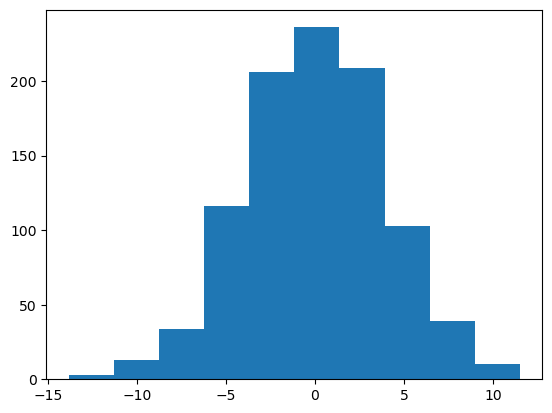

In [52]:
plt.hist(40*conn[conn!=0])

(array([  3.,  11.,  45.,  97., 191., 220., 196., 116.,  58.,  21.]),
 array([-12.99755613, -10.68301606,  -8.368476  ,  -6.05393593,
         -3.73939586,  -1.42485579,   0.88968428,   3.20422435,
          5.51876441,   7.83330448,  10.14784455]),
 <BarContainer object of 10 artists>)

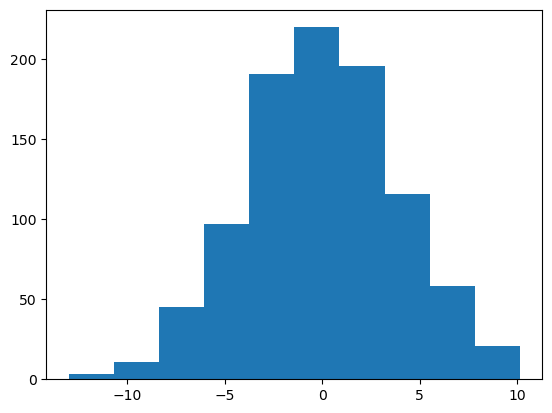

In [46]:
plt.hist(conn[conn!=0])

In [81]:
len(np.arange(1,21,3))

7

In [83]:
np.arange(1,24,3)

array([ 1,  4,  7, 10, 13, 16, 19, 22])